# Startup

In [55]:
# @title --=== RUN TO START ===-- (Imports and Definitions)
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm.keras import TqdmCallback
from keras.callbacks import Callback


SHEET_ID = '1OdllC9j05ka_adHvipTn58XPqmLt5f1VLBzHFd9aRJQ'
SHEET_NAME = 'GoL'
SLEEP = 1.5

results = {}


def get_filter_coords(point_coords):
  """
  x0y0 xiy0 x2y0
  x0yi xiyi x2yi
  x0y2 xiy2 x2y2
  """
  xi, yi = point_coords

  x0 = xi - 1
  x2 = xi + 1
  y0 = yi - 1
  y2 = yi + 1

  ul = (x0, y0)  # upper left
  uc = (xi, y0)  # upper center
  ur = (x2, y0)  # upper right
  ml = (x0, yi)  # middle left
  #mc = (xi, yi)  # middle center
  mr = (x2, yi)  # middle right
  ll = (x0, y2)  # lower left
  lc = (xi, y2)  # lower center
  lr = (x2, y2)  # lower right

  filter_coords = ul, uc, ur, ml, mr, ll, lc, lr

  return filter_coords


def read_coord(board, coord):
  shape_y, shape_x = board.shape
  xi, yi = coord
  if (xi < 0) or (yi < 0):
    return 0
  if (xi >= shape_x) or (yi >= shape_y):
    return 0
  return board[xi][yi]


def read_filter(board, filter_coords):
  for coord in filter_coords:
    yield read_coord(board, coord)


def play_a_cell(board, cell_coords):
  initial_state = read_coord(board, cell_coords)
  filter_coords = get_filter_coords(cell_coords)
  sum_neighbours = sum(read_filter(board, filter_coords))
  if sum_neighbours == 3:
    return 1
  if sum_neighbours == 2:
    return initial_state
  return 0


def play(board, padding=0, show=False) -> pd.DataFrame:
  shape_y, shape_x = board.shape
  result  = pd.DataFrame(
      np.zeros((shape_y-2*padding, shape_x-2*padding), dtype=int)
      )
  for xi in range(padding, shape_x-padding):
    for yi in range(padding, shape_y-padding):
      result[xi-padding][yi-padding] = play_a_cell(board, [xi, yi])
  if show:
    plt.imshow(result)
    plt.title(f'Board {np.array(board.shape)-2*padding}, {padding=}.')
    plt.show()
  return result


def play_n_steps(board, steps, padding=0, show=False):
    result = play(board, padding=padding, show=show)
    for i in range(steps - 1):
        result = play(result, padding=padding, show=show)
    return result


def load_board(sheet_id=SHEET_ID, sheet_name=SHEET_NAME, show=False):
  google_sheets_url = 'https://docs.google.com/spreadsheets/d/'
  google_sheets_url += f'{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
  board = pd.read_csv(google_sheets_url, header=None)
  if show:
    plt.imshow(board)
    plt.title(f'Game of Life Board. {board.shape=}')
    plt.show()
  return board


def generate_board(
    shape,
    padding=False,
    pad_value=0,
    levels=5,
    regulate_extreme_cases=False,
    show=False):
  """
  'outer' padding surrounds the array with zeros explicitly
  the shape of the board changes (+2 to each dimension)
  padding at conv2d layer is meant to be set to 'valid'
  """
  if levels:
    choice_ = np.random.randint(0, 1+1, levels)
    if regulate_extreme_cases:
      choice_ = np.concatenate([[0, 1], choice_])
    rand_array = np.random.choice(choice_, shape)
  else:
    rand_array = np.random.randint(0, 1+1, shape)
  if padding:
    assert padding == 'outer', 'padding must be either "outer" or None'
  if padding == 'outer':
    rand_array = np.pad(
        rand_array, 1, mode='constant', constant_values=pad_value)
  rand_board = pd.DataFrame(rand_array)
  if show:
    plt.imshow(rand_board)
    plt.title(f'Randomized board {shape}, {levels=}, {regulate_extreme_cases=}.')
    plt.show()
  return rand_board


def Xy_from_preset_5x5_patches(n_steps, shuffle=True):
  bantik1 = np.array([
    [0,0,0,0,0],
    [0,0,1,0,0],
    [0,1,0,1,0],
    [0,0,1,0,0],
    [0,0,0,0,0],
  ])
  bantik2 = np.array([
      [0,0,0,0,0],
      [0,1,0,1,0],
      [0,0,0,0,0],
      [0,1,0,1,0],
      [0,0,0,0,0],
  ])
  bantik3 = np.array([
      [0,0,0,0,0],
      [0,0,1,0,0],
      [0,1,1,1,0],
      [0,0,1,0,0],
      [0,0,0,0,0],
  ])
  bantik4 = np.array([
      [0,0,0,0,0],
      [0,1,0,1,0],
      [0,0,1,0,0],
      [0,1,0,1,0],
      [0,0,0,0,0],
  ])
  palka = np.array([
      [0,0,0,0,0],
      [0,0,0,0,0],
      [0,1,1,1,0],
      [0,0,0,0,0],
      [0,0,0,0,0],
  ])
  alive1 = np.array([
      [1,0,0,0,1],
      [0,1,0,1,0],
      [1,0,0,0,1],
      [0,1,0,1,0],
      [1,0,0,0,1],
  ])
  alive2 = np.array([
      [1,0,1,0,1],
      [0,1,0,1,0],
      [1,0,0,0,1],
      [0,1,0,1,0],
      [1,0,1,0,1],
  ])
  alive3 = np.array([
      [0,1,0,1,0],
      [1,0,0,0,1],
      [0,1,0,1,0],
      [1,0,1,0,1],
      [0,0,1,0,0],
  ])
  dotted1 = np.array([
      [0,1,0,1,0],
      [1,0,1,0,1],
      [0,1,0,1,0],
      [1,0,1,0,1],
      [0,1,0,1,0],
  ])
  dotted2 = np.array(
      [
        [1,0,1,0,1],
        [0,1,0,1,0],
        [1,0,1,0,1],
        [0,1,0,1,0],
        [1,0,1,0,1],
      ]
  )
  infinistick = np.array(
      [
        [1,1,0,1,1],
        [0,0,0,0,0],
        [1,1,1,1,1],
        [0,0,0,0,0],
        [1,1,0,1,1],
      ]
  )
  extra = np.array(
      [
        [0,1,1,1,1],
        [1,0,1,0,1],
        [1,1,0,1,1],
        [1,0,0,0,1],
        [1,1,1,1,0],
      ]
  )
  empty = np.zeros([5,5]).astype(int)

  X_train = np.concatenate(
    [
      list(np.tile(bantik1, (1, 1, 1))),
      list(np.tile(bantik2, (1, 1, 1))),
      [bantik3],
      [bantik4],
      [alive1],
      [alive2],
      [alive3],
      [dotted1],
      [dotted2],
      [infinistick],
      [infinistick.T],
      [extra],
      [extra.T],
      [empty]
    ]
  )
  if shuffle:
    np.random.shuffle(X_train)
  padding = -1
  y_train = [
      play_n_steps(pd.DataFrame(i), n_steps, padding=padding) for i in X_train
  ]
  X_train_ready = np.pad(X_train, n_steps)[n_steps:-n_steps]
  y_train_ready = np.array(y_train)
  return X_train, y_train, X_train_ready, y_train_ready


# minimal model with fixed init
def get_minimal_model(seed):
  tf.random.set_seed(seed)

  n_filters = 2
  kernel_size = (3, 3)
  input_shape = (None, None, 1)

  input_layer = tf.keras.layers.Input(shape=input_shape)

  conv2d_layer = tf.keras.layers.Conv2D(
      filters=n_filters,
      kernel_size=kernel_size,
      activation='tanh',
      use_bias=True,
      padding='same',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(input_layer)

  output_layer = tf.keras.layers.Conv2D(
      filters=1,
      kernel_size=(1, 1),
      use_bias=True,
      activation='relu',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(conv2d_layer)

  model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

  tf.keras.utils.plot_model(model)
  return model


def get_core_model_zp(seed):
  tf.random.set_seed(seed)

  n_filters = 2
  kernel_size = (3, 3)
  input_shape = (None, None, 1)

  input_layer = tf.keras.layers.Input(shape=input_shape)
  zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

  conv2d_layer = tf.keras.layers.Conv2D(
      filters=n_filters,
      kernel_size=kernel_size,
      activation='tanh',
      use_bias=True,
      bias_initializer=tf.keras.initializers.Constant(0),
      padding='valid',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(zero_padding_layer)

  output_layer = tf.keras.layers.Conv2D(
      filters=1,
      kernel_size=(1, 1),
      use_bias=True,
      bias_initializer=tf.keras.initializers.Constant(0),
      activation='relu',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(conv2d_layer)

  model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

  tf.keras.utils.plot_model(model)
  return model


def x4_mirror(df, show=False):
  x4 = np.array(df)
  x4 = np.concatenate(
          [
              x4,
              np.flip(x4, axis=0)
          ],
          axis=0
      )
  x4 = np.concatenate(
          [
              x4,
              np.flip(x4, axis=1)
          ],
          axis=1
      )
  if show:
      plt.imshow(x4)
      plt.title('X4 Mirror')
      plt.show()
  return pd.DataFrame(x4)


class RecursiveModel(tf.keras.models.Model):
  def __init__(self, core_model, n_times, **kwargs):
      super().__init__(**kwargs)
      self.core_model = core_model
      self.n_times = n_times

  def call(self, inputs):
      x = inputs
      for _ in range(self.n_times):
          x = self.core_model(x)
      return x


def cpt(model_name, models_folder='models', ext='hdf5'):  
  filepath = f'{models_folder}/{model_name}.{ext}'
  return tf.keras.callbacks.ModelCheckpoint(
      filepath,
      monitor='loss',
      verbose=0,
      save_best_only=True,
      save_weights_only=True,
      mode='auto',
      save_freq='epoch',
      initial_value_threshold=None,
      options=None
  )


class EarlyStoppingByLoss(Callback):
    def __init__(self, value, monitor='loss', verbose=0):
        super(Callback, self).__init__()
        self.monitor = monitor
        self.value = value
        self.verbose = verbose

    def on_epoch_end(self, epoch, logs={}):
        current = logs.get(self.monitor)
        if current:
            if current <= self.value:
                if self.verbose:
                    print("Epoch %05d: early stopping THR" % epoch)
                self.model.stop_training = True

# Tests

## 2-Step Board 11: tanh-ReLU Conv Minimal

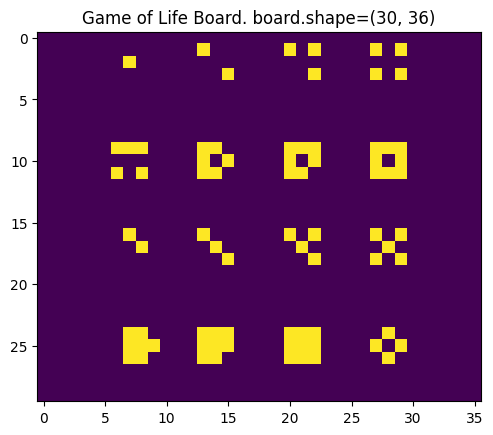

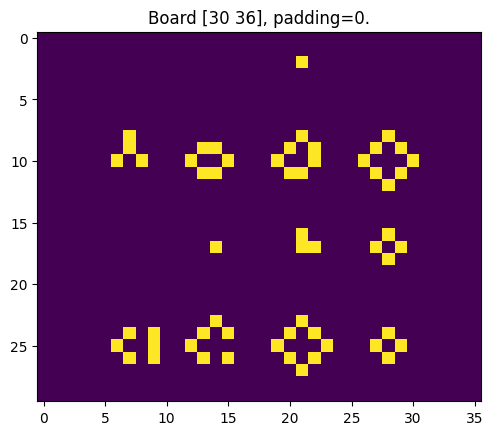

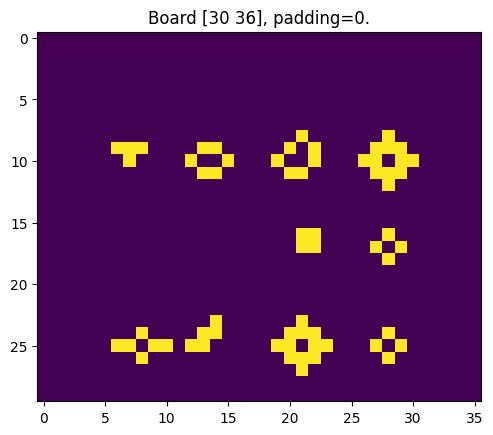

In [ ]:
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

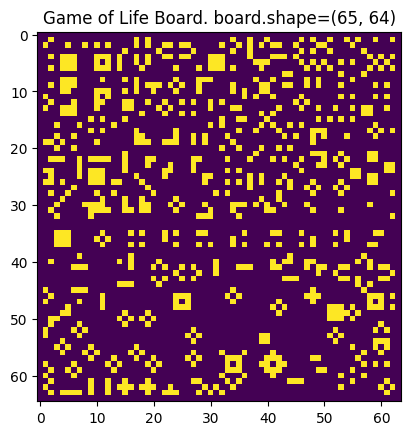

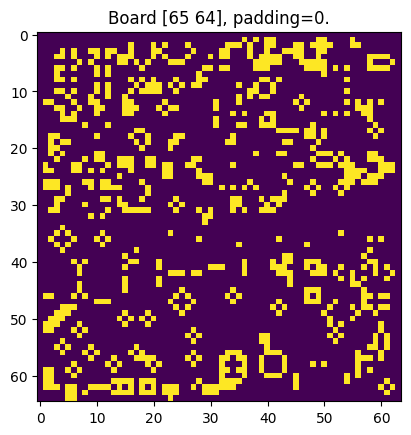

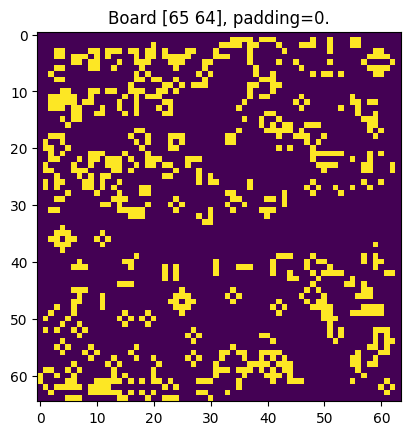

In [ ]:
X_train = load_board(sheet_name='Training_Board11', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

In [ ]:
from google.colab import output
beep = "https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg"

In [ ]:
# @title Minimal model with fixed init
def get_minimal_model(seed):
  tf.random.set_seed(seed)

  n_steps = 2
  n_filters = 2
  kernel_size = (3, 3)
  input_shape = (None, None, 1)

  input_layer = tf.keras.layers.Input(shape=input_shape)

  conv2d_layer = tf.keras.layers.Conv2D(
      filters=n_filters,
      kernel_size=kernel_size,
      activation='tanh',
      use_bias=True,
      padding='same',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(input_layer)

  output_layer = tf.keras.layers.Conv2D(
      filters=1,
      kernel_size=(1, 1),
      use_bias=True,
      activation='relu',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(conv2d_layer)

  model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

  tf.keras.utils.plot_model(model)
  return model

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

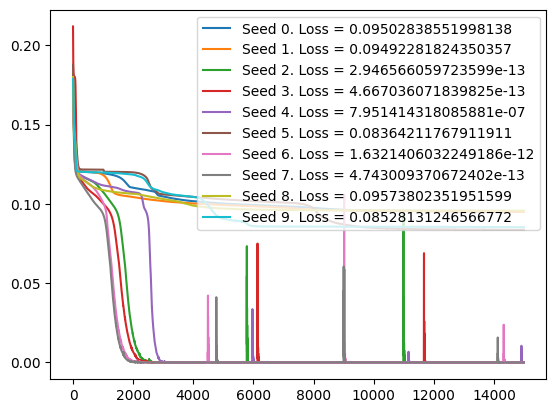

In [ ]:
losses = {}
models = {}
for seed in range(10):
  tf.random.set_seed(seed)
  models[seed] = get_minimal_model(seed)
  recursive_model = RecursiveModel(core_model=models[seed], n_times=2)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train2_ready,
      epochs=15000,
      batch_size=1,
      verbose=False,
      callbacks=[TqdmCallback(verbose=True)]
  )

  loss = history.history['loss']
  losses[seed] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)
plt.legend()
plt.show()

1/1 [==============================] - 0s 84ms/step


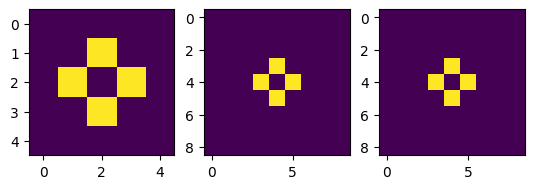

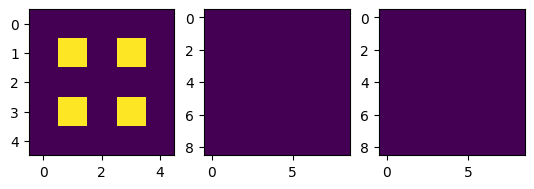

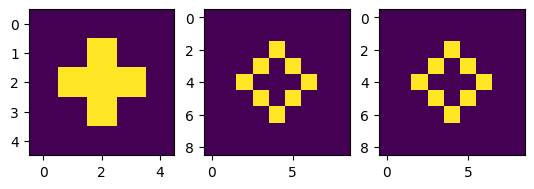

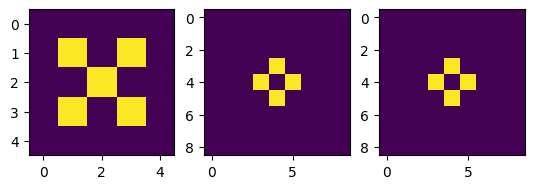

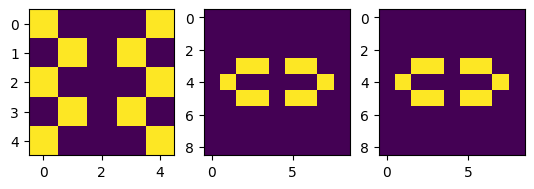

...

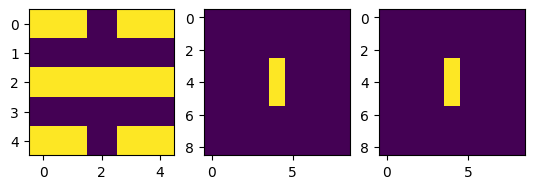

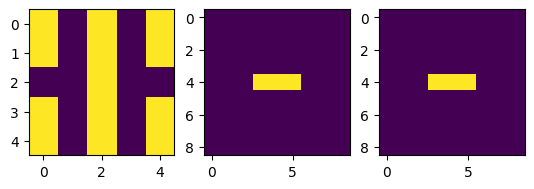

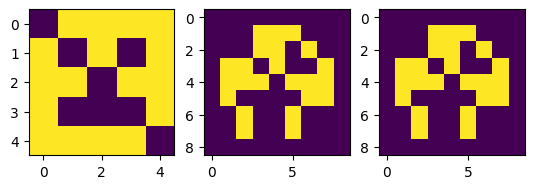

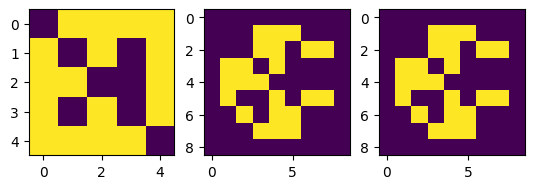

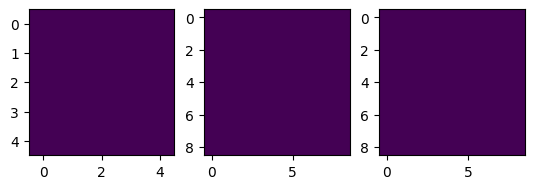

In [ ]:
X_check, y_check, X_check_ready, y_check_ready = compose_data(
    n_steps=2,
    shuffle=False
    )
y_check_pred = RecursiveModel(models[7], 2).predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

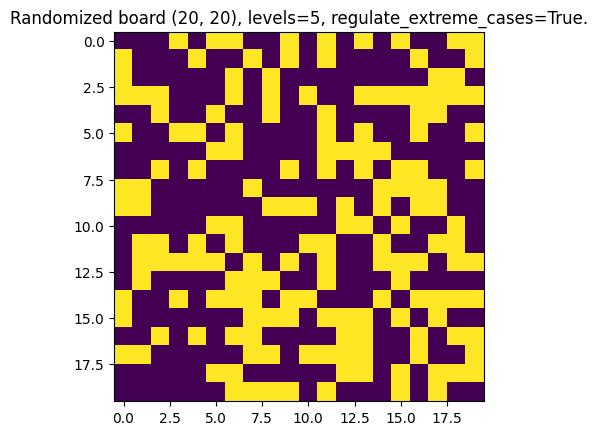

In [ ]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

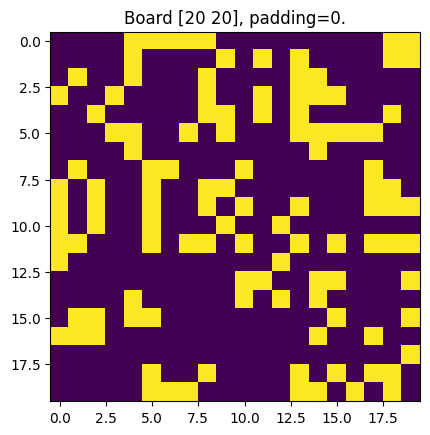

1/1 [==============================] - 0s 75ms/step


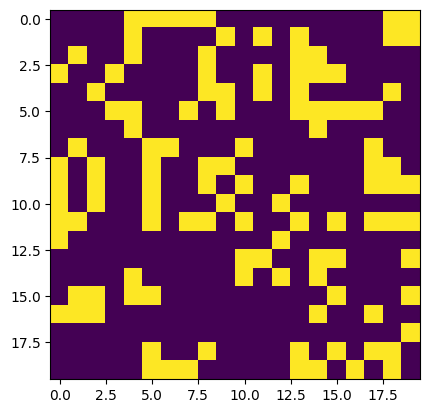

In [ ]:
y_test = play(play(X_test), show=True)
y_pred = RecursiveModel(models[7], 2).predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

## 2-Step Board 10: tanh-ReLU Conv Minimal

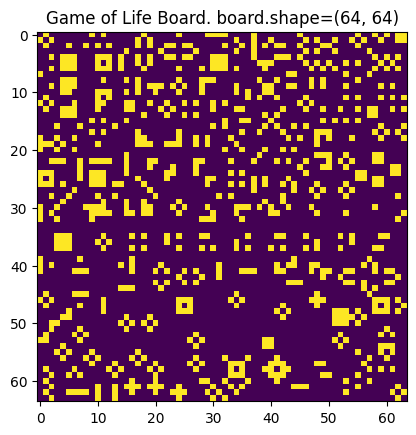

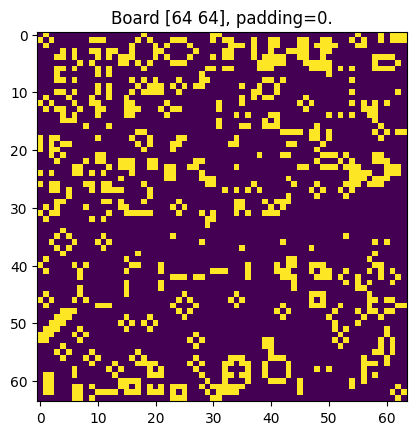

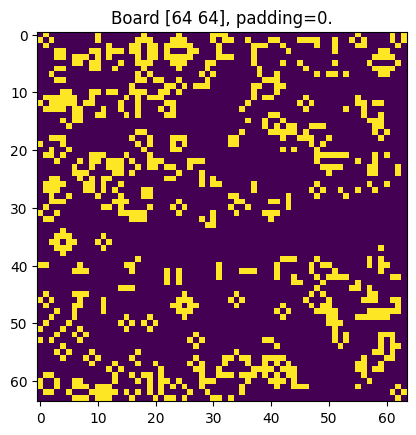

In [ ]:
X_train = load_board(sheet_name='Training_Board10', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

In [ ]:
from google.colab import output
beep = "https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg"

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

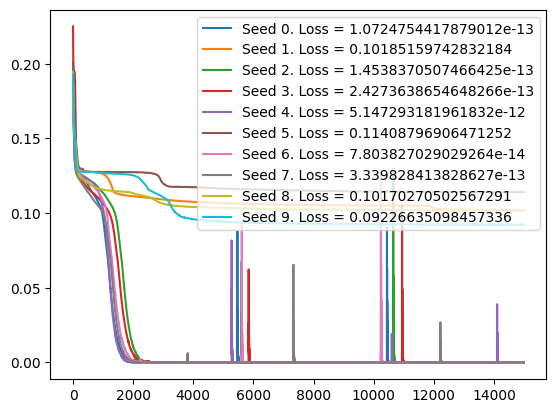

In [ ]:
losses = {}
models = {}
for seed in range(10):
  tf.random.set_seed(seed)
  models[seed] = get_minimal_model(seed)
  recursive_model = RecursiveModel(core_model=models[seed], n_times=2)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train2_ready,
      epochs=15000,
      batch_size=1,
      verbose=False,
      callbacks=[TqdmCallback(verbose=True)]
  )

  loss = history.history['loss']
  losses[seed] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)
plt.legend()
plt.show()

1/1 [==============================] - 0s 126ms/step


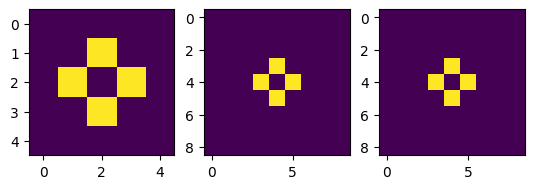

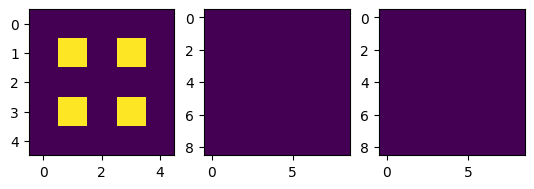

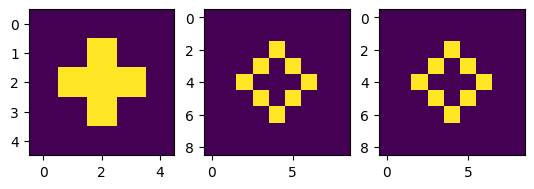

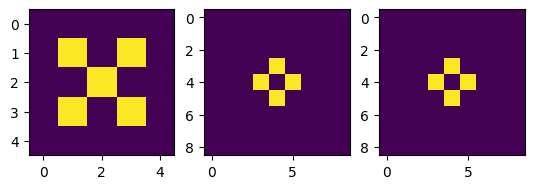

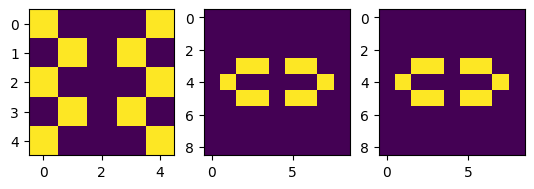

...

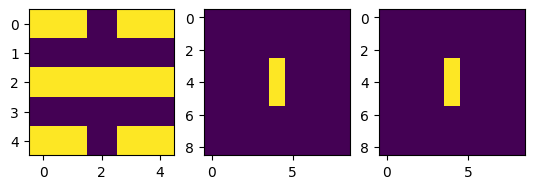

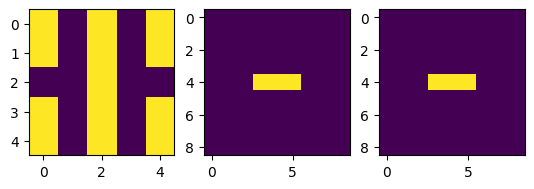

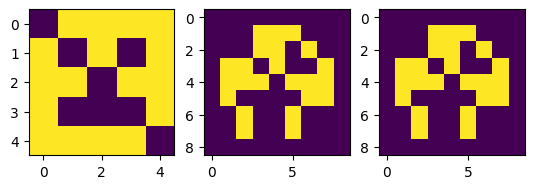

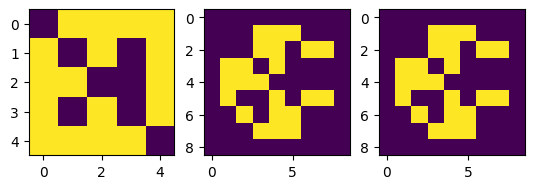

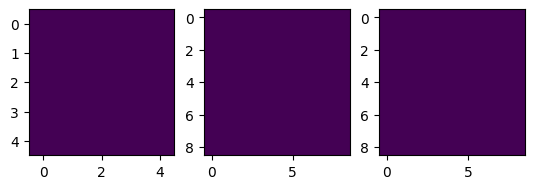

In [ ]:
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=2,
    shuffle=False
    )
y_check_pred = RecursiveModel(models[7], 2).predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

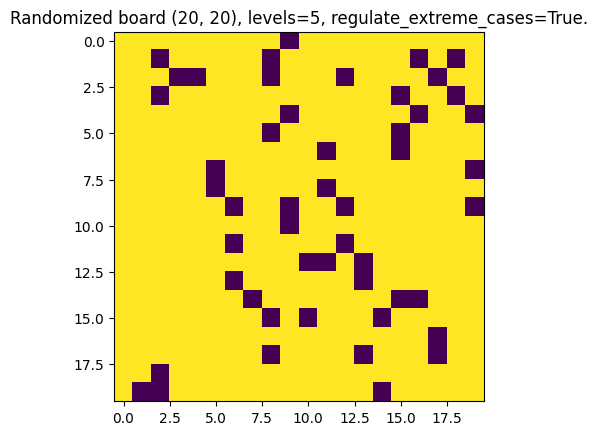

In [ ]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

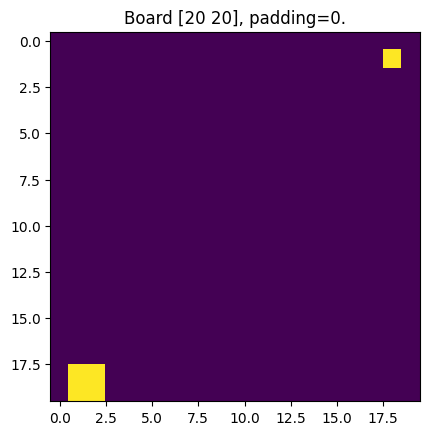

1/1 [==============================] - 0s 58ms/step


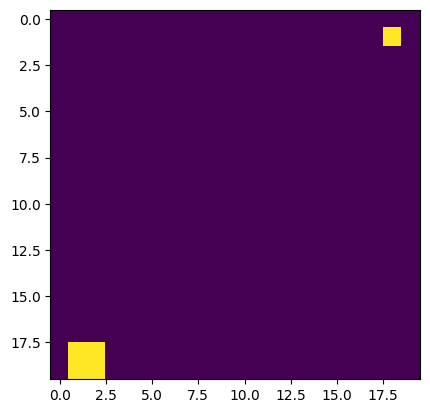

In [ ]:
y_test = play(play(X_test), show=True)
y_pred = RecursiveModel(models[7], 2).predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

## 1-Step Board 10: tanh-ReLU Conv Minimal

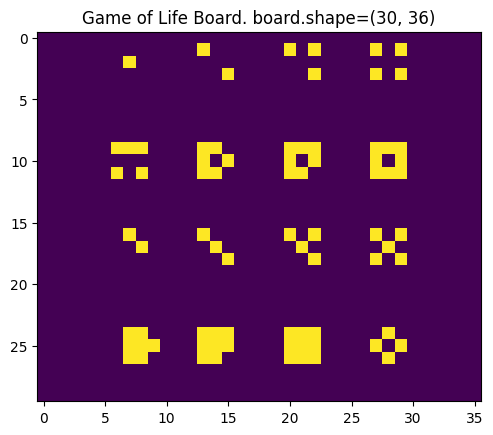

In [2]:
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)

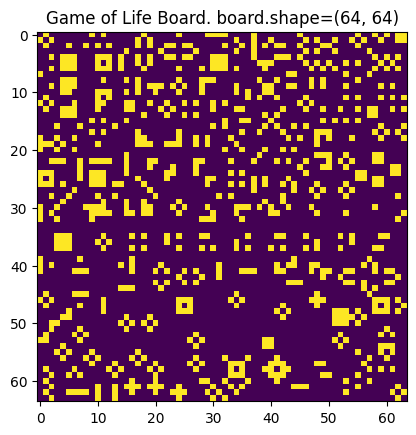

In [6]:
board_name = 'Training_Board10'
X_train = load_board(sheet_name=board_name, show=True)
y_train = play(X_train)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

In [ ]:
from google.colab import output
beep = "https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg"

In [5]:
# @title Minimal model with fixed init
def get_minimal_model(seed):
  tf.random.set_seed(seed)

  n_steps = 1
  n_filters = 2
  kernel_size = (3, 3)
  input_shape = (None, None, 1)

  input_layer = tf.keras.layers.Input(shape=input_shape)

  conv2d_layer = tf.keras.layers.Conv2D(
      filters=n_filters,
      kernel_size=kernel_size,
      activation='tanh',
      use_bias=True,
      padding='same',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(input_layer)

  output_layer = tf.keras.layers.Conv2D(
      filters=1,
      kernel_size=(1, 1),
      use_bias=True,
      activation='relu',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(conv2d_layer)

  model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

  tf.keras.utils.plot_model(model)
  return model

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

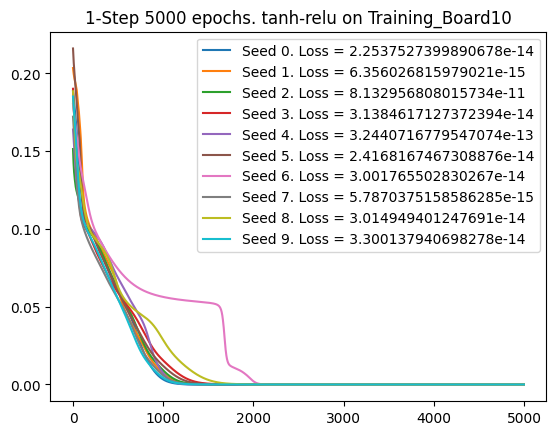

In [8]:
losses = {}
models = {}
EPOCHS = 5000
for seed in range(10):
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  models[seed] = model
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')

  history = model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[TqdmCallback(verbose=True)]
  )

  loss = history.history['loss']
  losses[seed] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'1-Step {EPOCHS} epochs. tanh-relu on {board_name}')
plt.legend()
plt.show()

1/1 [==============================] - 0s 71ms/step


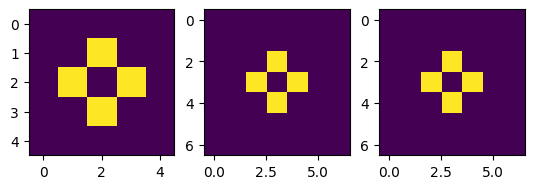

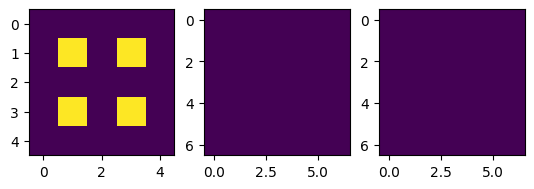

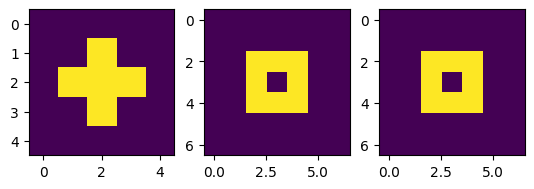

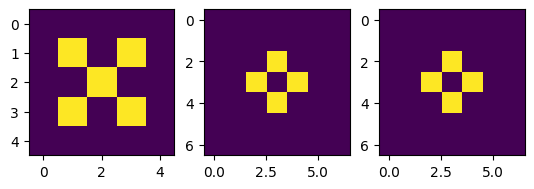

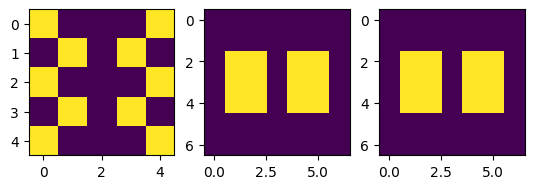

...

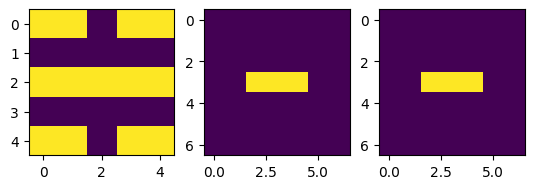

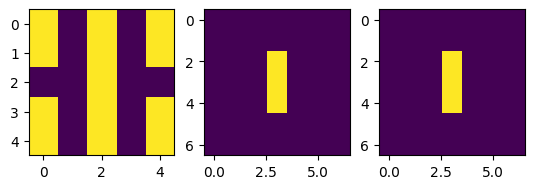

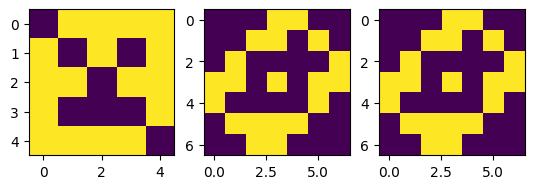

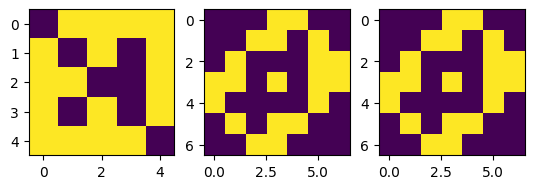

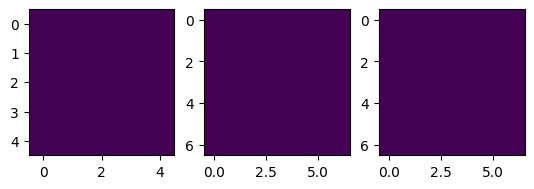

In [31]:
# @title Check a model on patches
N_STEPS = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(models[0], N_STEPS).predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

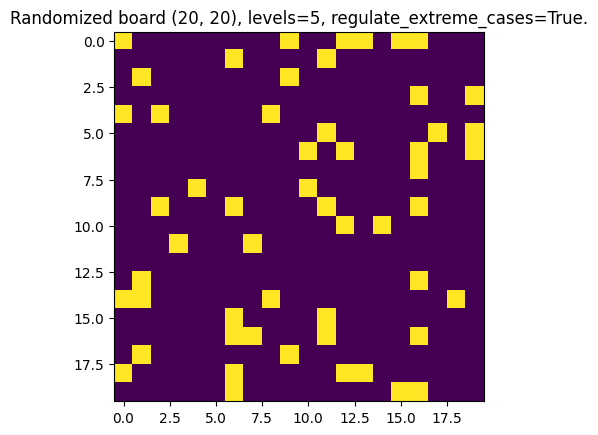

In [24]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

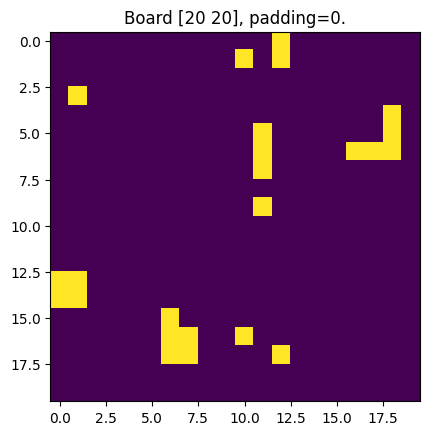

1/1 [==============================] - 0s 117ms/step


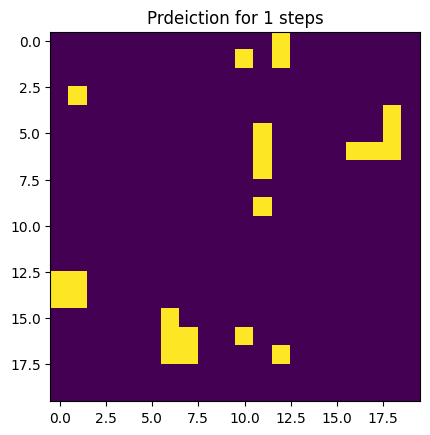

In [29]:
N_STEPS = 1
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(models[0], N_STEPS).predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)


## 1-Step Board 10: tanh-ReLU Conv Minimal (Larger Test)

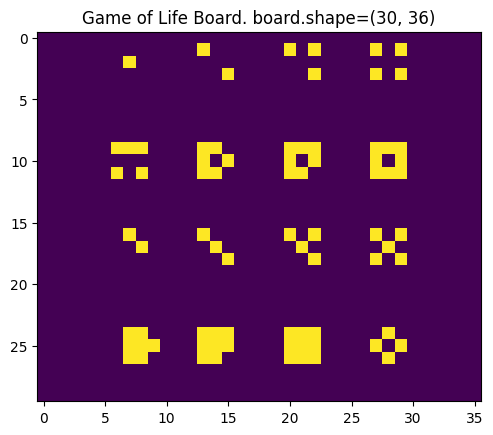

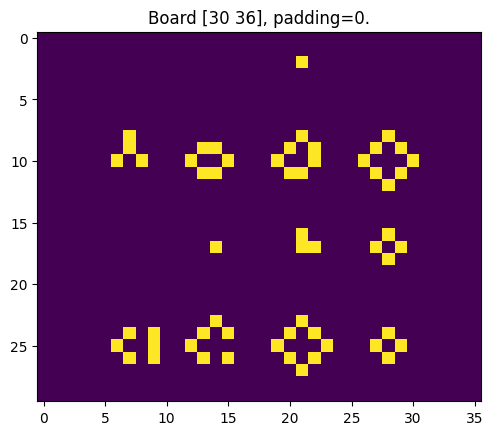

In [33]:
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test, show=True)

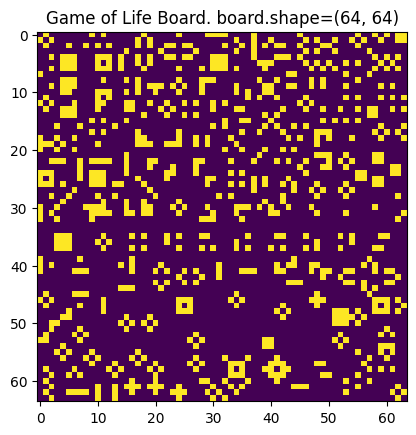

In [34]:
board_name = 'Training_Board10'
X_train = load_board(sheet_name=board_name, show=True)
y_train = play(X_train)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

In [35]:
# @title Minimal model with fixed init
def get_minimal_model(seed):
  tf.random.set_seed(seed)

  n_steps = 1
  n_filters = 2
  kernel_size = (3, 3)
  input_shape = (None, None, 1)

  input_layer = tf.keras.layers.Input(shape=input_shape)

  conv2d_layer = tf.keras.layers.Conv2D(
      filters=n_filters,
      kernel_size=kernel_size,
      activation='tanh',
      use_bias=True,
      padding='same',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(input_layer)

  output_layer = tf.keras.layers.Conv2D(
      filters=1,
      kernel_size=(1, 1),
      use_bias=True,
      activation='relu',
      kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
      )(conv2d_layer)

  model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

  tf.keras.utils.plot_model(model)
  return model

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

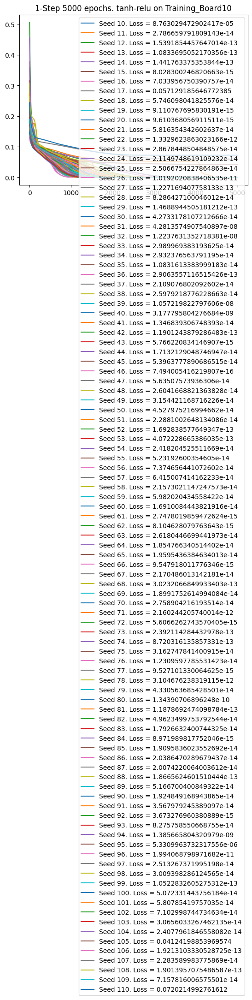

In [37]:
losses = {}
models = {}
EPOCHS = 5000
for seed in range(10, 111):
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  models[seed] = model
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')

  history = model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[TqdmCallback(verbose=True)]
  )

  loss = history.history['loss']
  losses[seed] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'1-Step {EPOCHS} epochs. tanh-relu on {board_name}')
plt.legend()
plt.show()

1/1 [==============================] - 0s 215ms/step


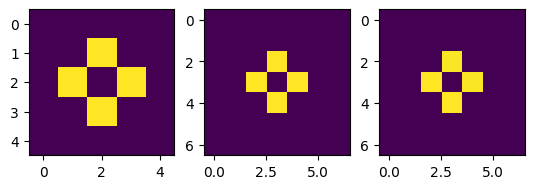

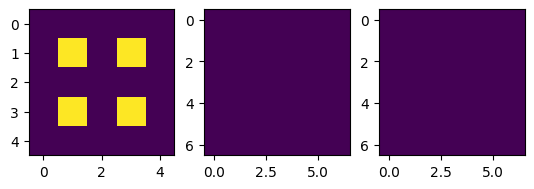

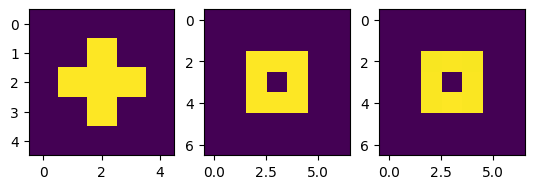

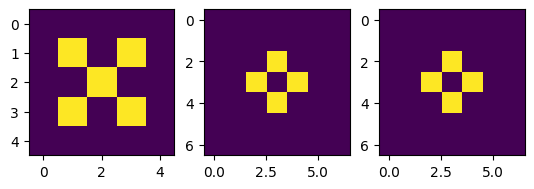

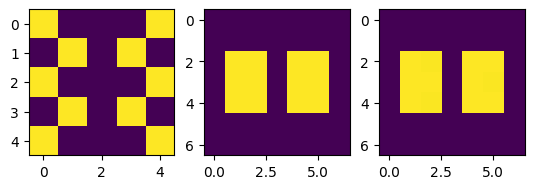

...

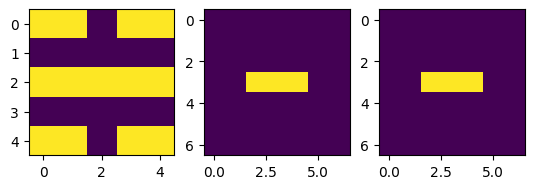

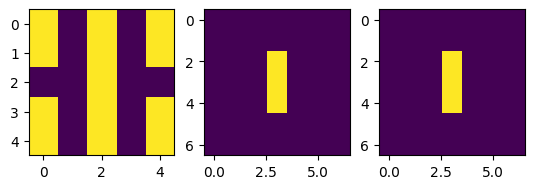

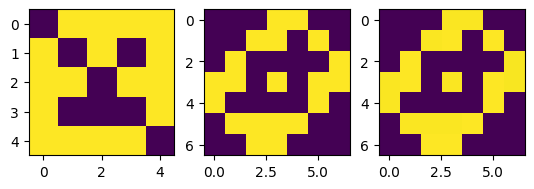

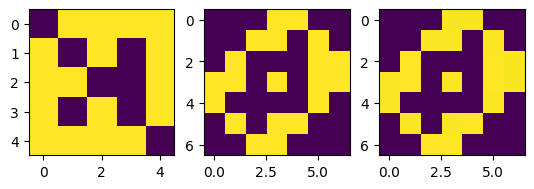

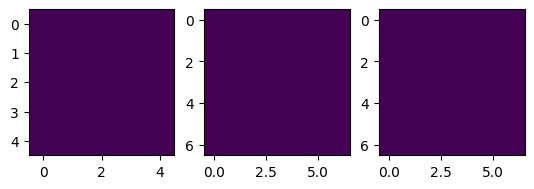

In [39]:
# @title Check a model on patches
N_STEPS = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(list(models.values())


 [0], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

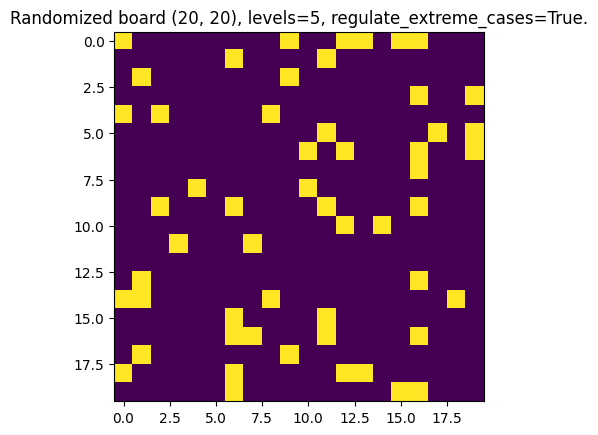

In [ ]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

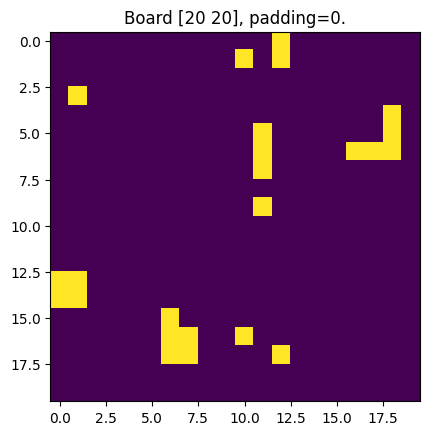

1/1 [==============================] - 0s 117ms/step


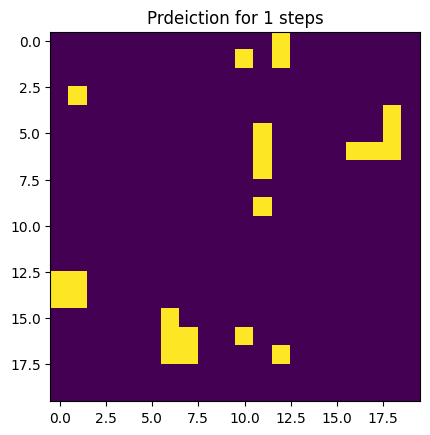

In [ ]:
N_STEPS = 1
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(models[0], N_STEPS).predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)


## OLD 2-Step Board 11: tanh-ReLU Conv Minimal

In [2]:
N_STEPS = 2

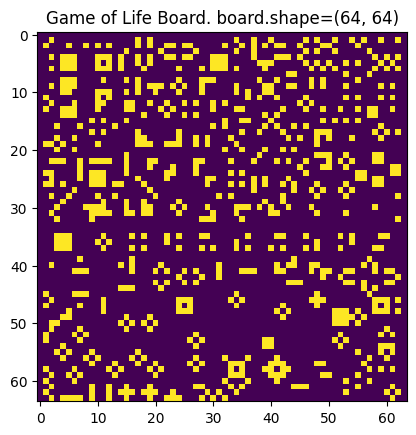

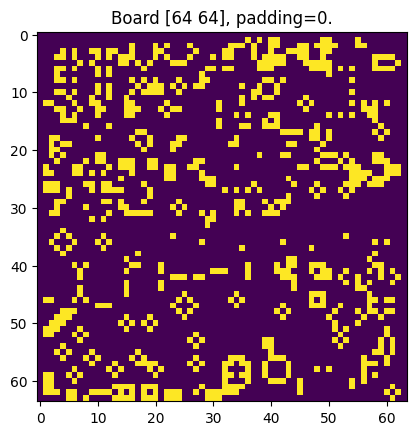

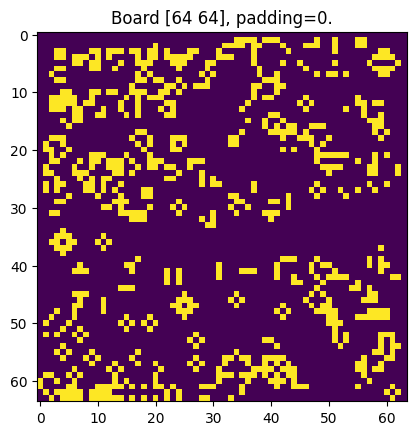

In [3]:
board_name = 'Training_Board11'
X_train = load_board(sheet_name=board_name, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

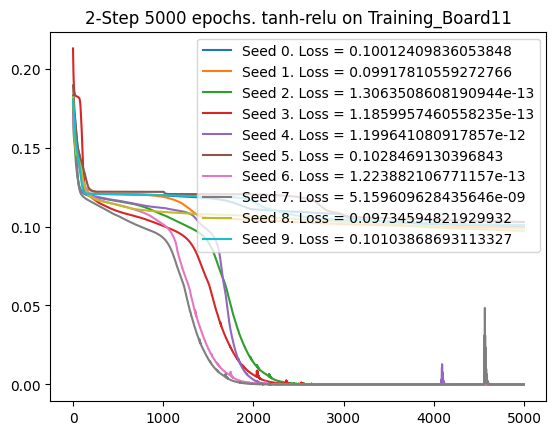

In [5]:
losses = {}
models = {}
EPOCHS = 5000
for seed in range(10):
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  models[seed] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[TqdmCallback(verbose=True)]
  )

  loss = history.history['loss']
  losses[seed] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'2-Step {EPOCHS} epochs. tanh-relu on {board_name}')
plt.legend()
plt.show()

1/1 [==============================] - 0s 92ms/step


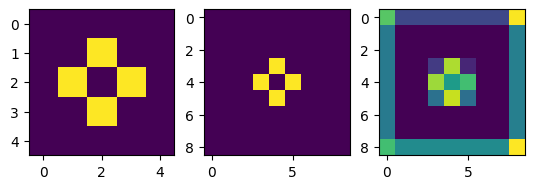

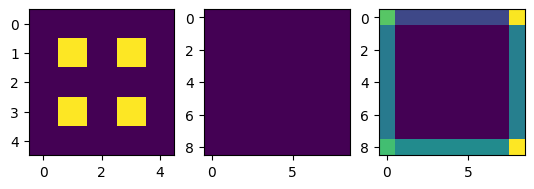

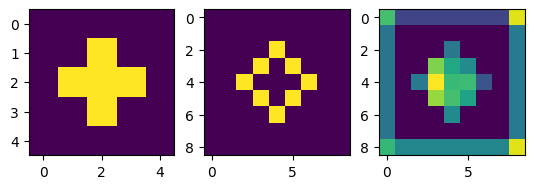

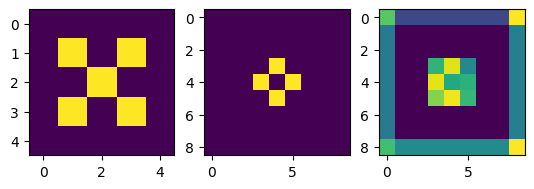

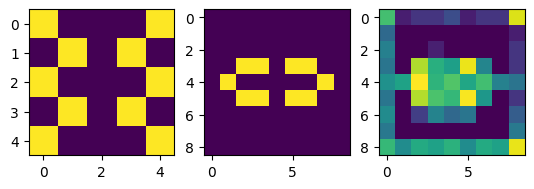

...

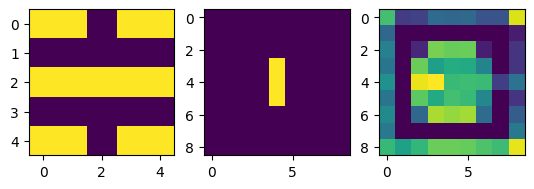

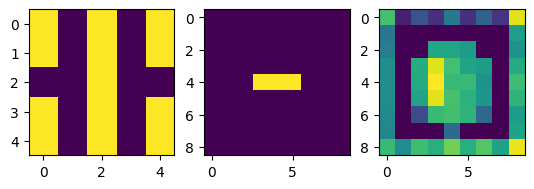

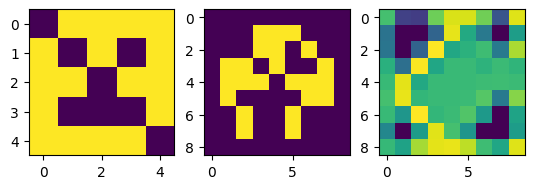

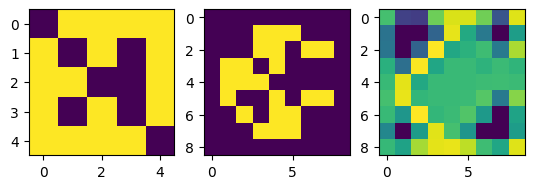

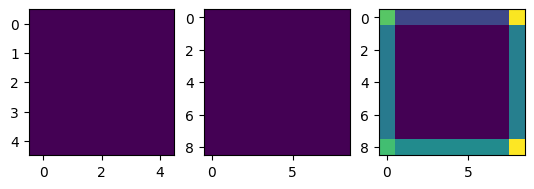

In [6]:
# @title Check a model on patches
N_STEPS = 2
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(models[0], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

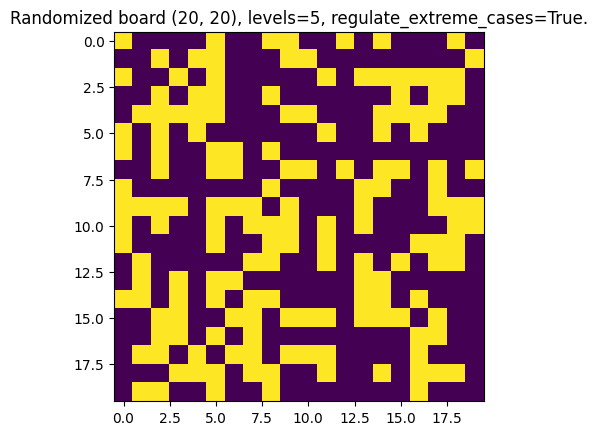

In [8]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

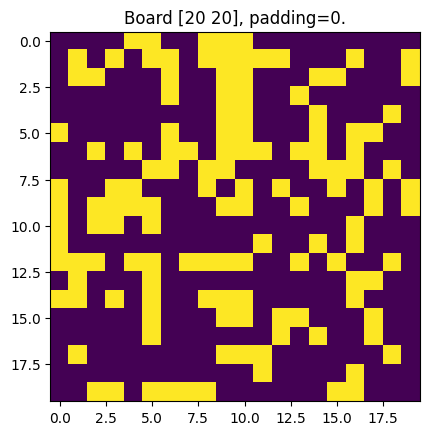

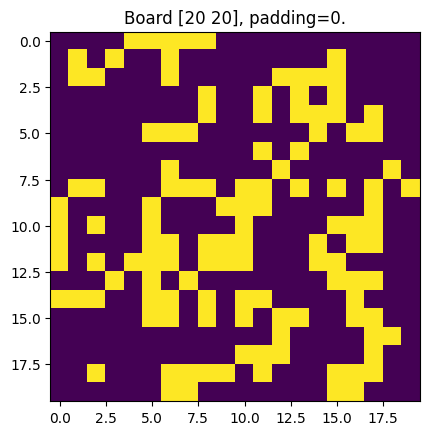

1/1 [==============================] - 0s 70ms/step


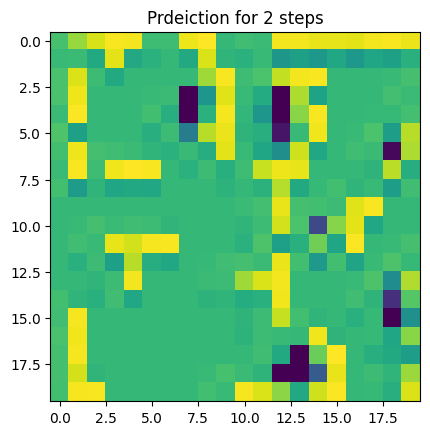

In [13]:
SEED = 0
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(models[SEED], N_STEPS).predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

In [14]:
for seed, model in models.items():
    filename = f'models/{N_STEPS}_steps_{board_name}_seed_{seed}.hdf5'
    model.save(filename)

c:\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## 2-Step Old Board Flip: tanh-ReLU Conv Minimal

In [174]:
def x4_mirror(df, show=False):
    x4 = np.array(df)
    x4 = np.concatenate(
            [
                x4,
                np.flip(x4, axis=0)
            ],
            axis=0
        )
    x4 = np.concatenate(
            [
                x4,
                np.flip(x4, axis=1)
            ],
            axis=1
        )
    if show:
        plt.imshow(x4)
        plt.title('X4 Mirror')
        plt.show()
    return pd.DataFrame(x4)

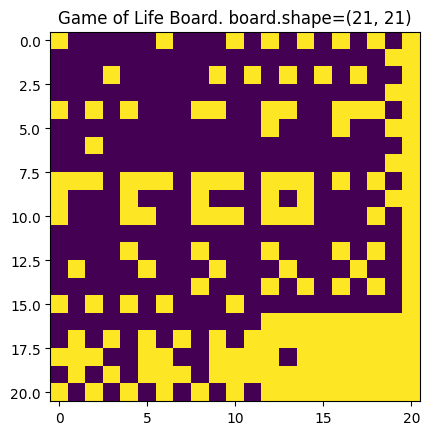

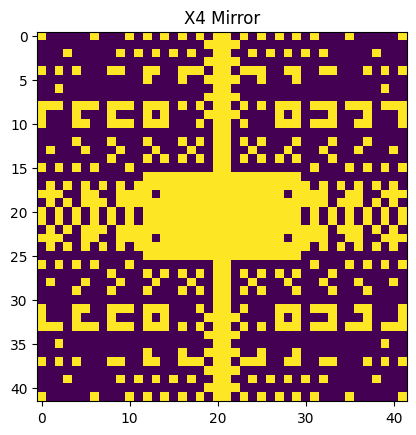

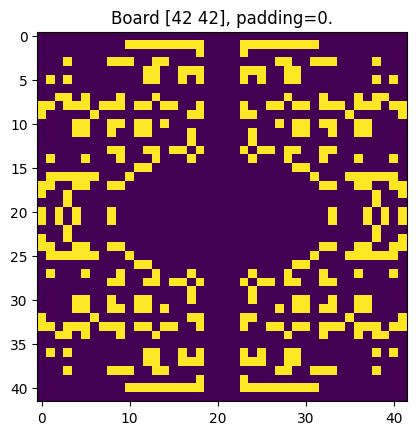

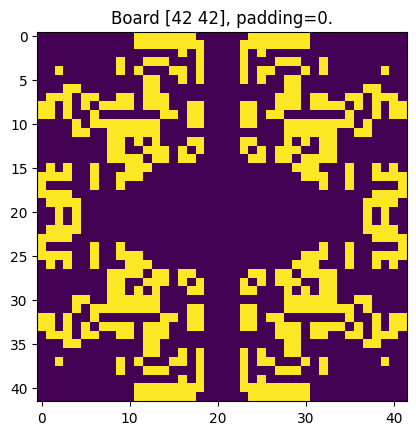

In [175]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_OLD'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

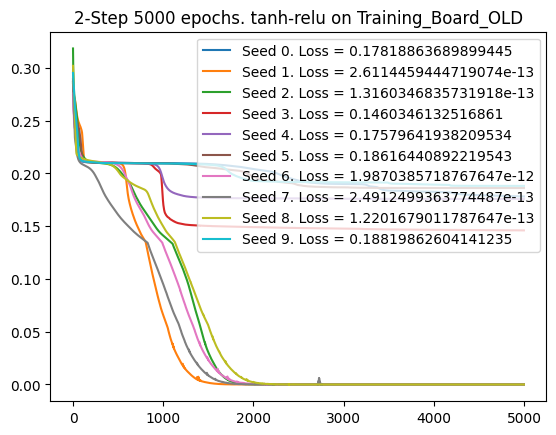

In [177]:
EPOCHS = 5000
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True)
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 54ms/step


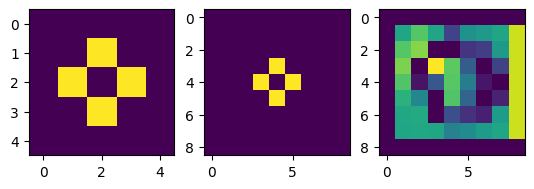

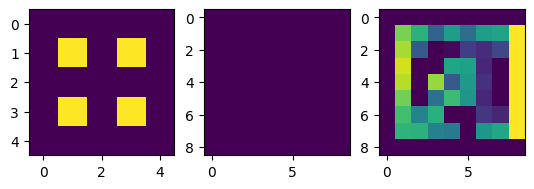

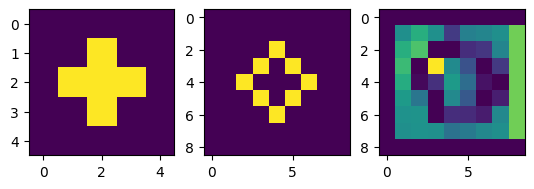

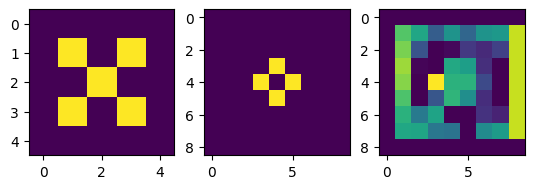

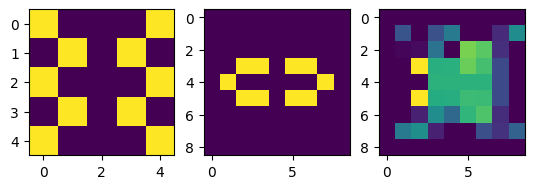

...

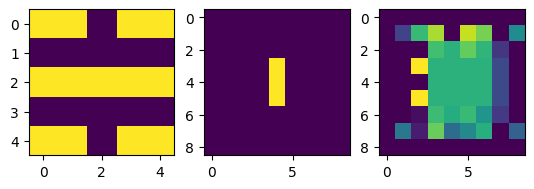

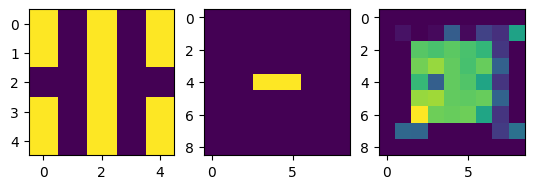

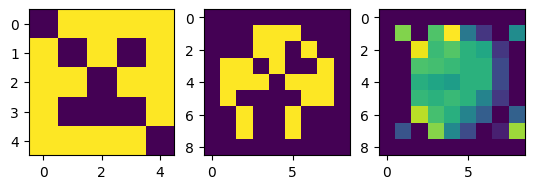

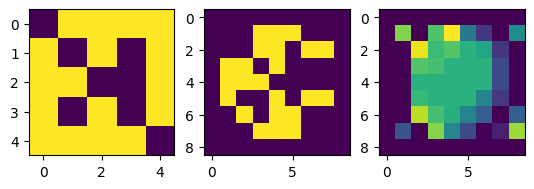

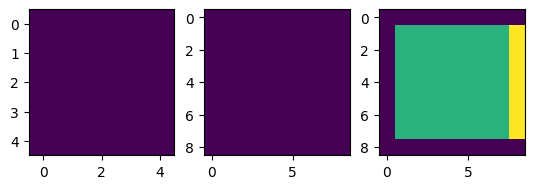

In [178]:
# @title Check certain model on patches
SEED = 0
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

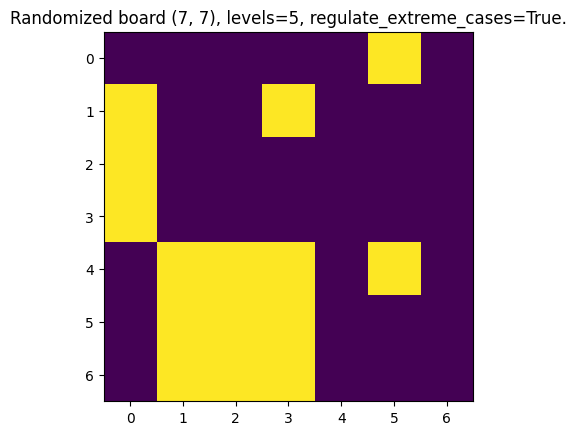

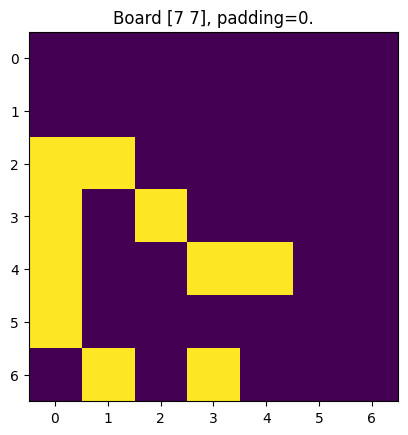

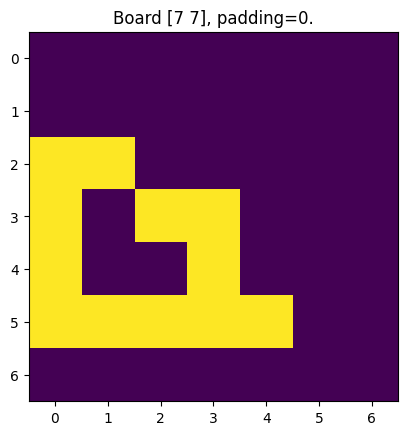

1/1 [==============================] - 0s 81ms/step


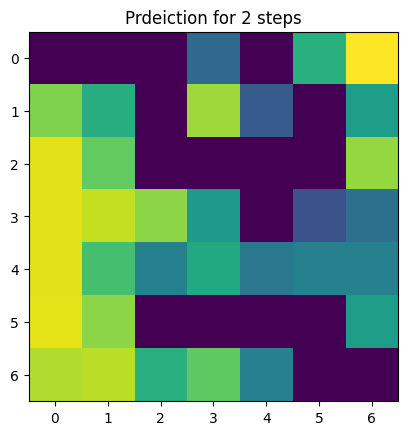

In [179]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

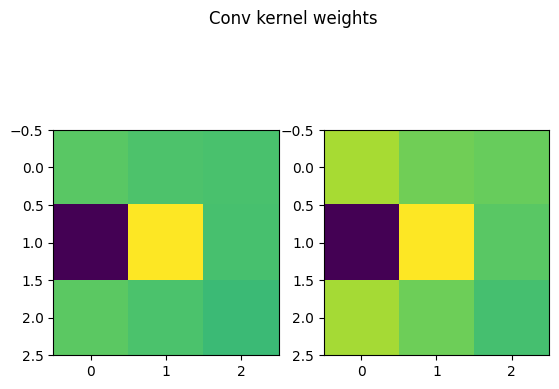

In [180]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

## 2-Step Board 10: tanh-ReLU Conv Minimal Zero Padding Layer

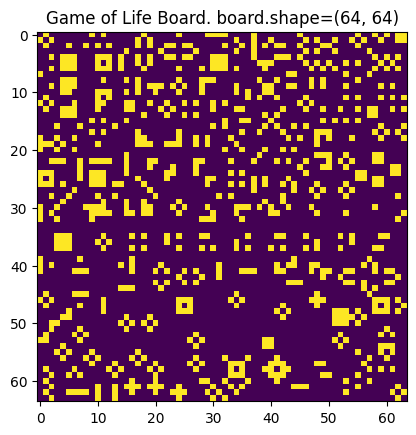

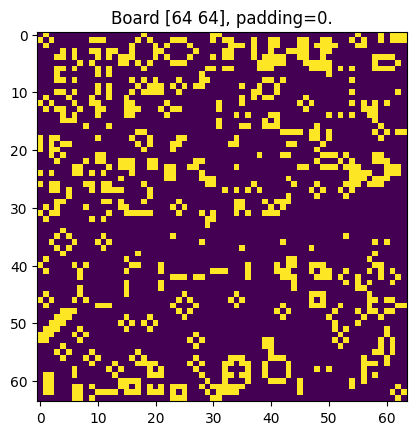

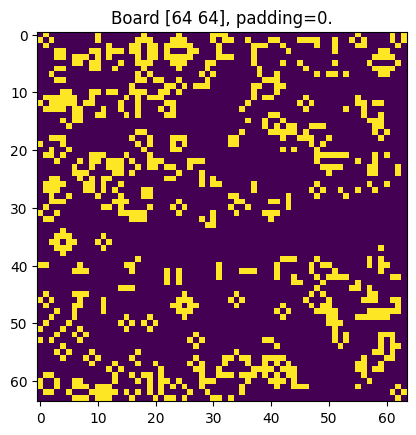

In [197]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_10'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

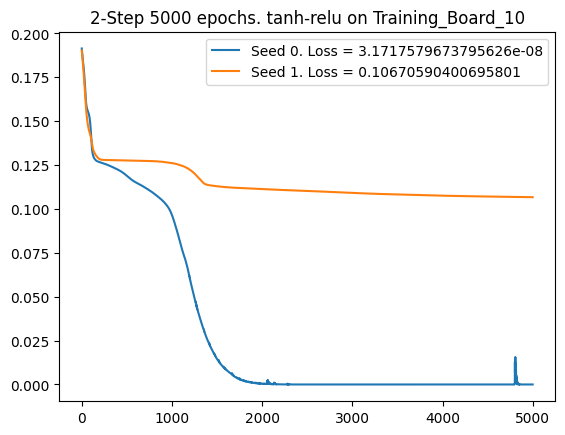

In [198]:
EPOCHS = 5000
for seed in [0, 1]:
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_core_model_zp(seed=seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True)
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

1/1 [==============================] - 0s 57ms/step


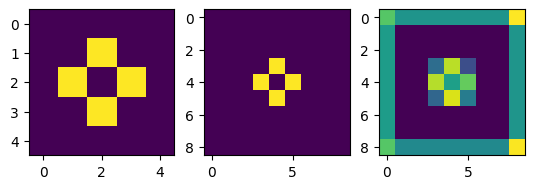

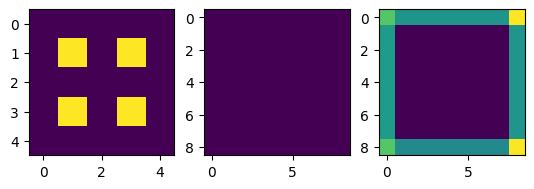

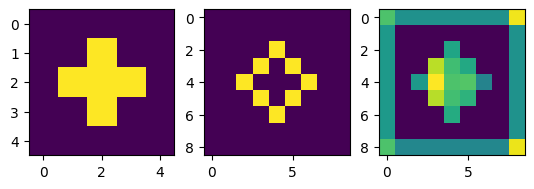

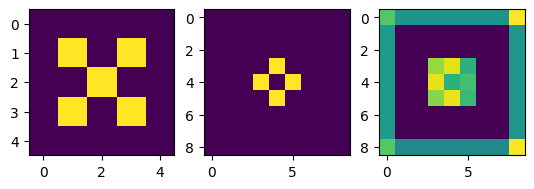

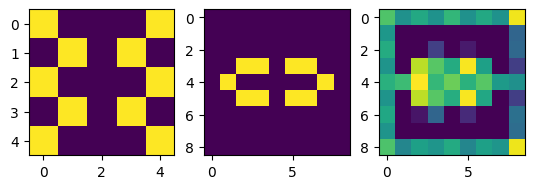

...

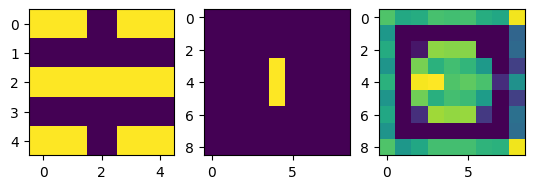

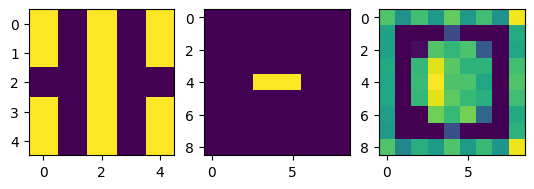

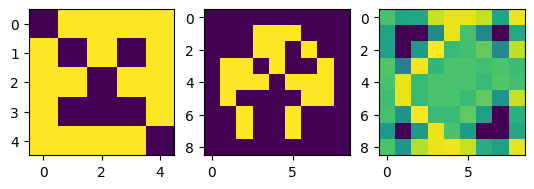

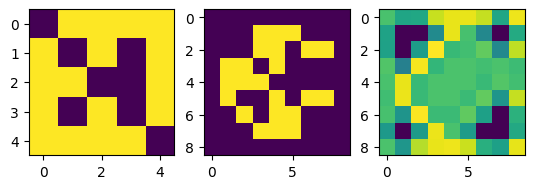

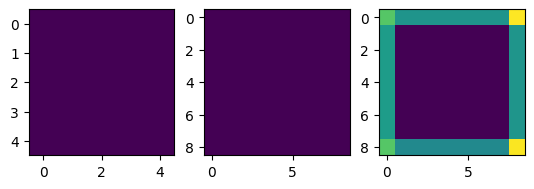

In [199]:
# @title Check certain model on patches
SEED = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

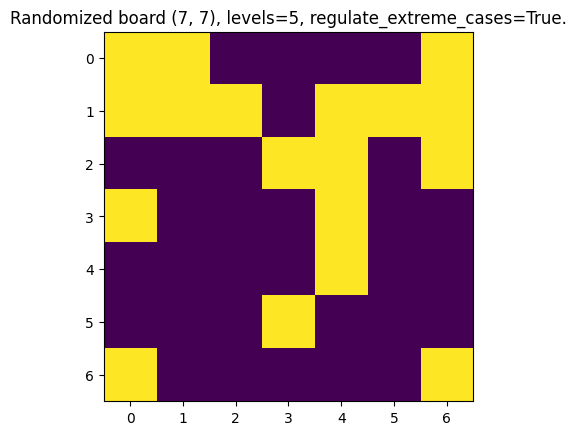

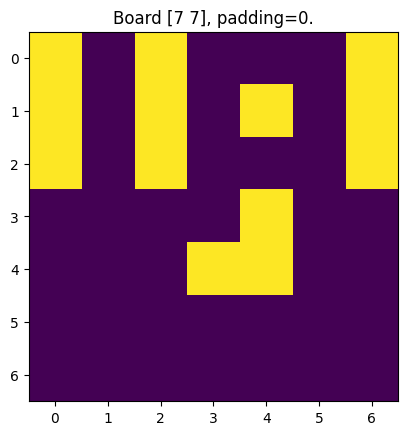

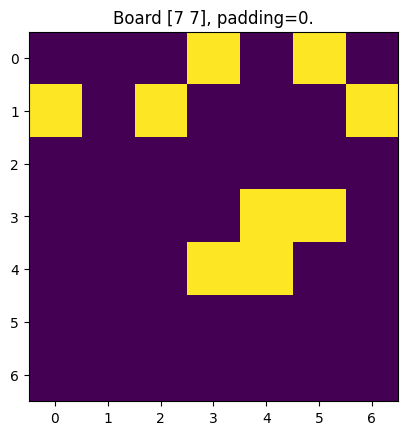

1/1 [==============================] - 0s 80ms/step


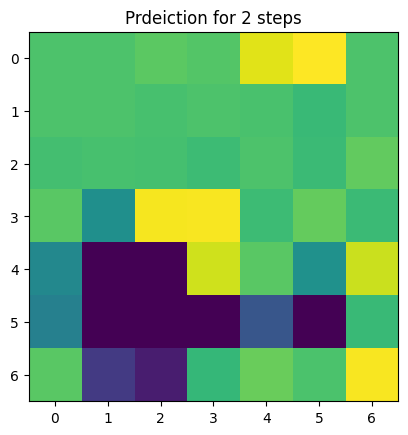

In [200]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

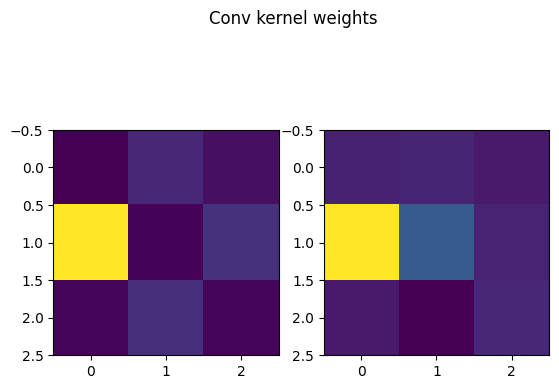

In [201]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

## 2-Step Board 11 X4 Mirror: tanh-ReLU Conv Minimal

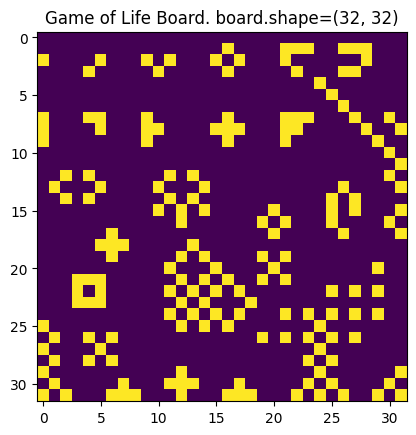

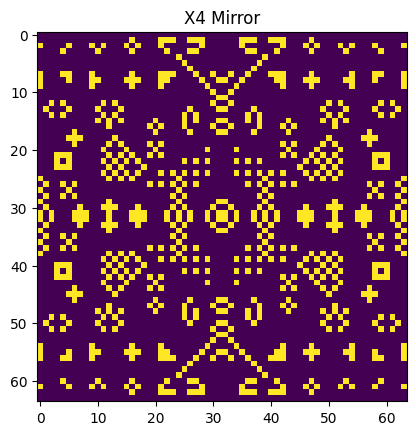

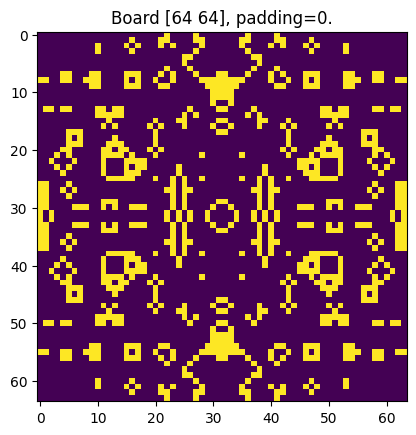

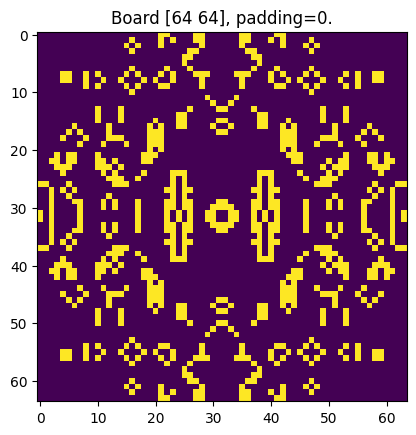

In [209]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_11'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

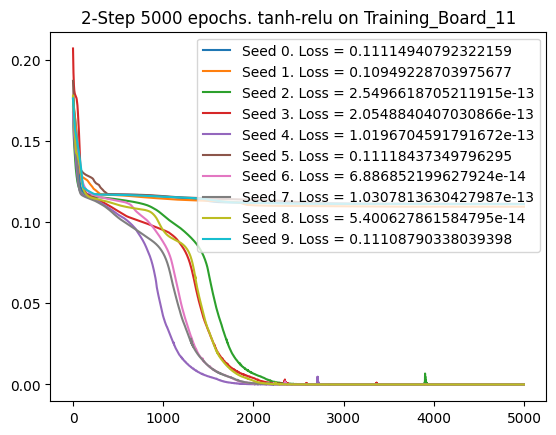

In [210]:
EPOCHS = 5000
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True)
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 62ms/step


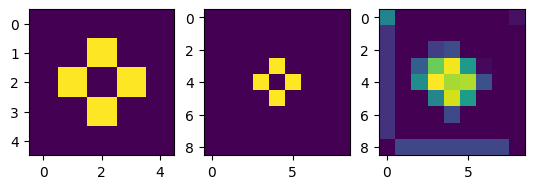

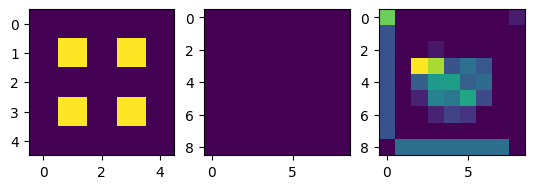

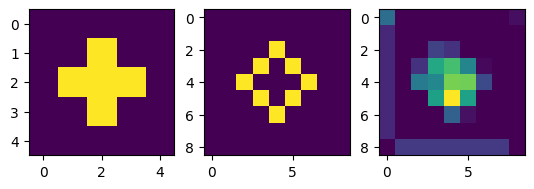

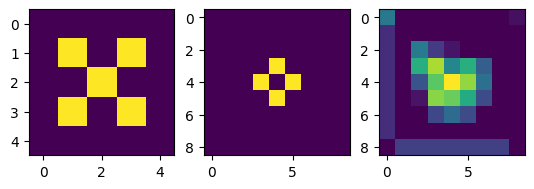

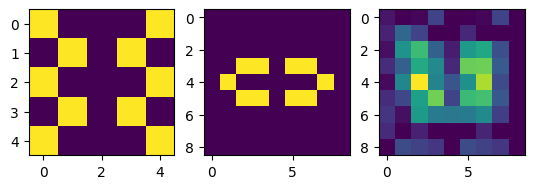

...

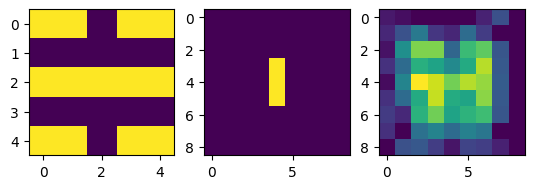

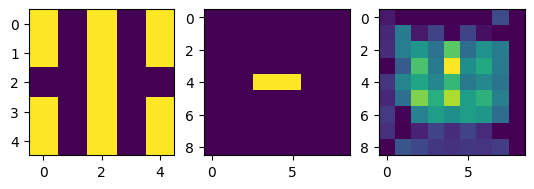

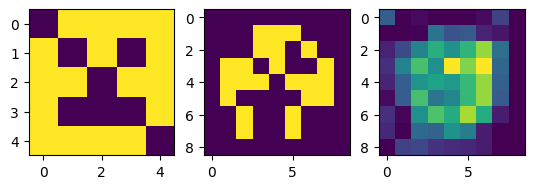

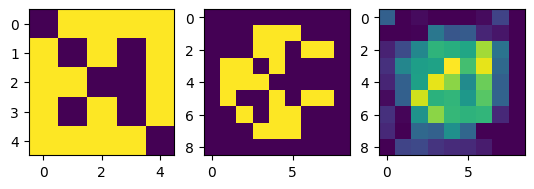

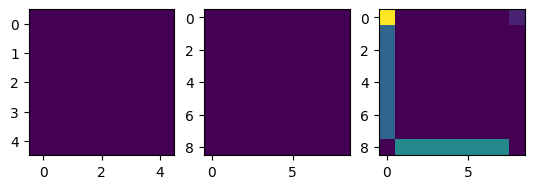

In [211]:
# @title Check certain model on patches
SEED = 0
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

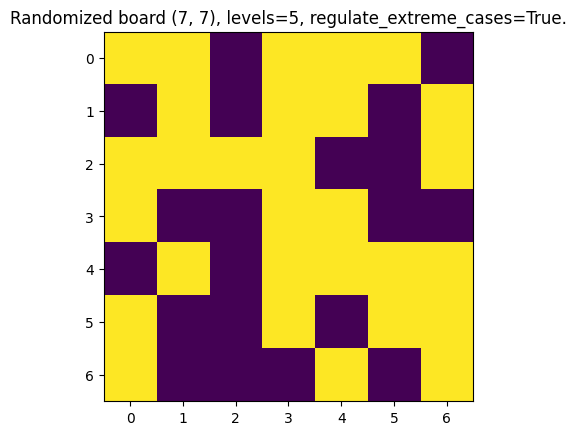

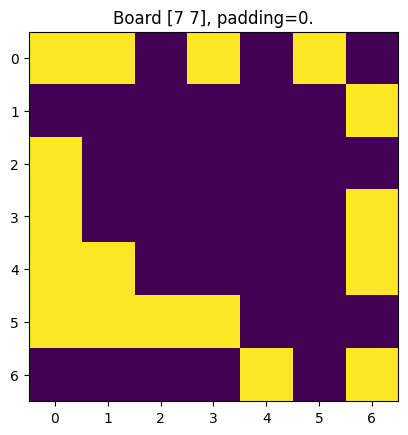

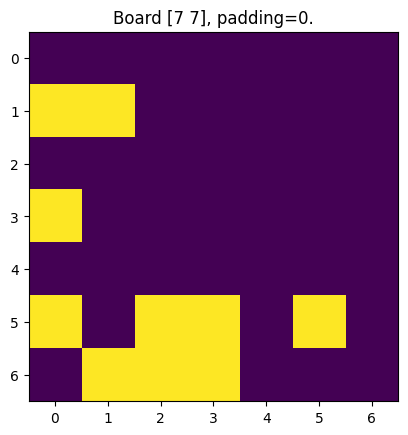

1/1 [==============================] - 0s 59ms/step


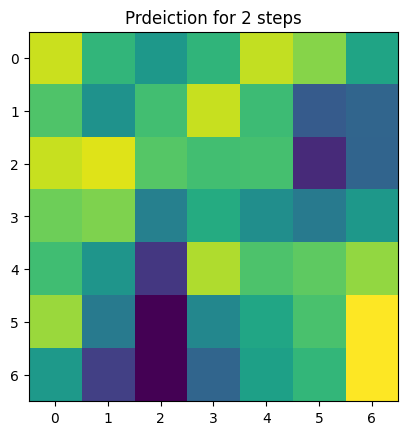

In [212]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

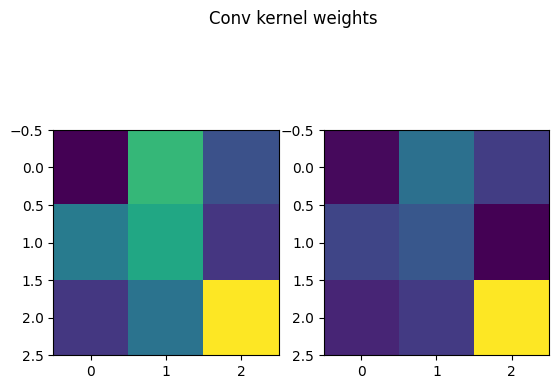

In [213]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

## 2-Step Board 12 X4 Mirror: tanh-ReLU Conv Minimal

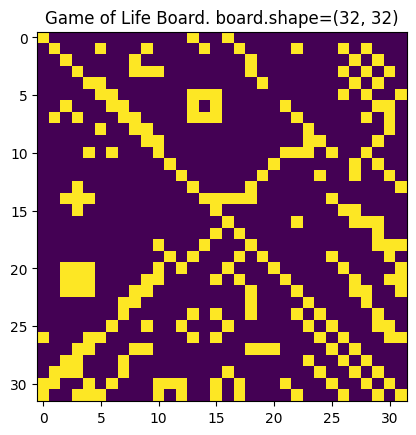

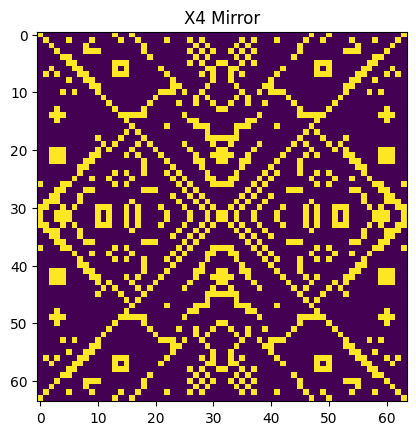

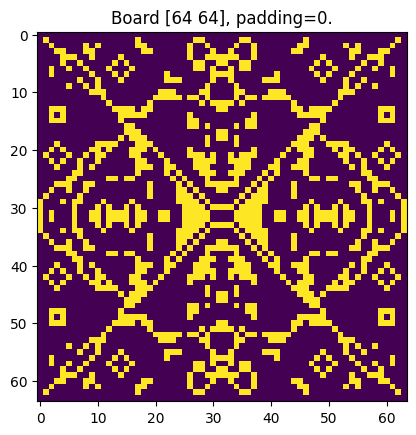

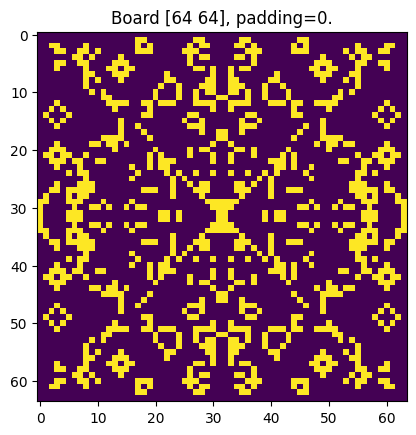

In [215]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_12'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

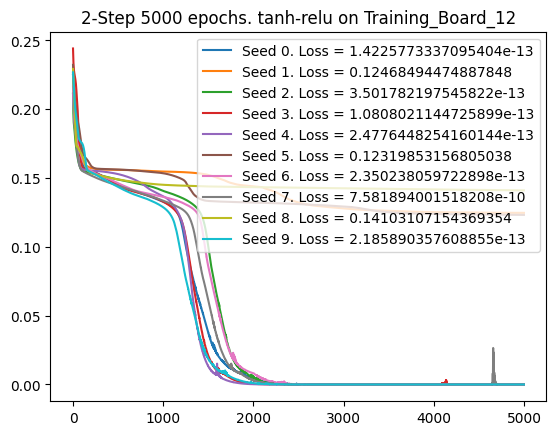

In [216]:
EPOCHS = 5000
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True)
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 60ms/step


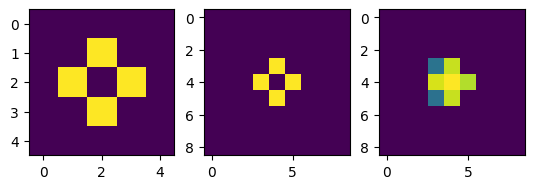

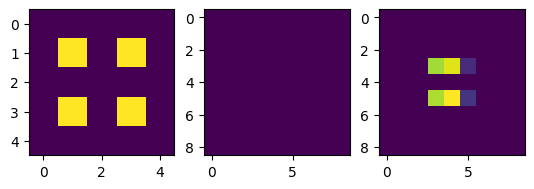

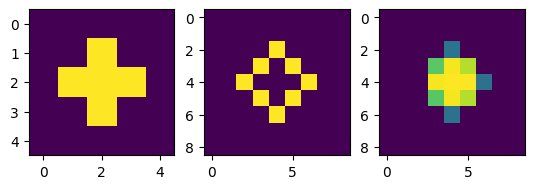

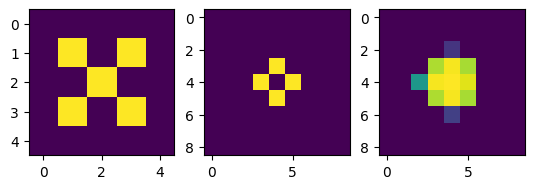

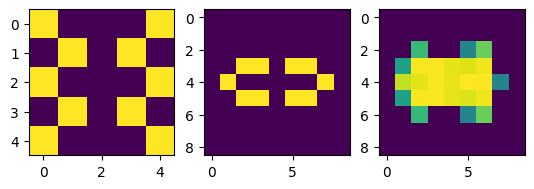

...

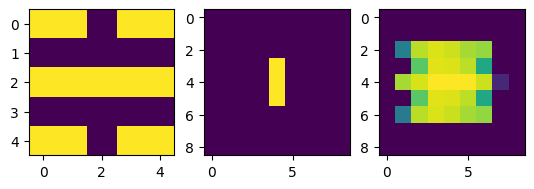

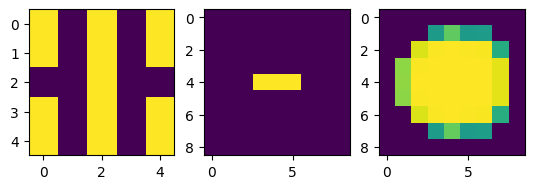

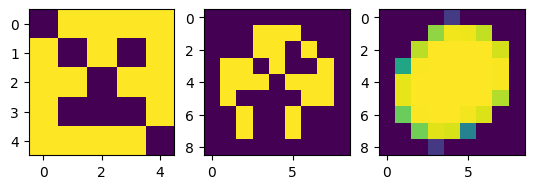

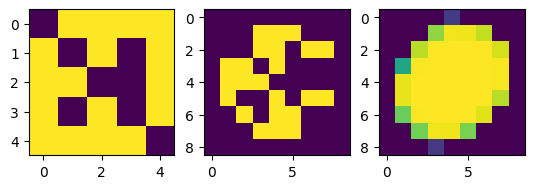

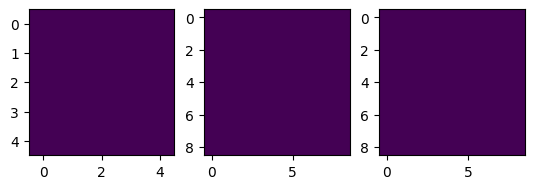

In [220]:
# @title Check certain model on patches
SEED = 8
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

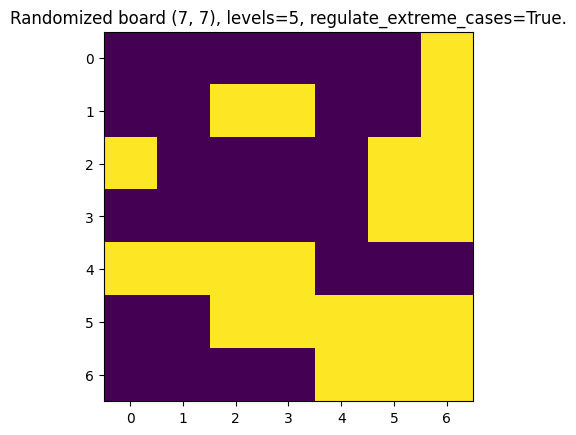

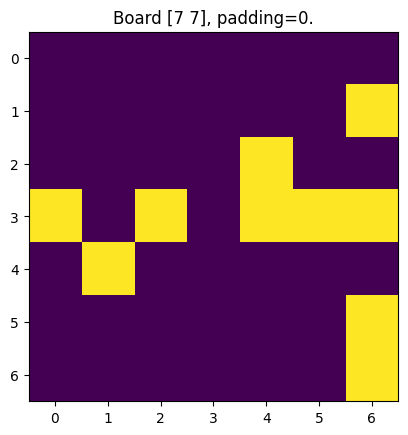

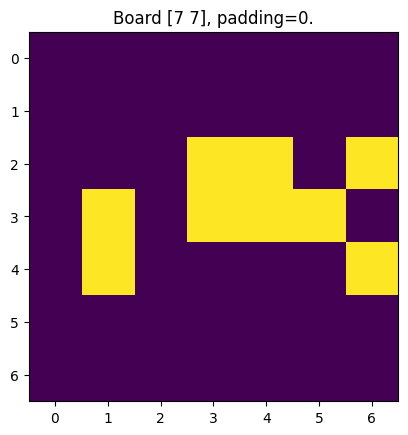

1/1 [==============================] - 0s 50ms/step


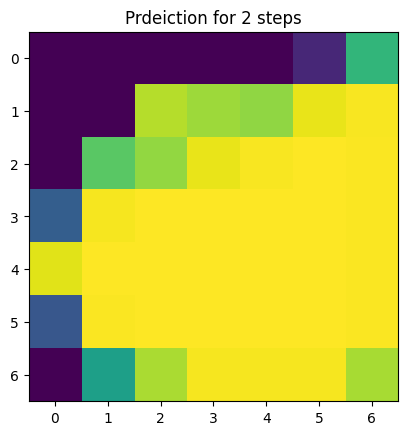

In [221]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

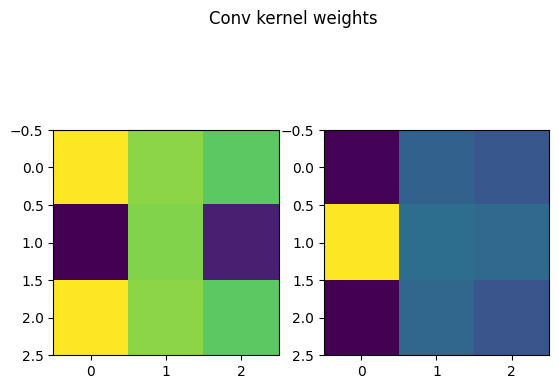

In [222]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

## 2-Step Board 13 X4 Mirror: tanh-ReLU Conv Minimal

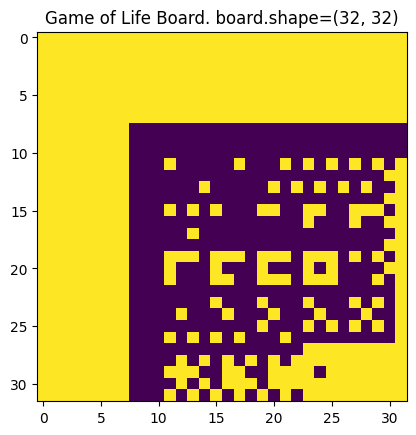

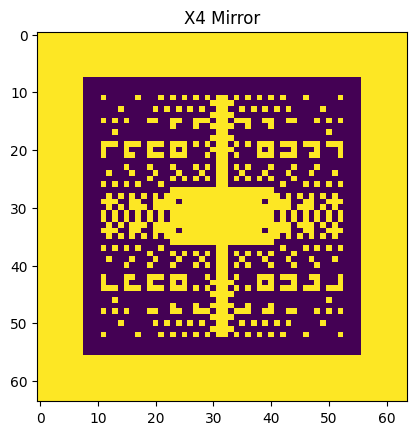

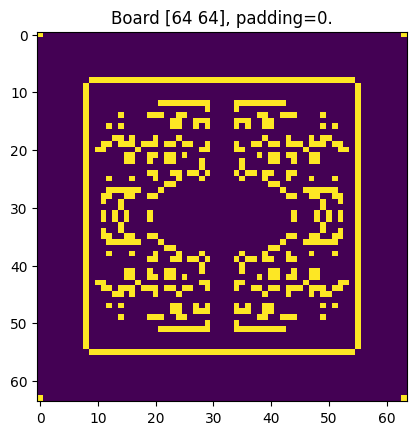

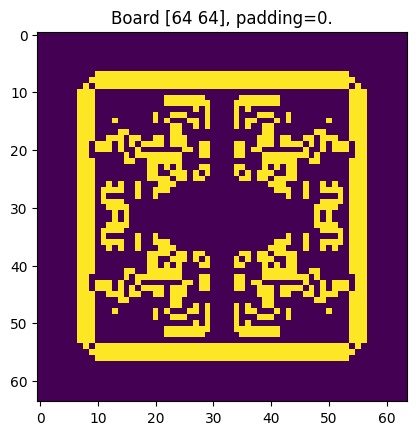

In [39]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_13'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

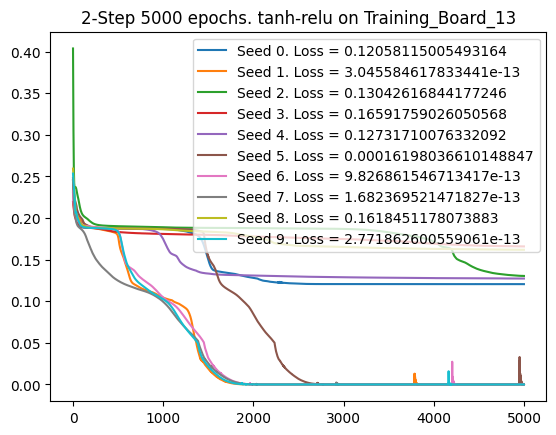

In [42]:
EPOCHS = 5000
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True)
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 59ms/step


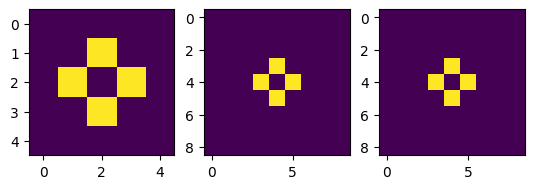

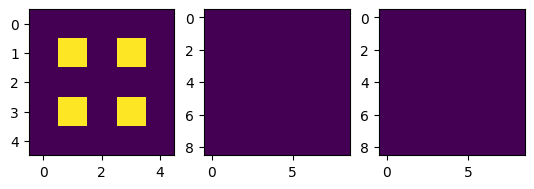

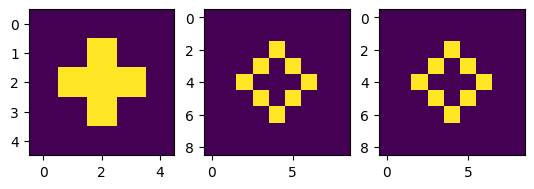

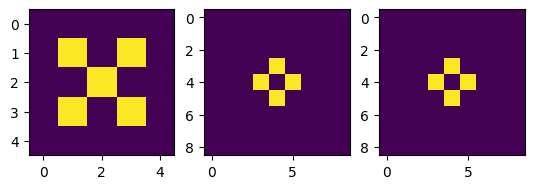

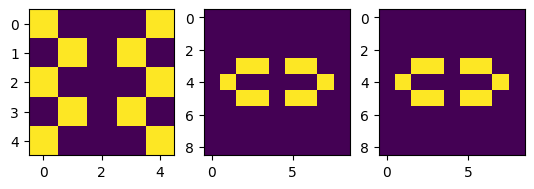

...

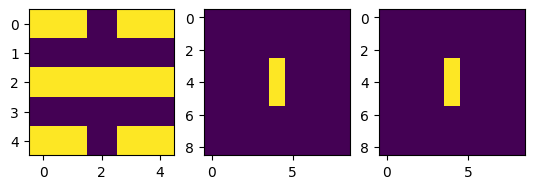

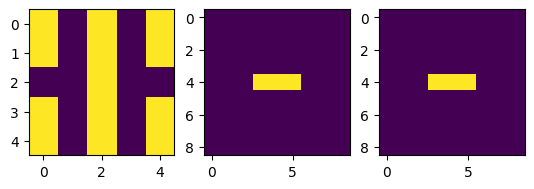

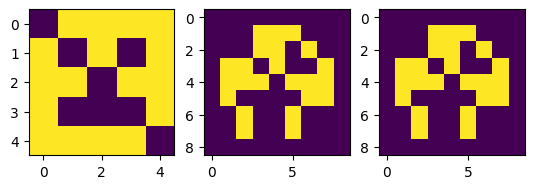

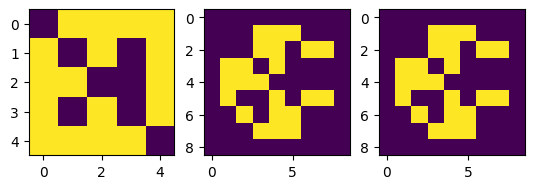

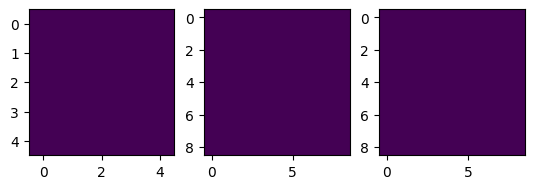

In [41]:
# @title Check certain model on patches
SEED = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

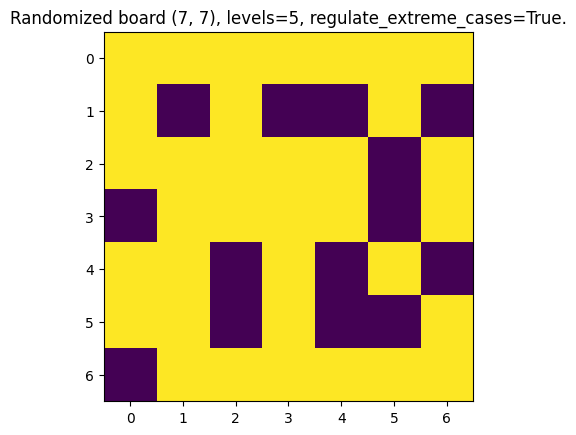

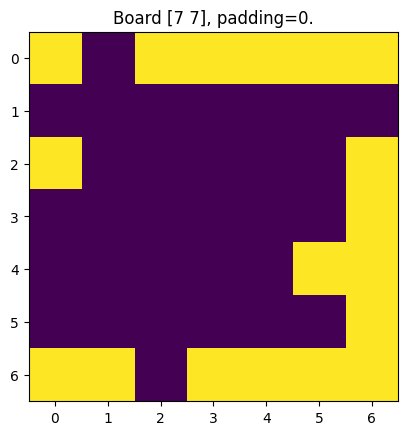

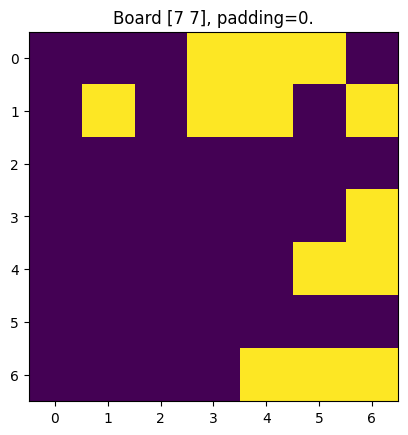

1/1 [==============================] - 0s 57ms/step


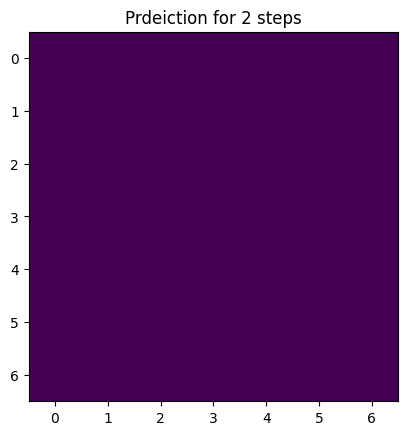

In [37]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

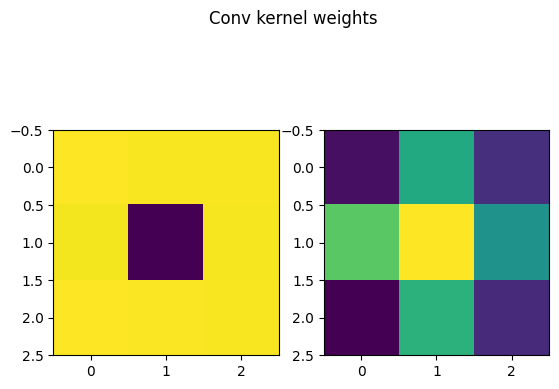

In [38]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

## 2-Step Board 14: tanh-ReLU Conv Minimal

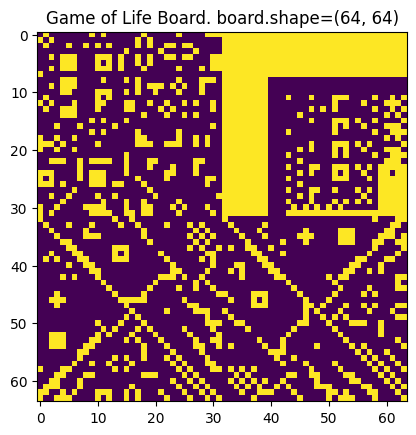

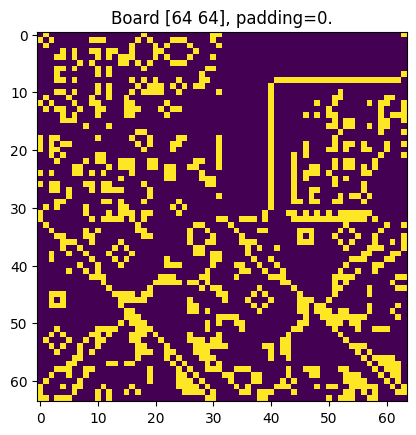

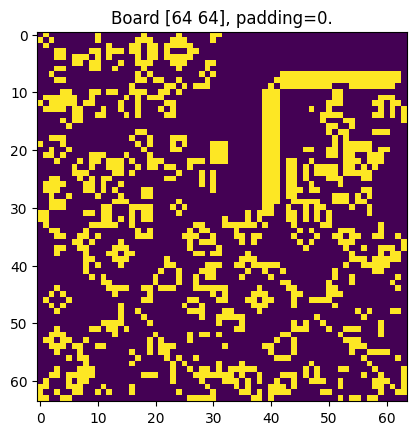

In [70]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_14'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
# X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02072: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01603: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02055: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01476: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02168: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02119: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01981: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02147: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01922: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03347: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03043: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01795: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01757: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01560: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01201: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02968: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 04234: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01971: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01894: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02224: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01943: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 04904: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01842: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01840: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01944: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02020: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01701: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01427: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02190: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02517: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02268: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01245: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02075: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01808: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 04785: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02758: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01530: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02315: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 04386: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03883: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01965: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02510: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02123: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01408: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01517: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03924: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03951: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03658: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01429: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02753: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01521: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01199: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01528: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01997: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01754: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01825: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01994: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01705: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03310: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01483: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01442: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03945: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 04108: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02117: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01921: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02158: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02382: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01661: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01772: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02350: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01788: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 04107: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01198: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01818: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03863: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01275: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01934: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02896: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02025: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01339: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01637: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02937: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01595: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01781: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01674: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02778: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01910: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02249: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03015: early stopping THR


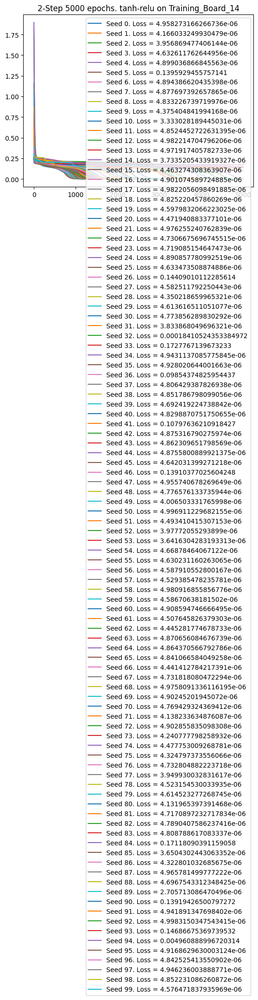

In [72]:
EPOCHS = 5000
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=1)
for seed in range(100):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 56ms/step


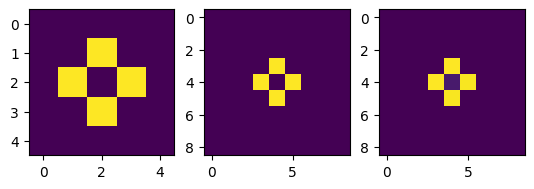

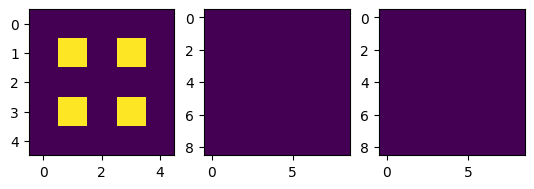

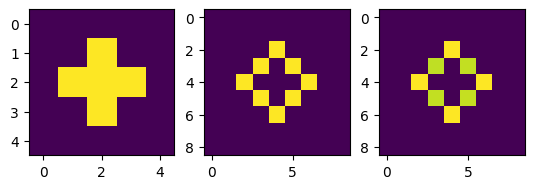

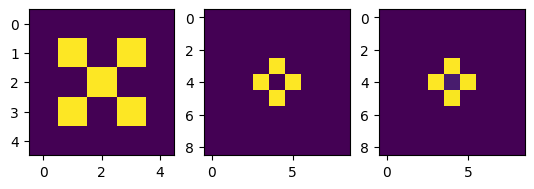

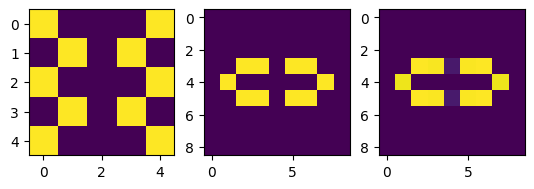

...

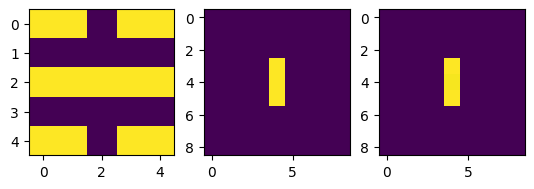

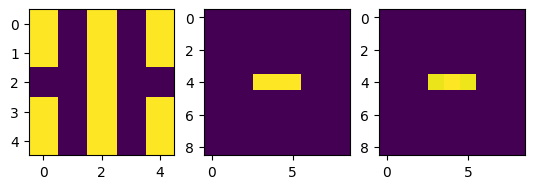

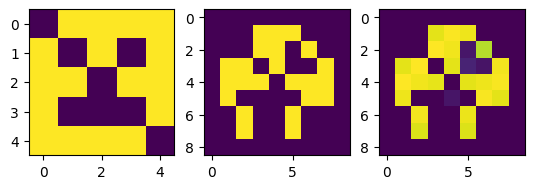

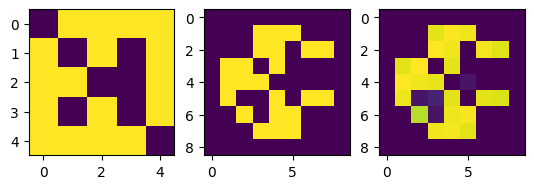

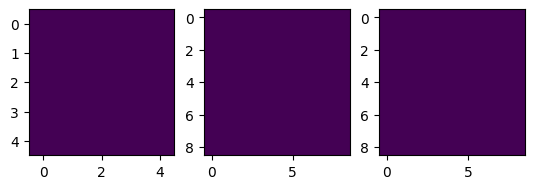

In [50]:
# @title Check certain model on patches
SEED = 7
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

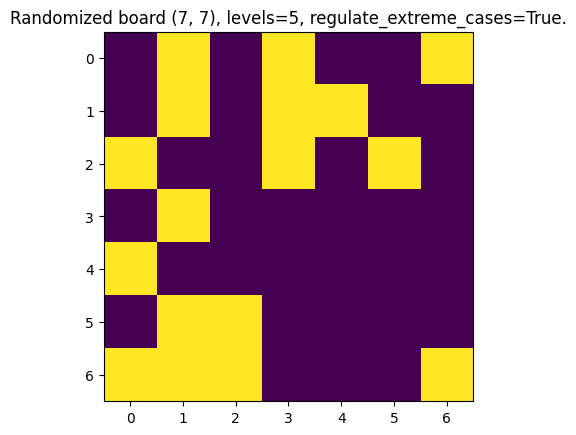

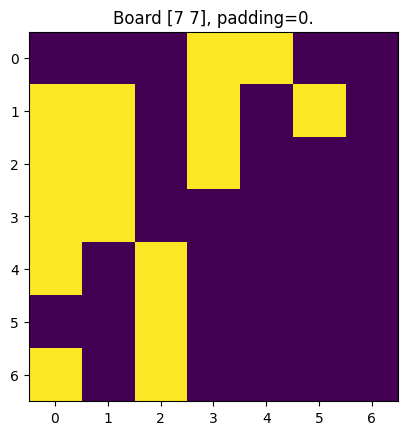

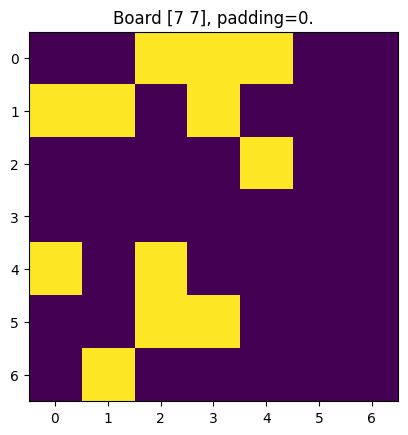

1/1 [==============================] - 0s 61ms/step


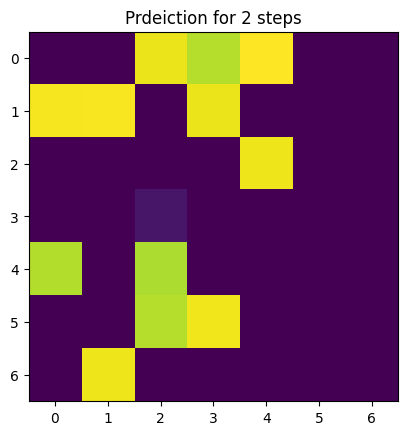

In [51]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

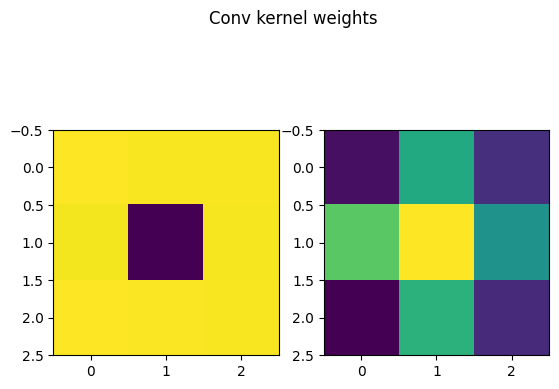

In [ ]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

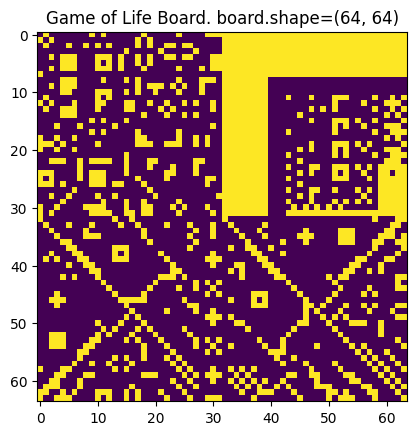

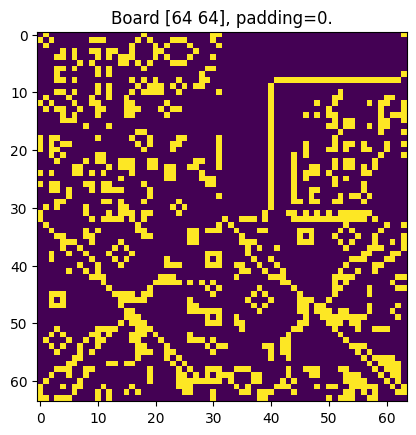

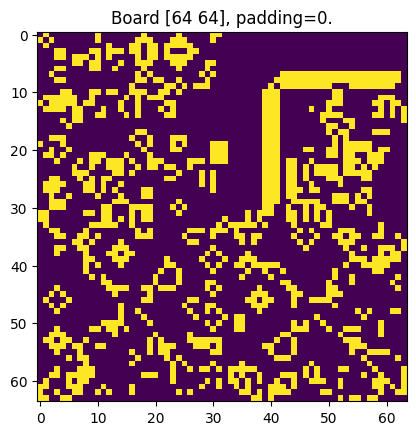

In [72]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_15'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
# X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

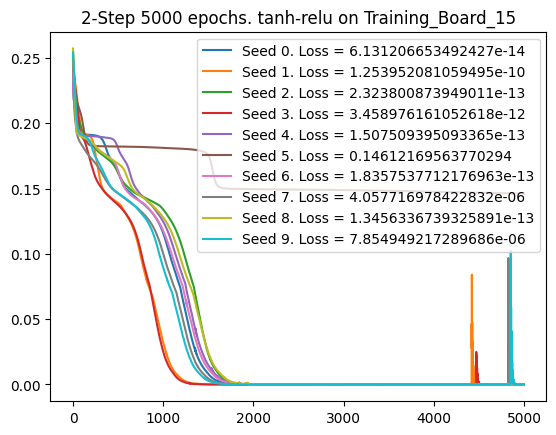

In [74]:
EPOCHS = 5000
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True)
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 68ms/step


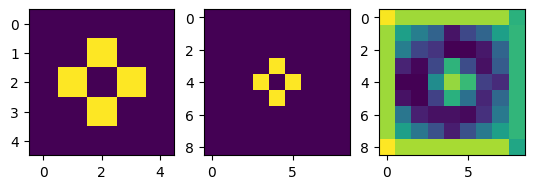

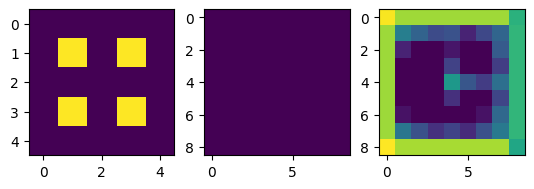

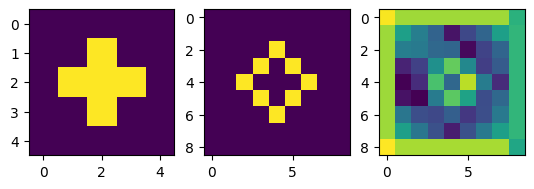

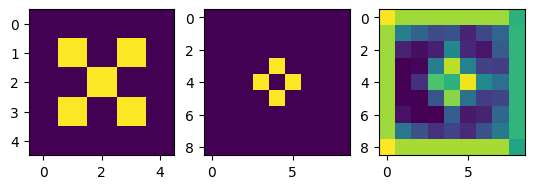

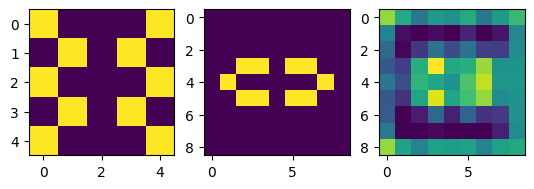

...

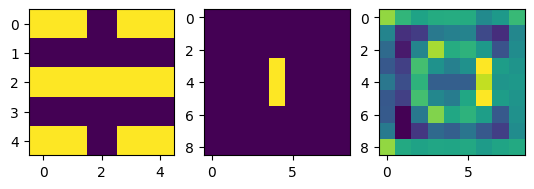

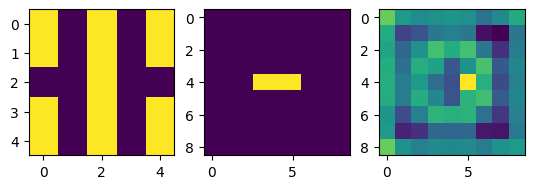

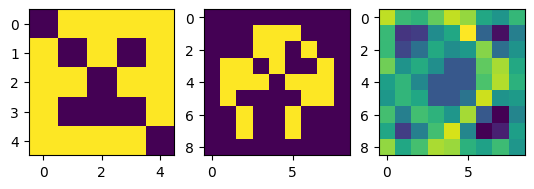

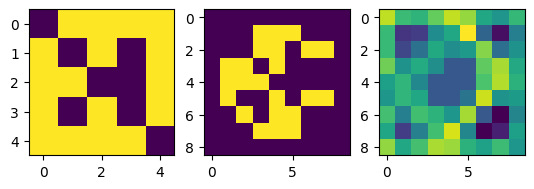

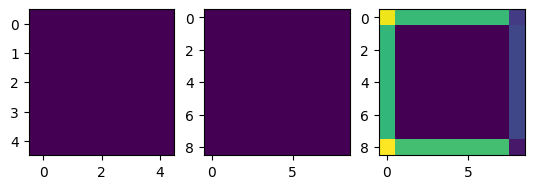

In [58]:
# @title Check certain model on patches
SEED = 5
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

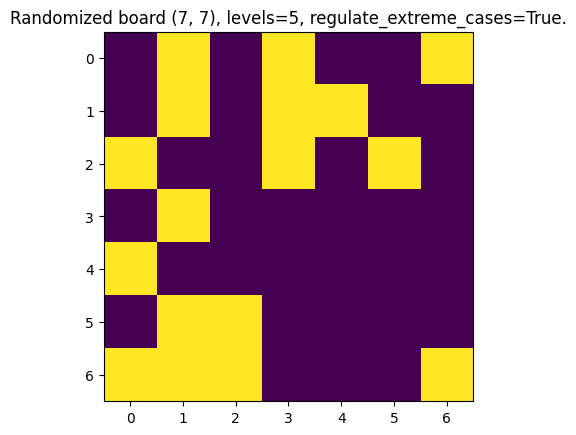

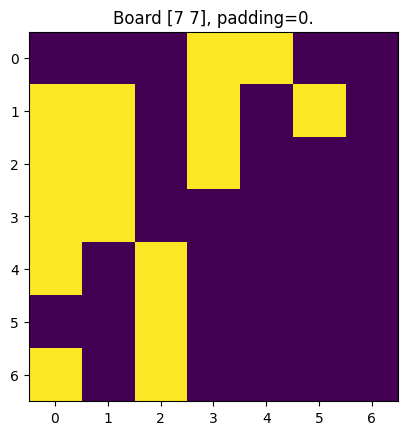

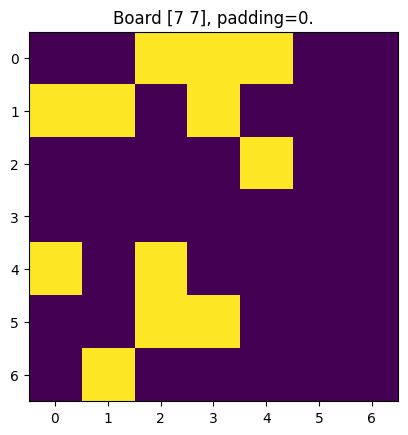

1/1 [==============================] - 0s 61ms/step


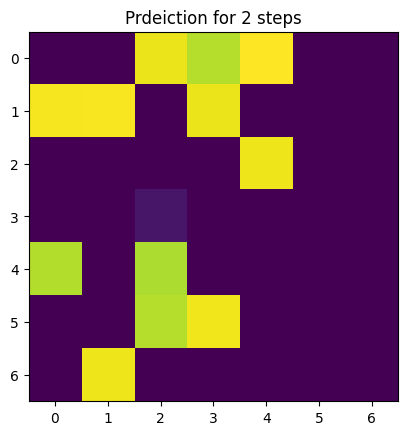

In [ ]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

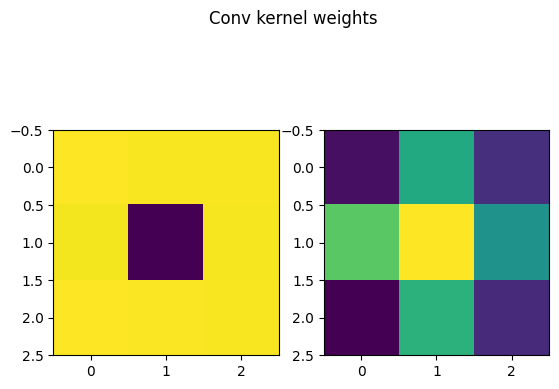

In [ ]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

## 2-Step Board 13a X4: tanh-ReLU Conv Minimal

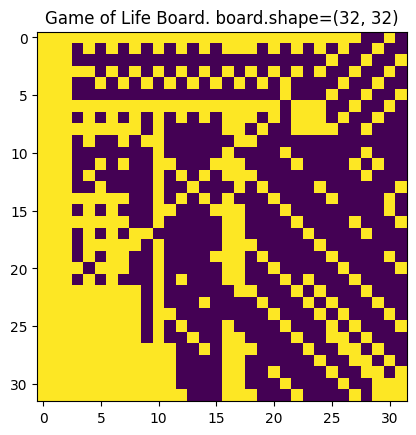

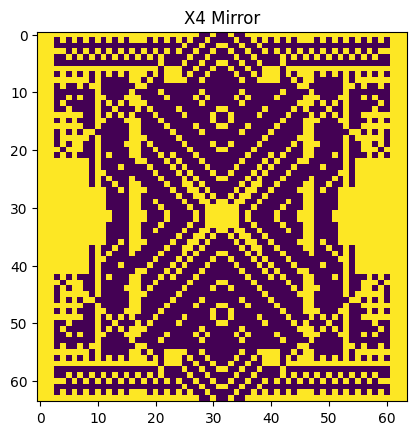

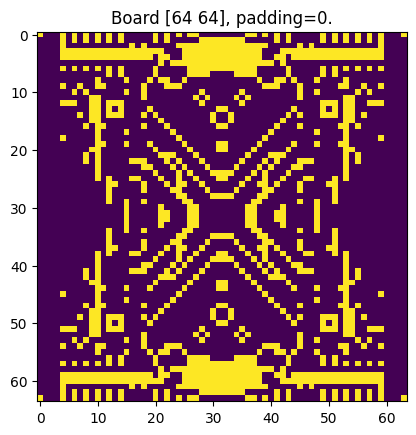

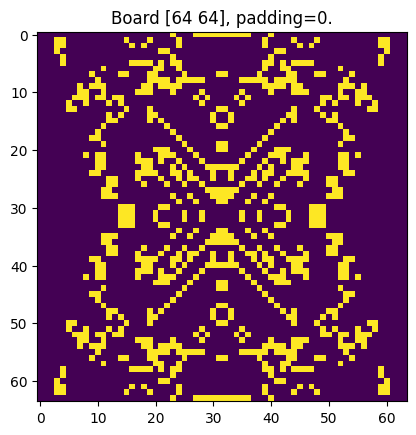

In [16]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_13a'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

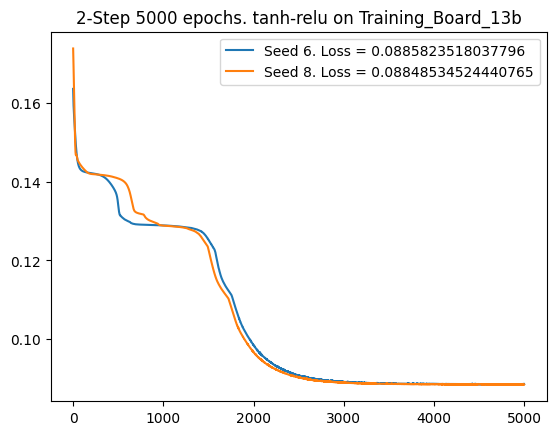

In [6]:
EPOCHS = 5000
for seed in [6, 8]:
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True)
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

In [ ]:
# @title Check certain model on patches
SEED = 6
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

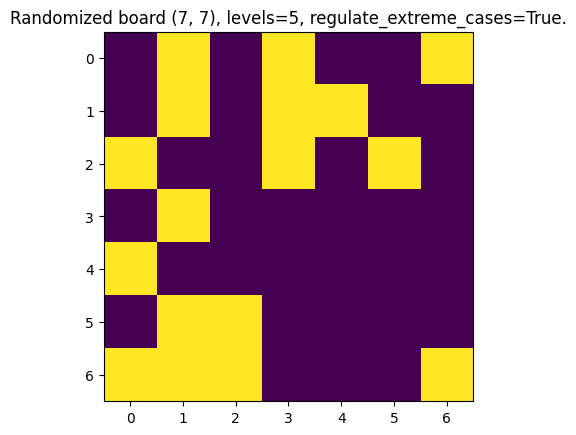

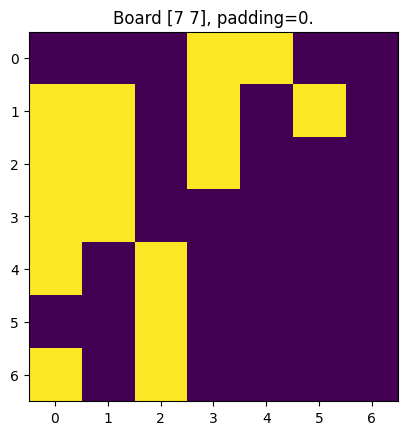

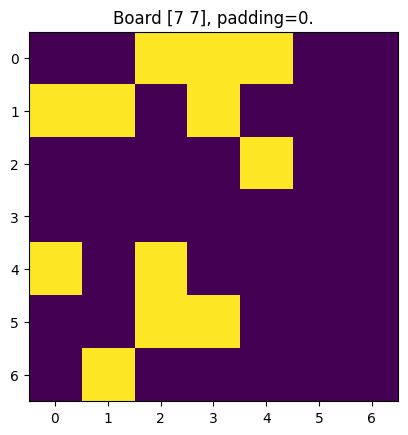

1/1 [==============================] - 0s 61ms/step


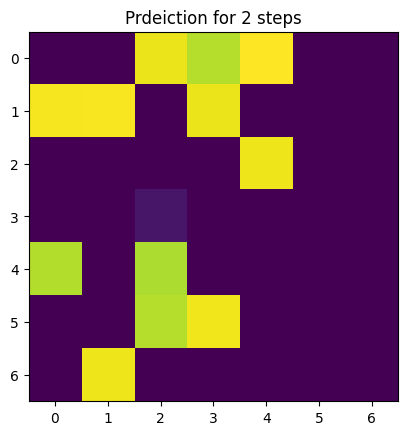

In [ ]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

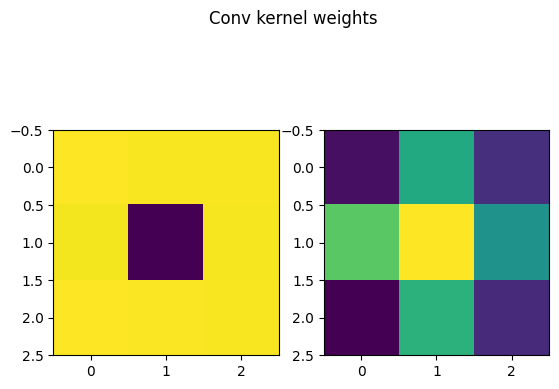

In [ ]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

## 2-Step Board 13b X4: tanh-ReLU Conv Minimal

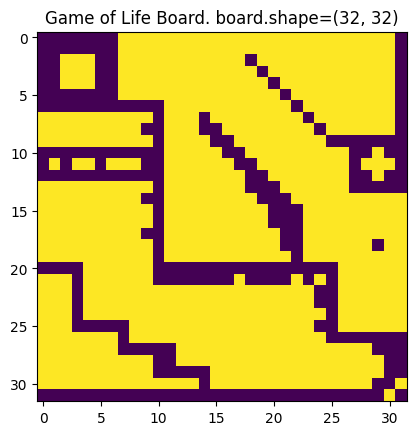

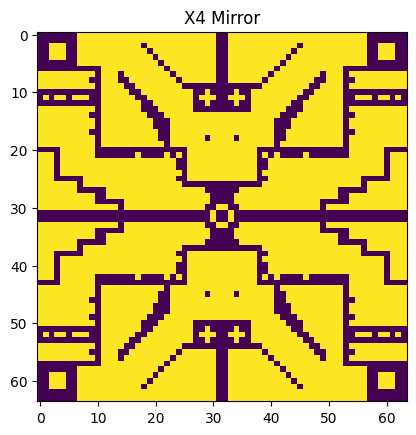

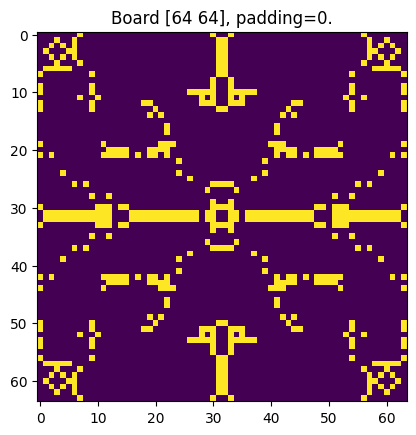

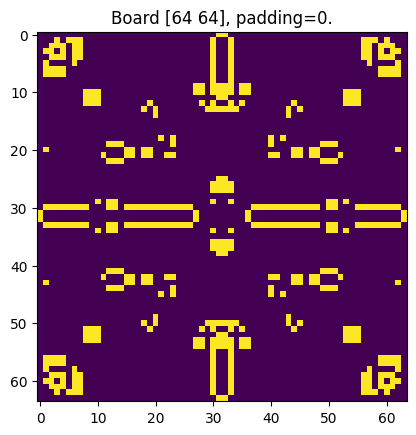

In [58]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_13b'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01971: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01613: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 06178: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02429: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03135: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01787: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 02397: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01938: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03420: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 04975: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 03556: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 05260: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 06815: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 01719: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 07277: early stopping THR


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

KeyboardInterrupt: 

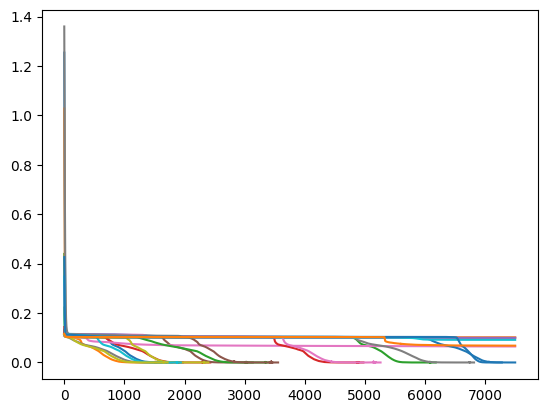

In [69]:
EPOCHS = 7500
early_stop = EarlyStoppingByLoss(value=10**-7, monitor='loss', verbose=1)
for seed in range(100):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        early_stop,
        TqdmCallback(verbose=True)
        ]
  )

  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

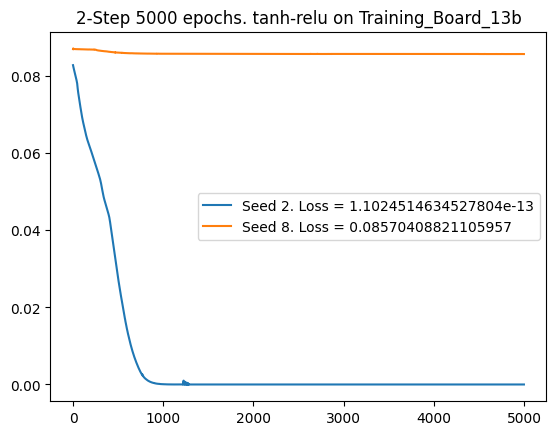

In [53]:
# @title continue training
1/0
EPOCHS = 5000
for seed in [2, 8]:
  tf.random.set_seed(seed)
  model = results[N_STEPS][BOARD_NAME][seed]['model']
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True)
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

1/1 [==============================] - 0s 76ms/step


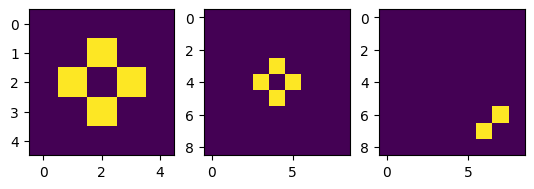

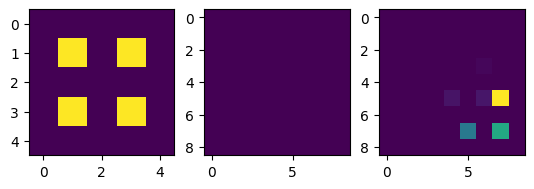

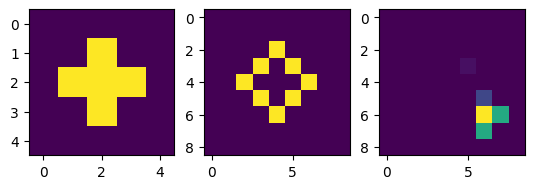

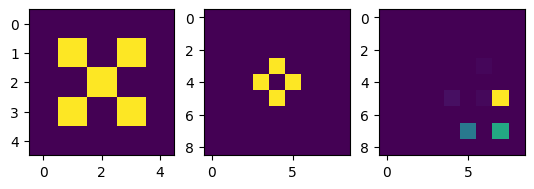

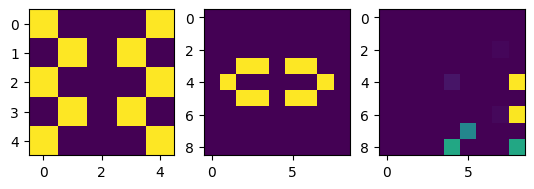

...

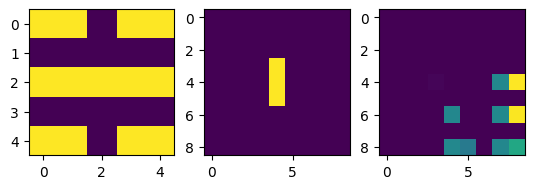

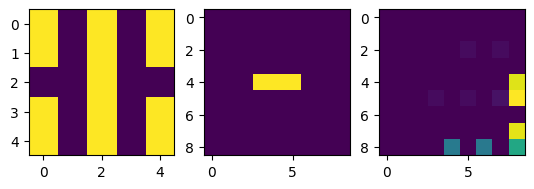

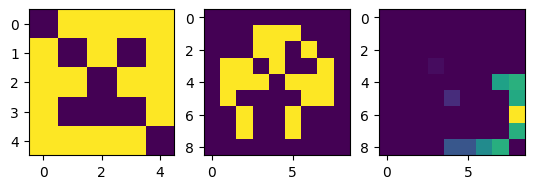

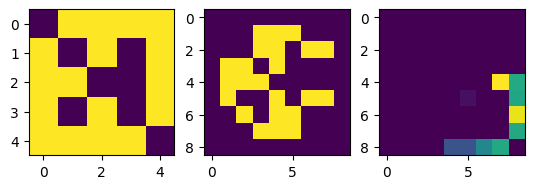

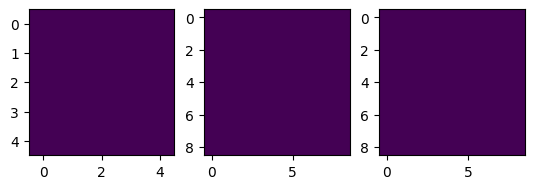

In [48]:
# @title Check certain model on patches
SEED = 5
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

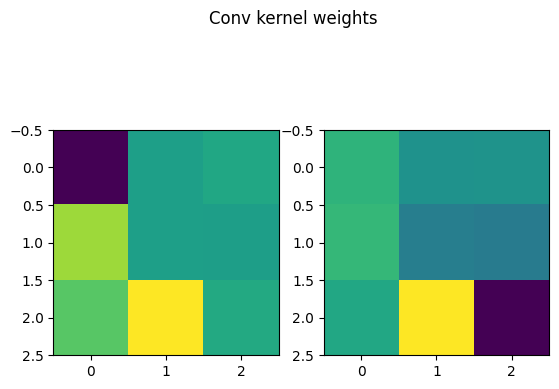

In [50]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

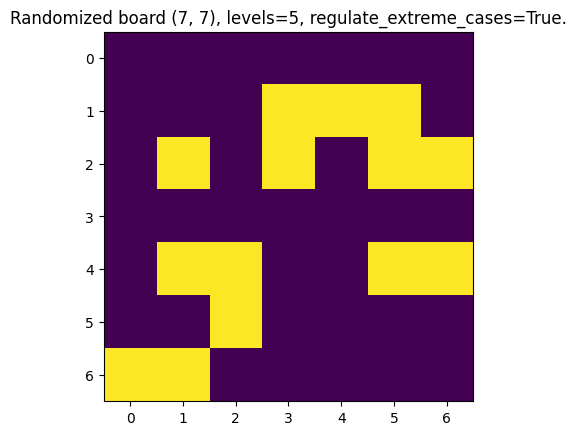

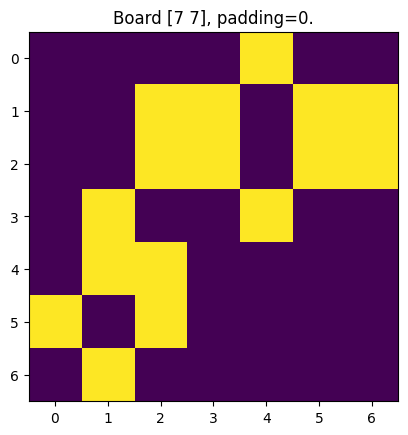

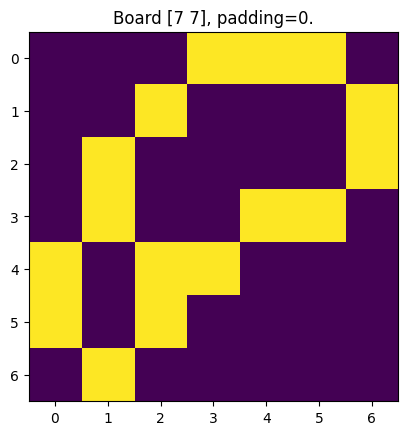

1/1 [==============================] - 0s 58ms/step


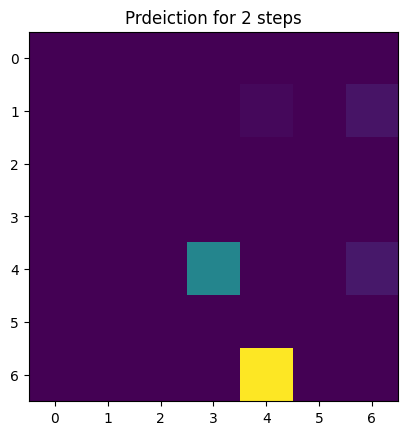

In [49]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

## 2-Step Board 13c X4: tanh-ReLU Conv Minimal

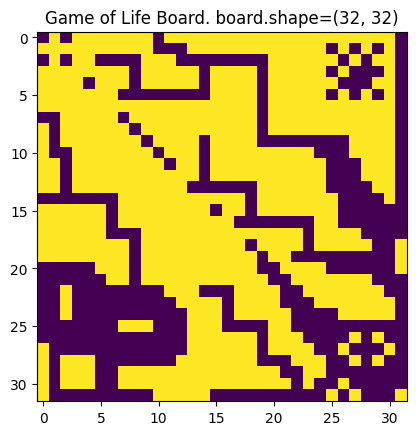

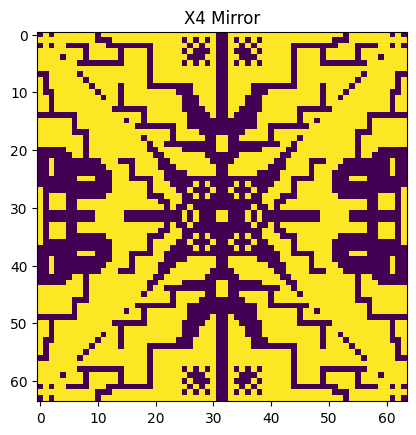

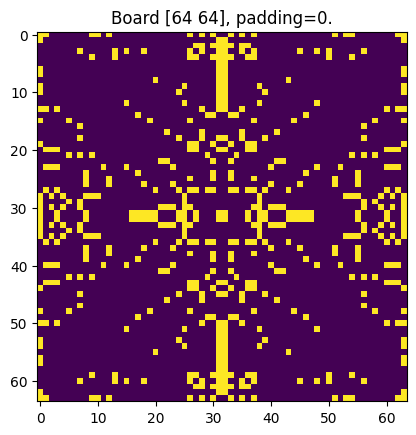

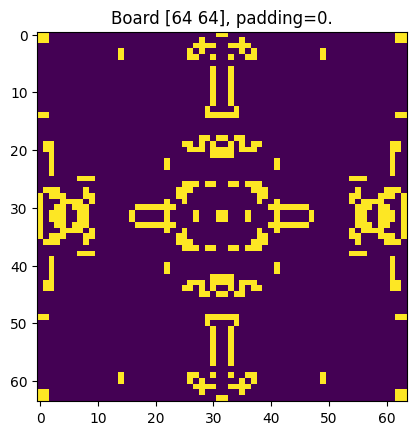

In [27]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_13c'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

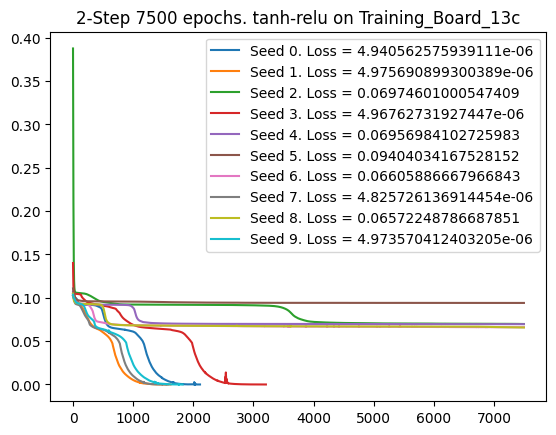

In [28]:
EPOCHS = 7500
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

KeyboardInterrupt: 

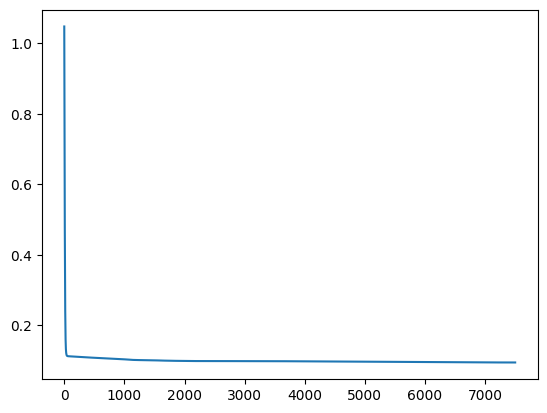

In [26]:
EPOCHS = 7500
case_summary = {}
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(10, 111):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  if loss[-1] <= 10**-5:
    case_summary[seed] = True
  else:
    case_summary[seed] = False
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

performance = 100 * sum(case_summary.values()) / len(case_summary)
plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}. {performance:.1f}% success')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 54ms/step


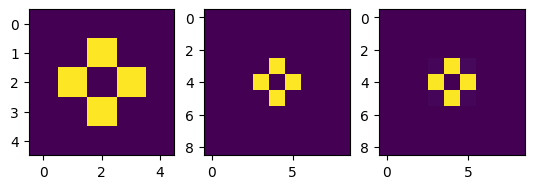

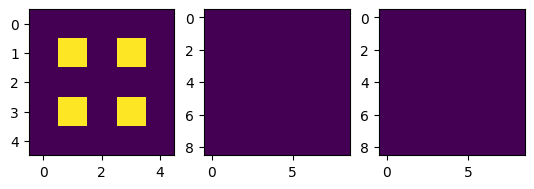

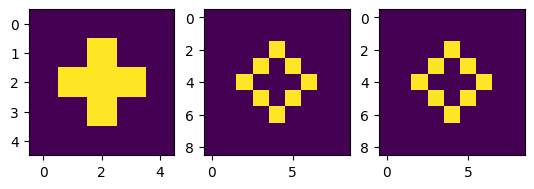

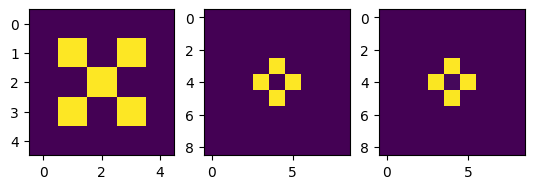

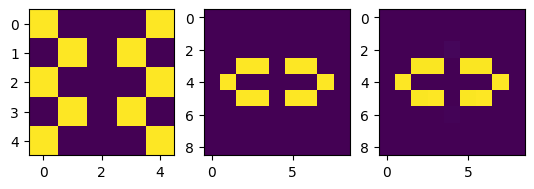

...

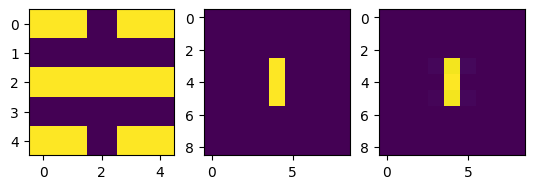

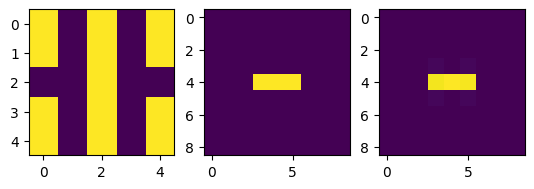

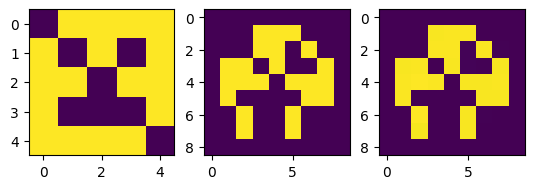

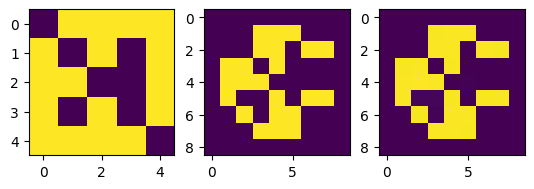

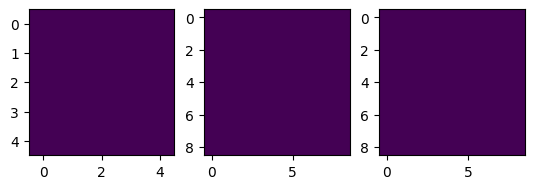

In [17]:
# @title Check certain model on patches
SEED = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

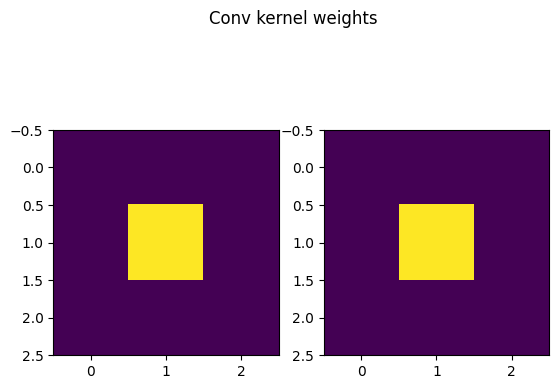

In [18]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

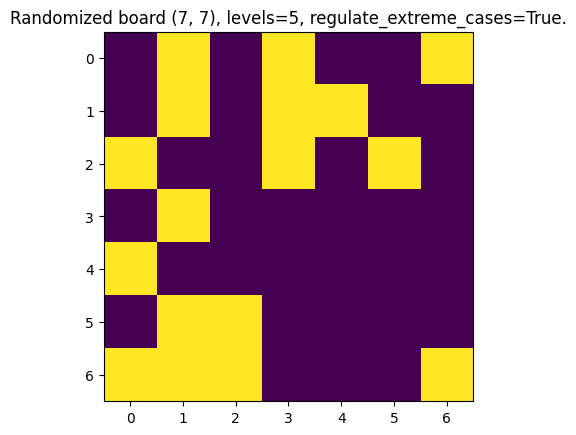

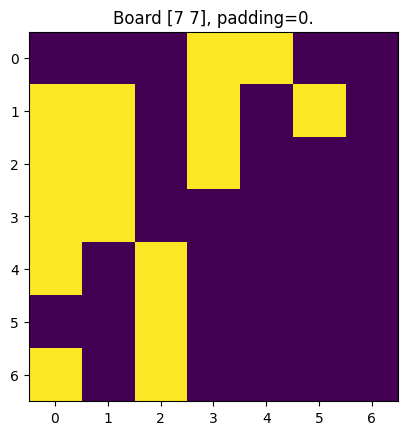

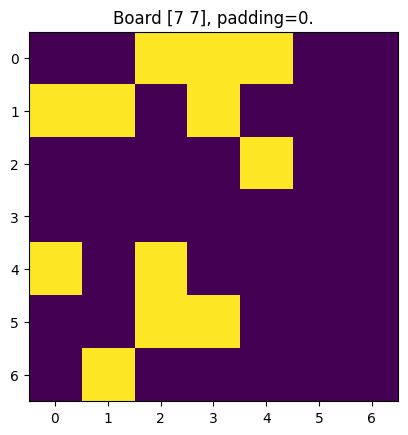

1/1 [==============================] - 0s 61ms/step


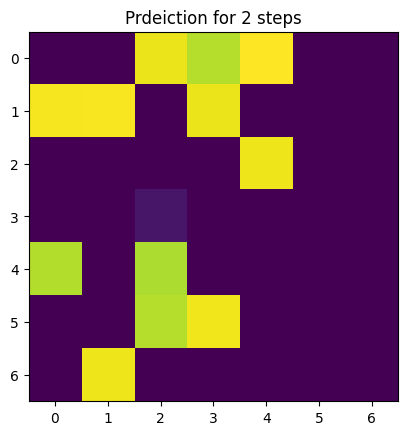

In [ ]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

## 2-Step Board 13c: tanh-ReLU Conv Minimal

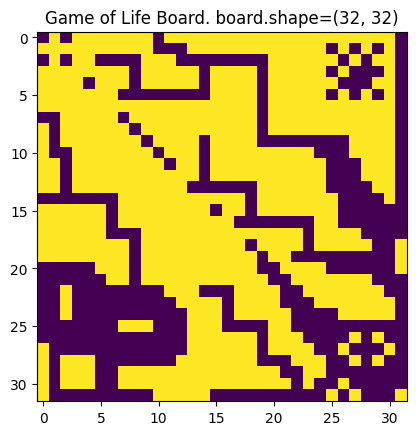

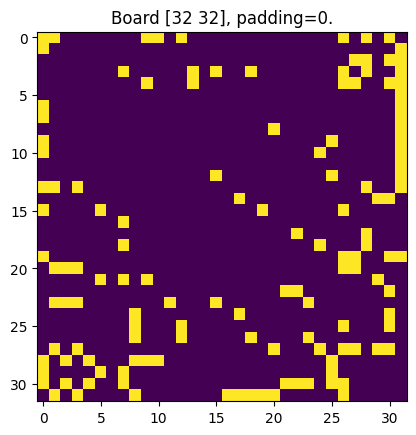

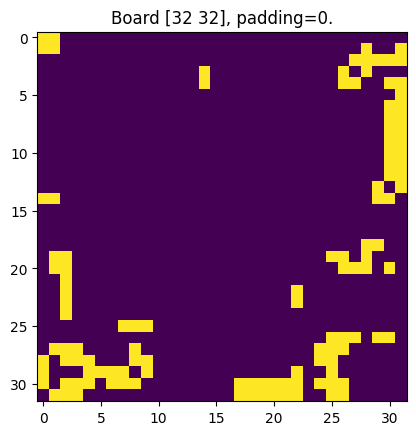

In [30]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_13c'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
# X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

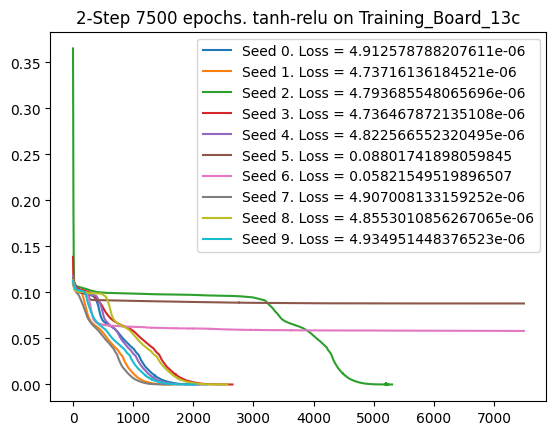

In [31]:
EPOCHS = 7500
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

KeyboardInterrupt: 

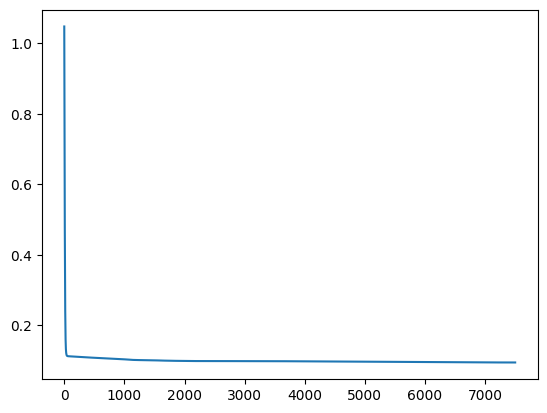

In [ ]:
EPOCHS = 7500
case_summary = {}
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(10, 111):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  if loss[-1] <= 10**-5:
    case_summary[seed] = True
  else:
    case_summary[seed] = False
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

performance = 100 * sum(case_summary.values()) / len(case_summary)
plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}. {performance:.1f}% success')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 54ms/step


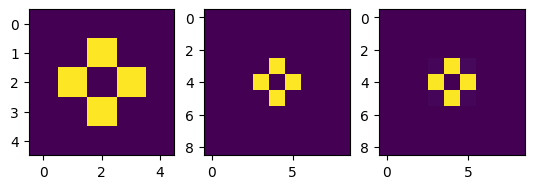

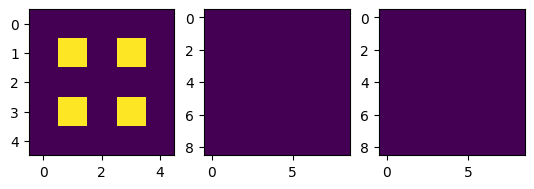

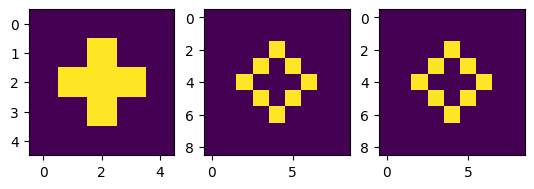

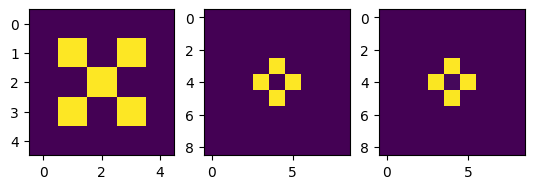

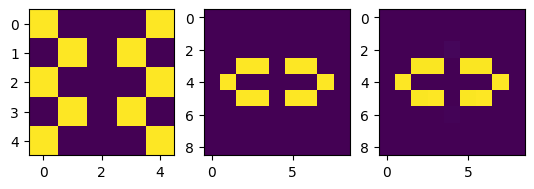

...

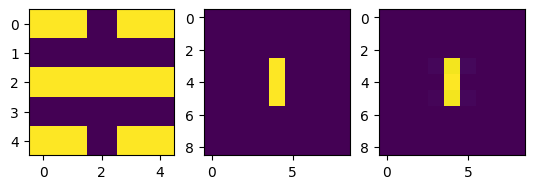

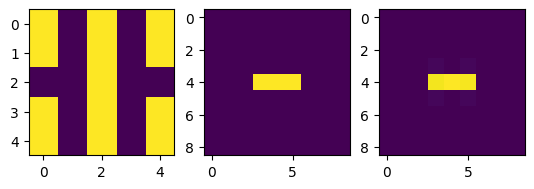

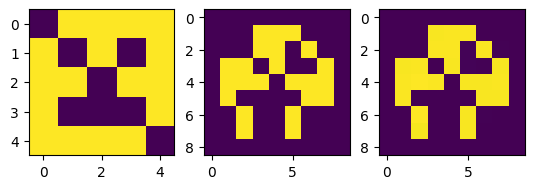

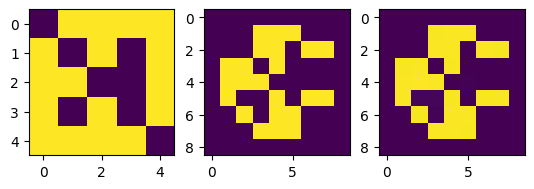

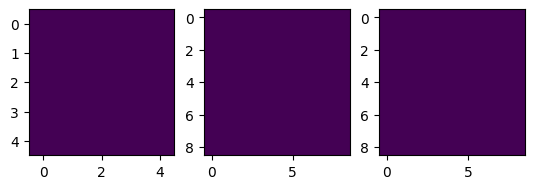

In [ ]:
# @title Check certain model on patches
SEED = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

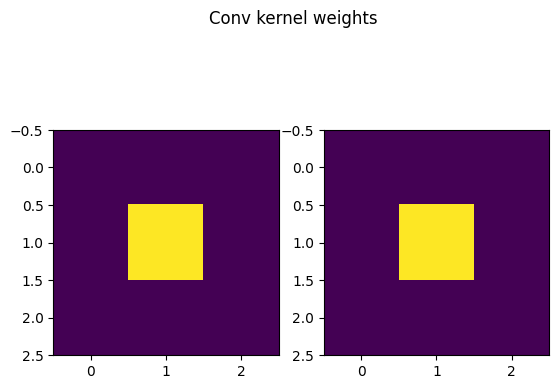

In [ ]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

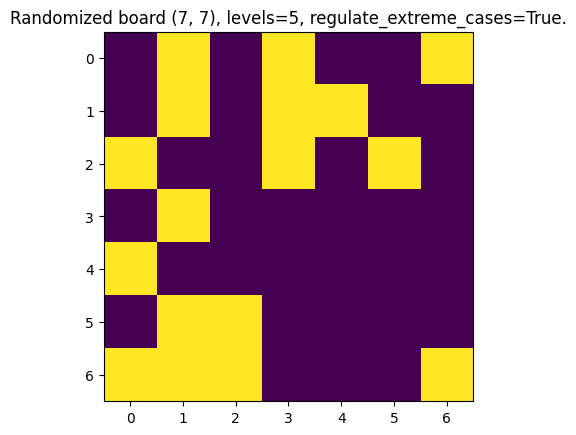

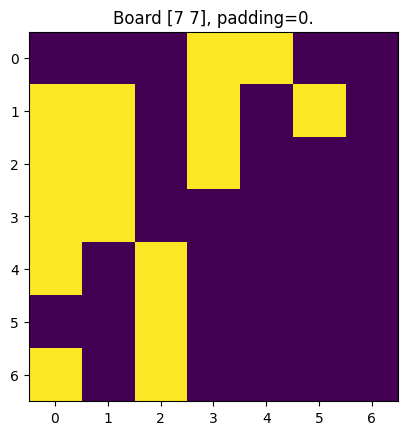

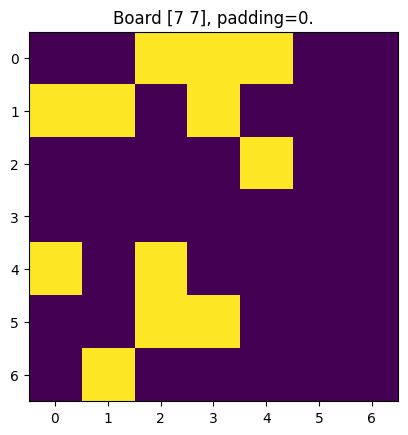

1/1 [==============================] - 0s 61ms/step


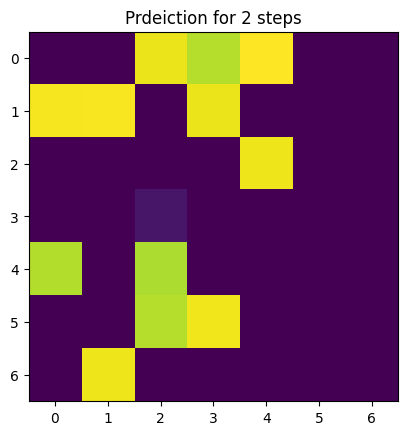

In [ ]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

## 1-Step Board 14: tanh-ReLU Conv Minimal

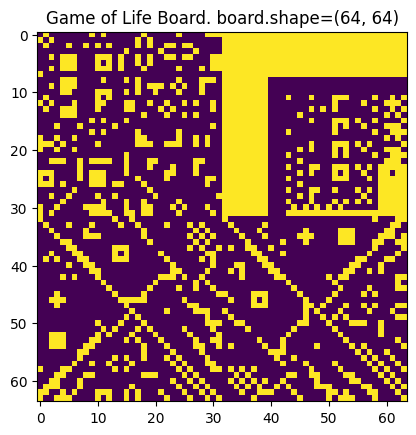

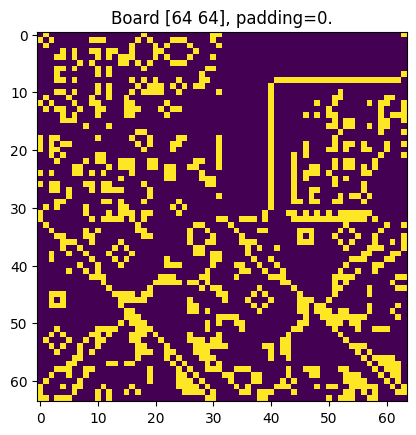

In [34]:
N_STEPS = 1
BOARD_NAME = 'Training_Board_14'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
# X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

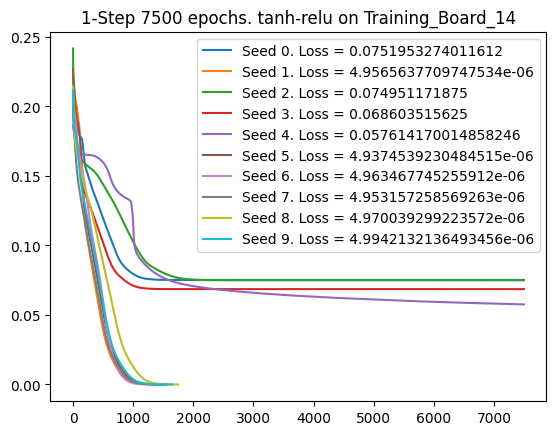

In [35]:
EPOCHS = 7500
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 50ms/step


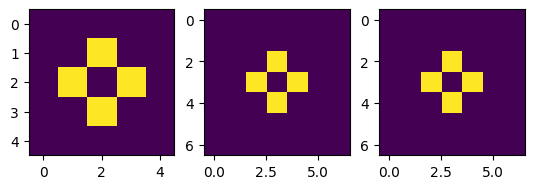

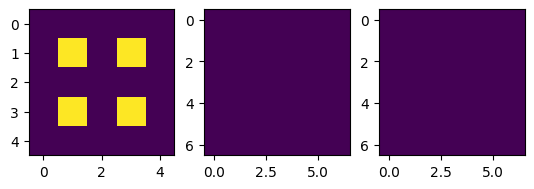

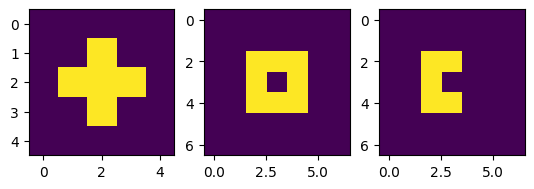

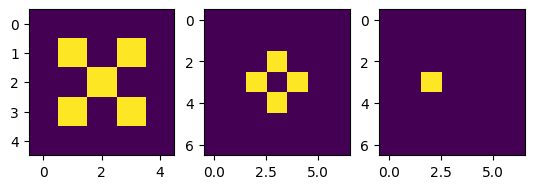

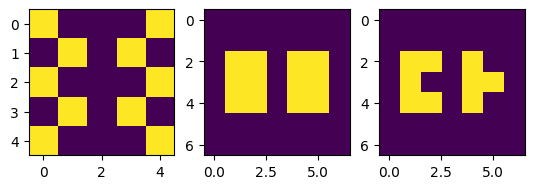

...

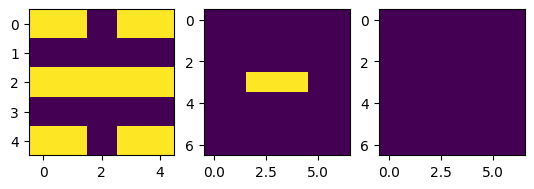

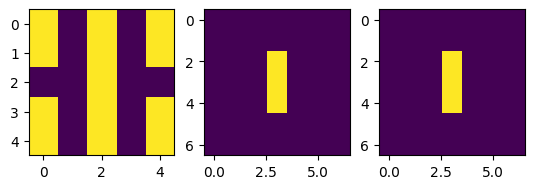

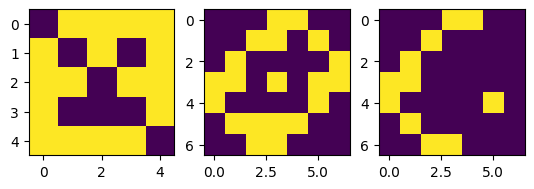

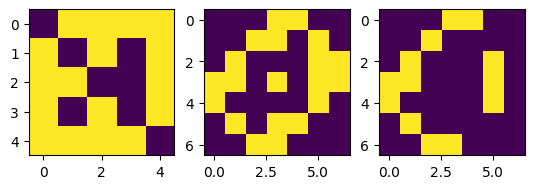

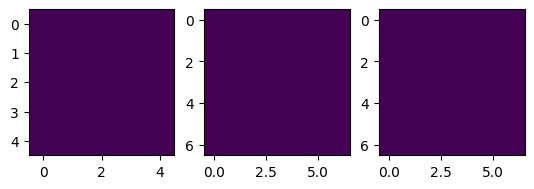

In [36]:
# @title Check certain model on patches
SEED = 0
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

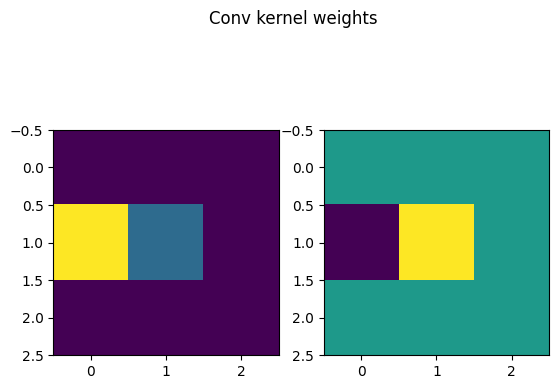

In [37]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

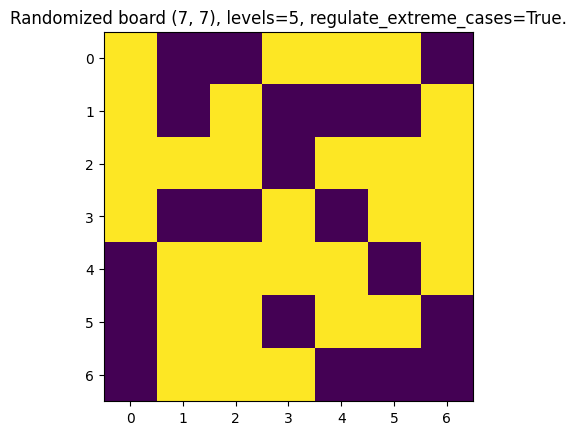

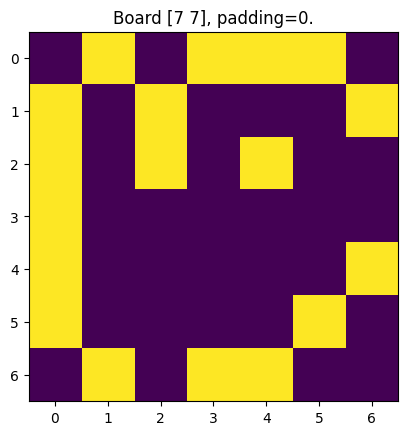

1/1 [==============================] - 0s 59ms/step


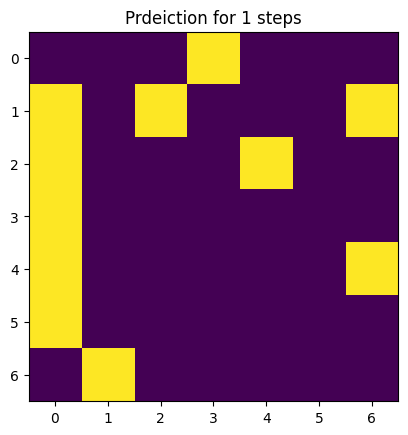

In [38]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

## 3-Step Board 14: tanh-ReLU Conv Minimal

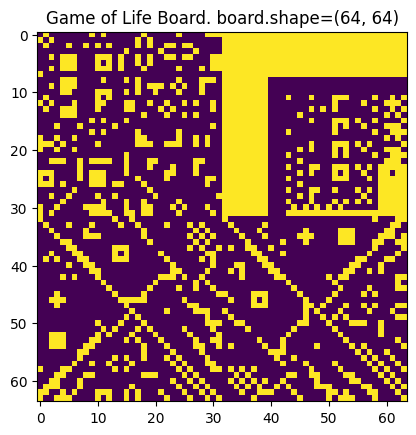

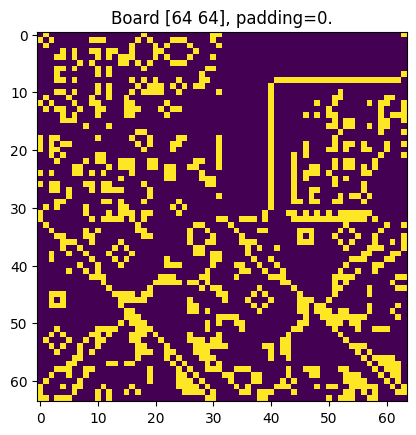

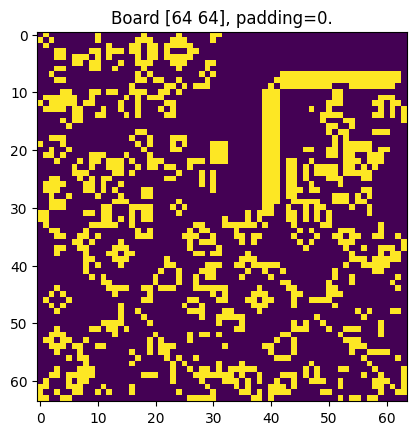

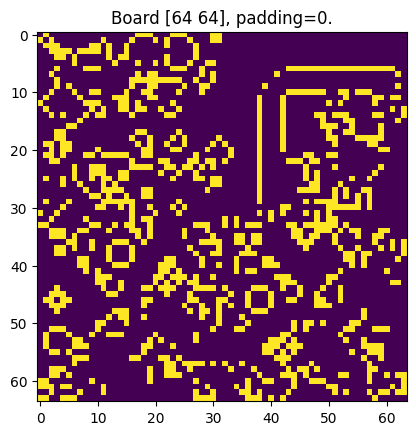

In [39]:
N_STEPS = 3
BOARD_NAME = 'Training_Board_14'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
# X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

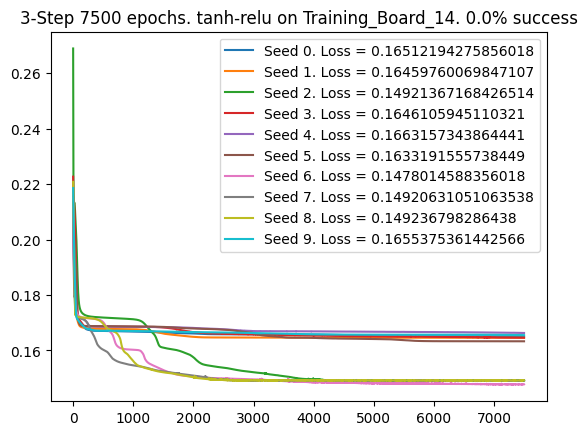

In [40]:
EPOCHS = 7500
case_summary = {}
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  if loss[-1] <= 10**-5:
    case_summary[seed] = True
  else:
    case_summary[seed] = False
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

performance = 100 * sum(case_summary.values()) / len(case_summary)
plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}. {performance:.1f}% success')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 54ms/step


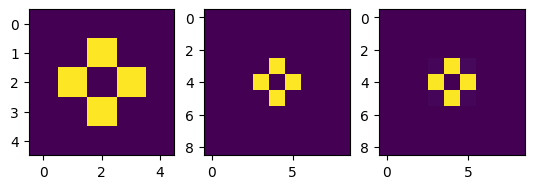

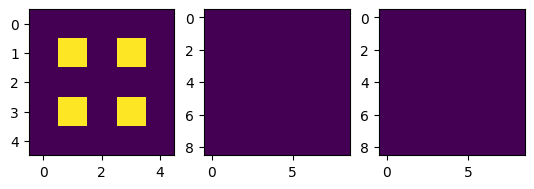

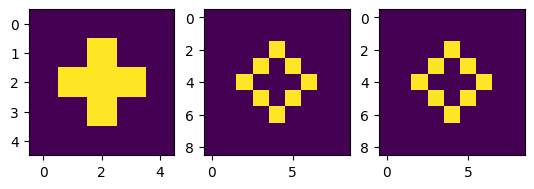

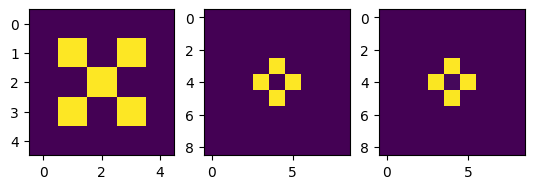

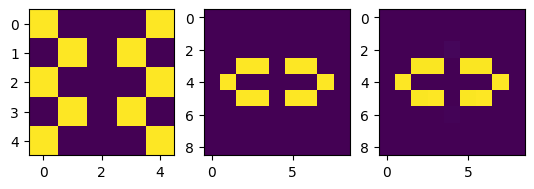

...

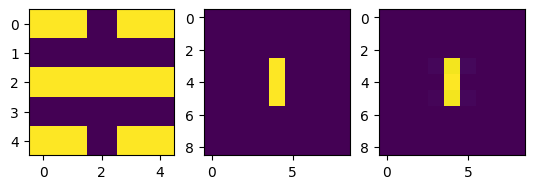

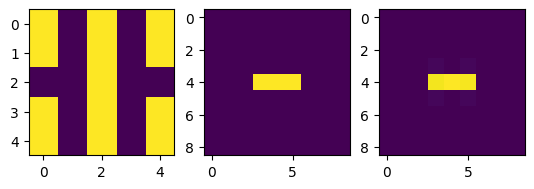

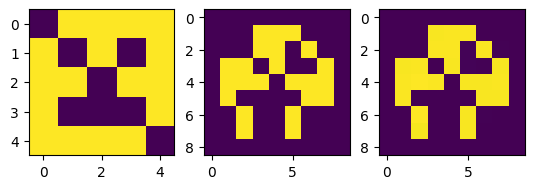

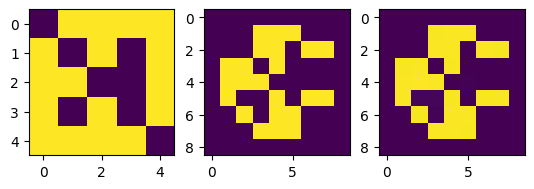

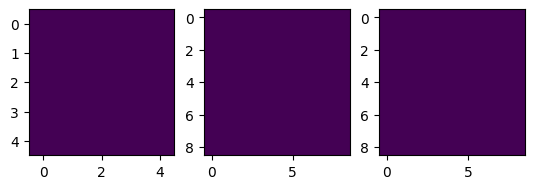

In [ ]:
# @title Check certain model on patches
SEED = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

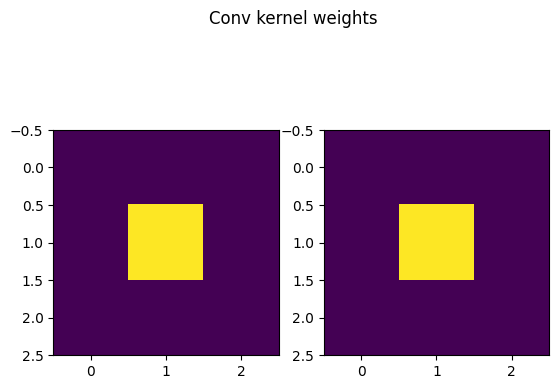

In [ ]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

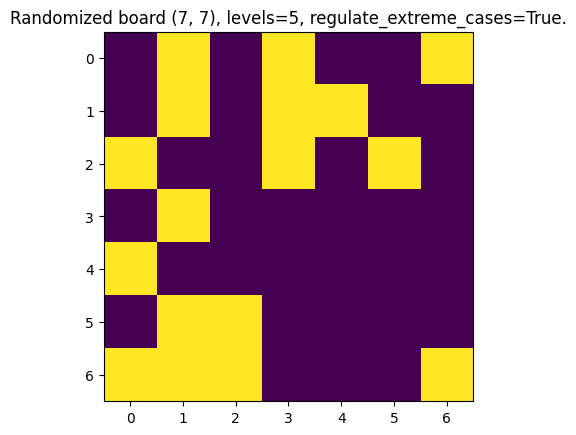

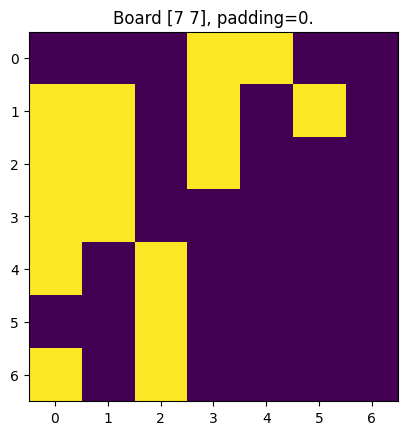

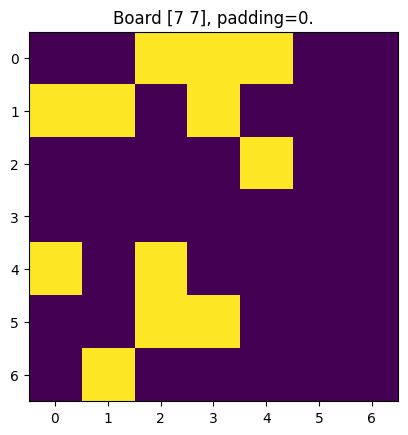

1/1 [==============================] - 0s 61ms/step


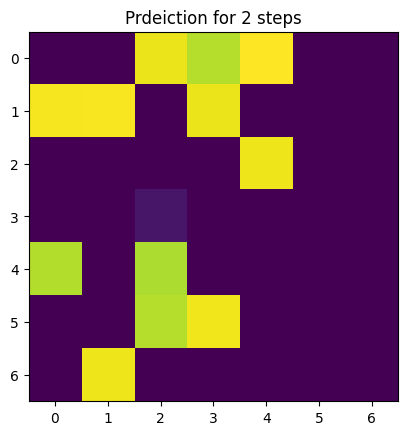

In [ ]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

## 1-Step Board 12: tanh-ReLU Conv Minimal

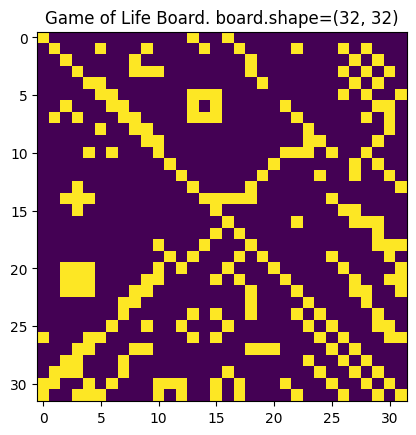

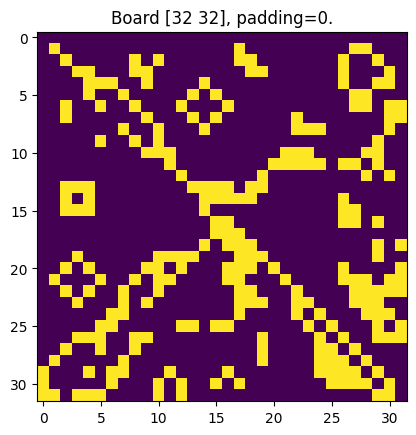

In [41]:
N_STEPS = 1
BOARD_NAME = 'Training_Board_12'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
# X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

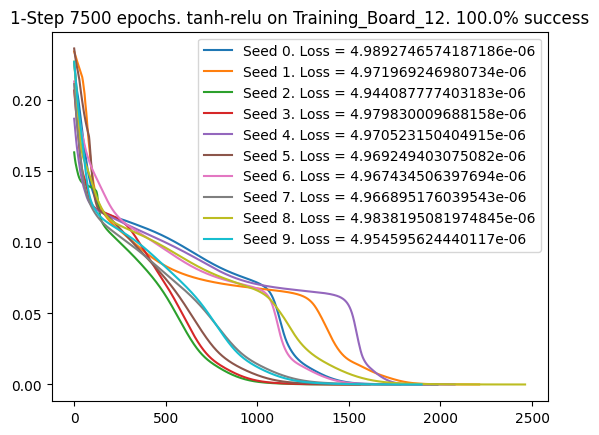

In [42]:
EPOCHS = 7500
case_summary = {}
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  if loss[-1] <= 10**-5:
    case_summary[seed] = True
  else:
    case_summary[seed] = False
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

performance = 100 * sum(case_summary.values()) / len(case_summary)
plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}. {performance:.1f}% success')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 52ms/step


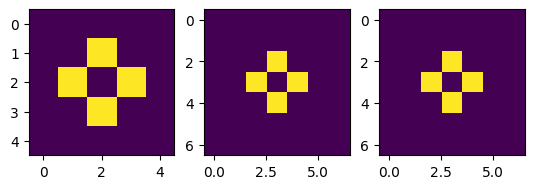

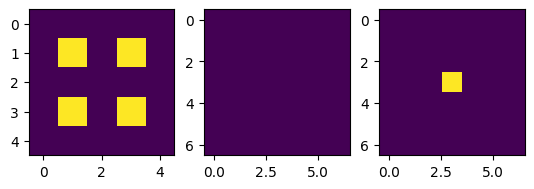

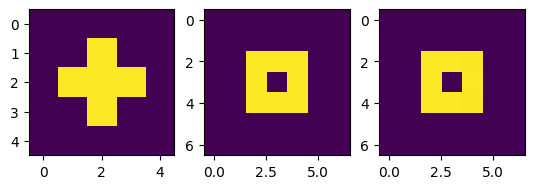

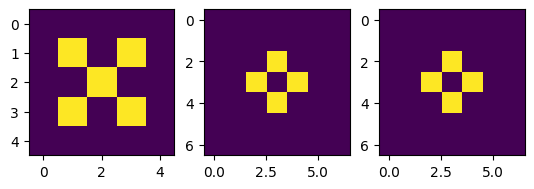

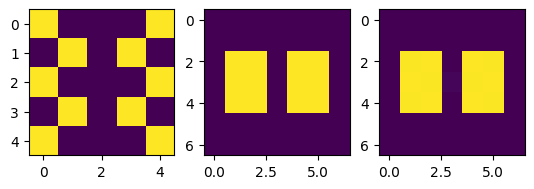

...

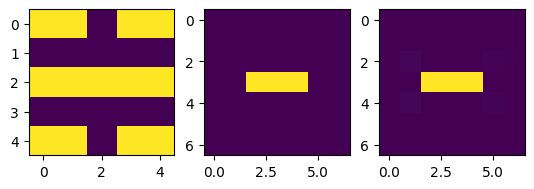

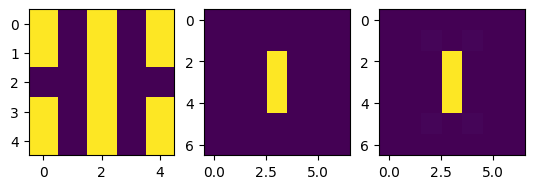

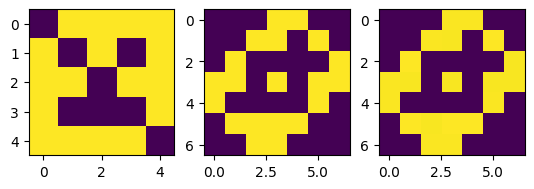

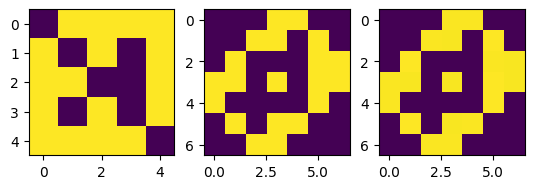

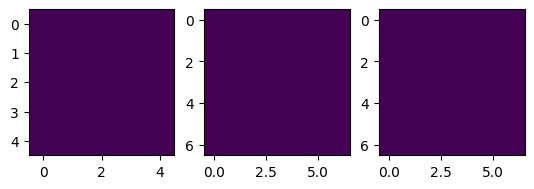

In [43]:
# @title Check certain model on patches
SEED = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

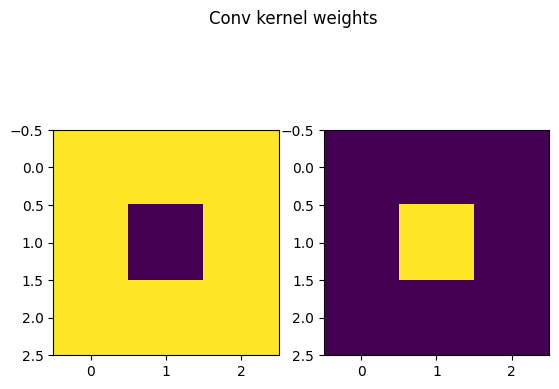

In [44]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

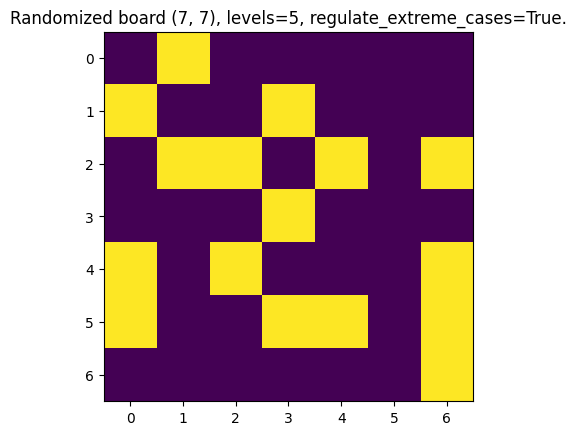

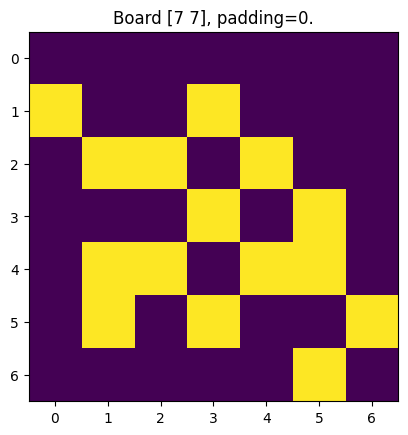

1/1 [==============================] - 0s 128ms/step


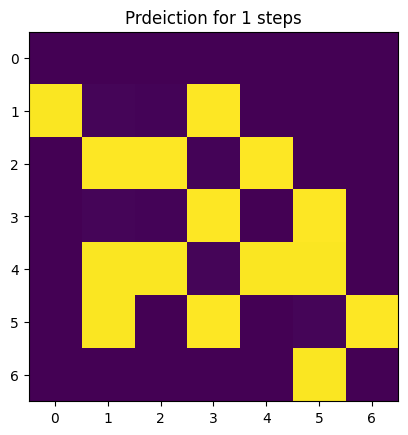

In [45]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

## 2-Step Board 12: tanh-ReLU Conv Minimal

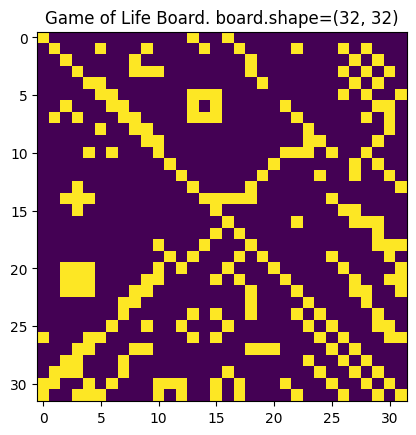

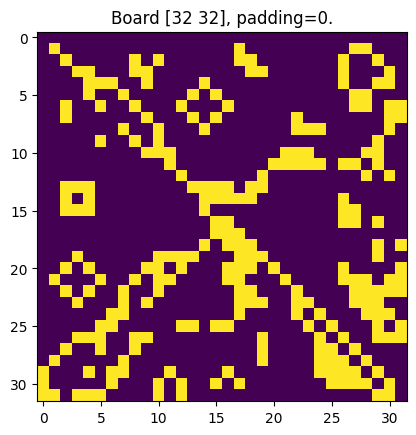

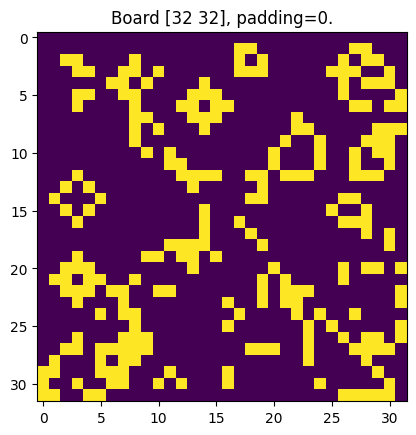

In [46]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_12'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
# X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

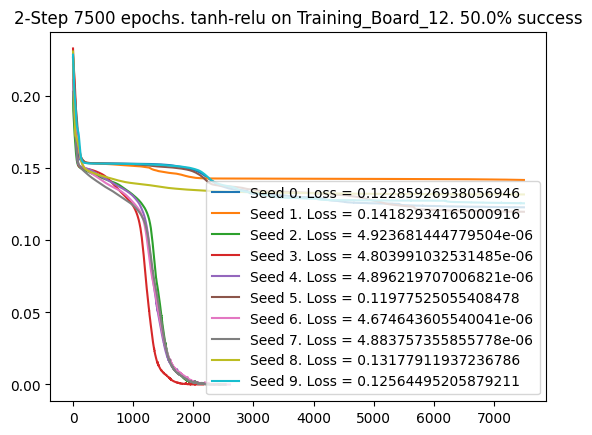

In [47]:
EPOCHS = 7500
case_summary = {}
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  if loss[-1] <= 10**-5:
    case_summary[seed] = True
  else:
    case_summary[seed] = False
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

performance = 100 * sum(case_summary.values()) / len(case_summary)
plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}. {performance:.1f}% success')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 52ms/step


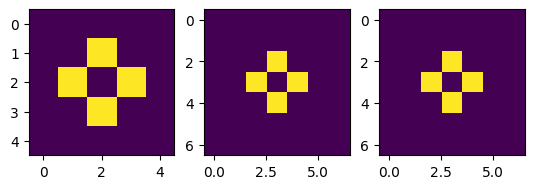

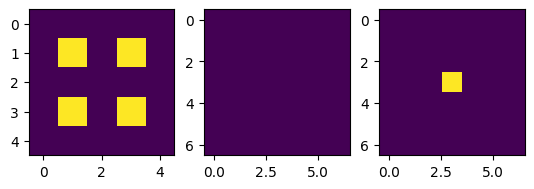

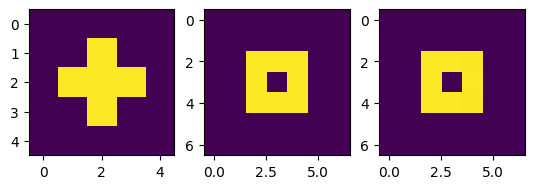

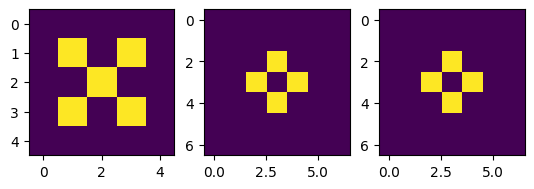

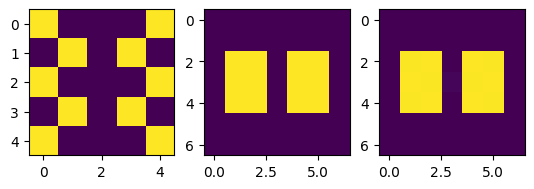

...

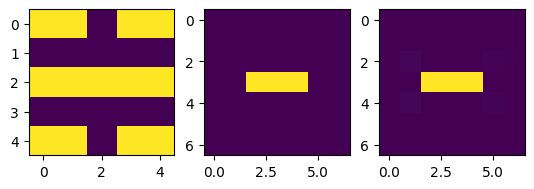

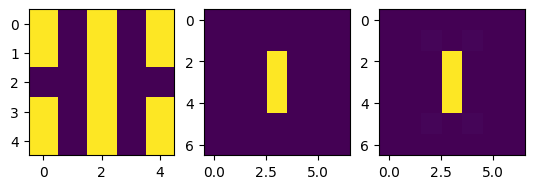

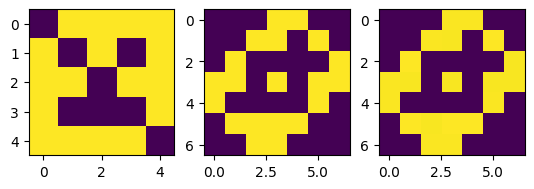

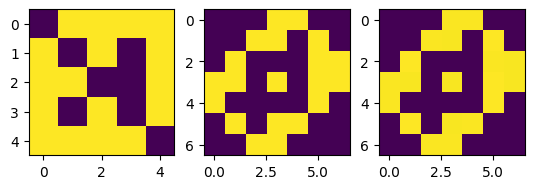

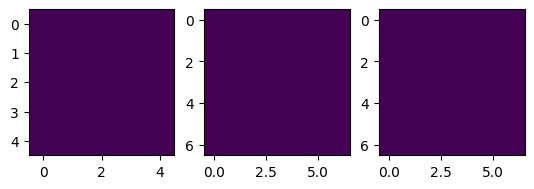

In [ ]:
# @title Check certain model on patches
SEED = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

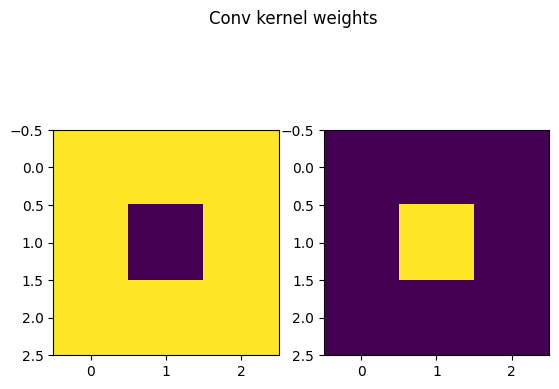

In [ ]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

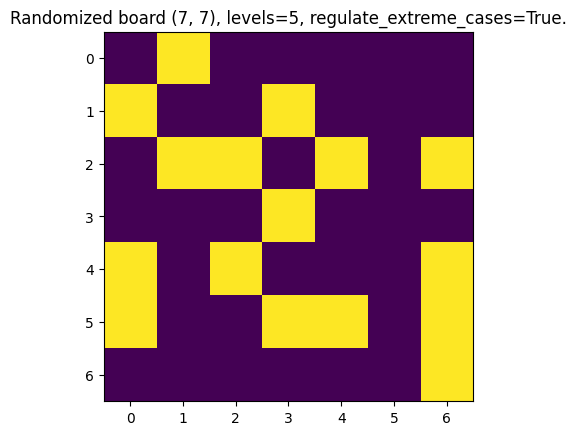

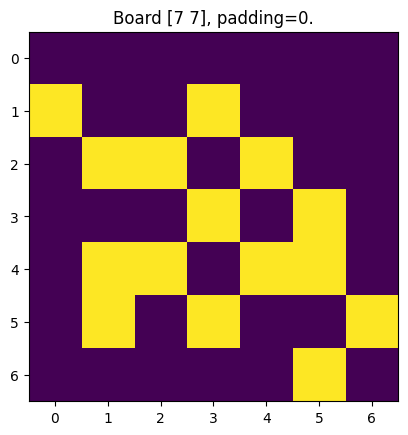

1/1 [==============================] - 0s 128ms/step


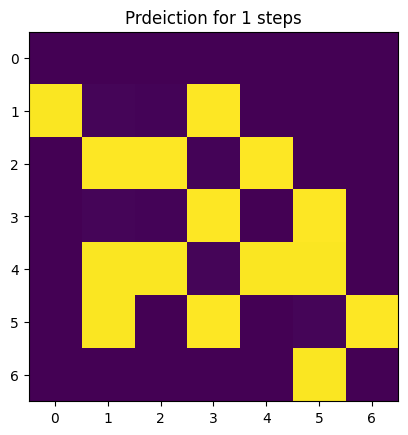

In [ ]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

## 1-Step Board 13с: tanh-ReLU Conv Minimal

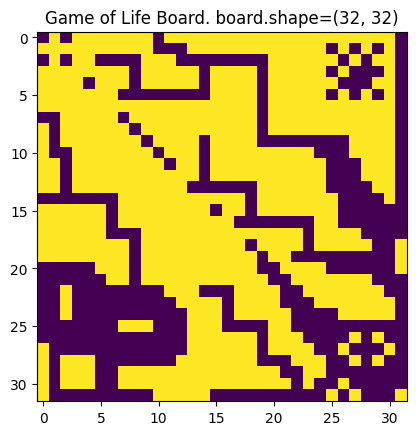

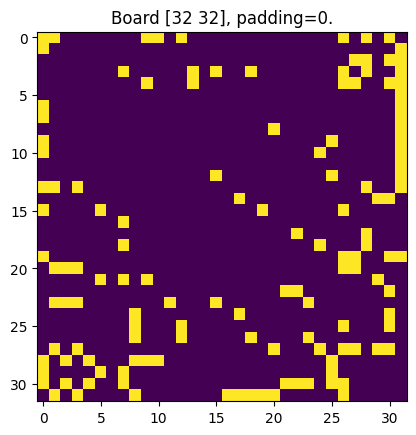

In [50]:
N_STEPS = 1
BOARD_NAME = 'Training_Board_13c'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
# X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

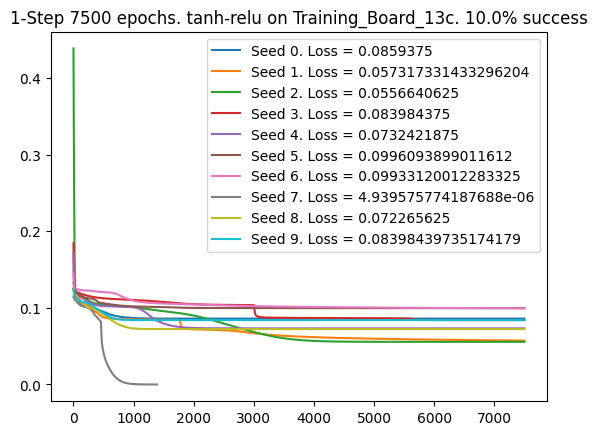

In [51]:
EPOCHS = 7500
case_summary = {}
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(10):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  if loss[-1] <= 10**-5:
    case_summary[seed] = True
  else:
    case_summary[seed] = False
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

performance = 100 * sum(case_summary.values()) / len(case_summary)
plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}. {performance:.1f}% success')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 45ms/step


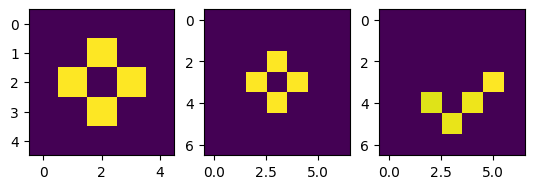

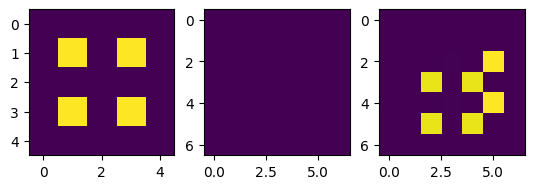

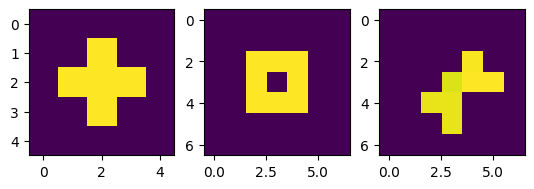

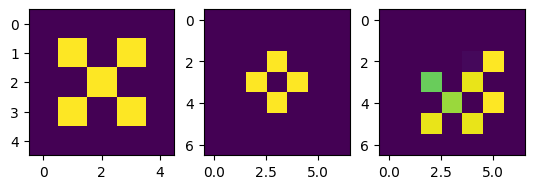

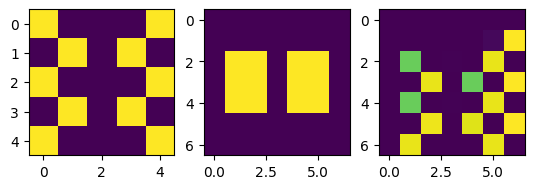

...

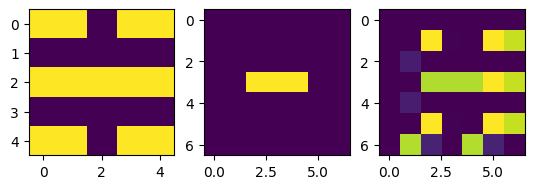

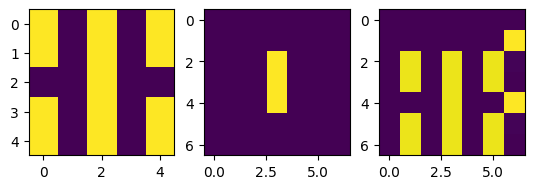

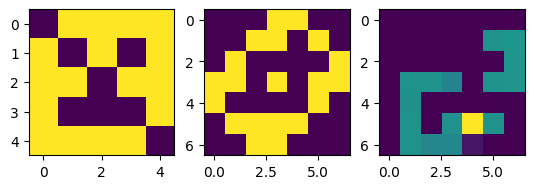

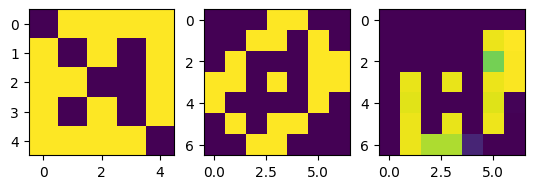

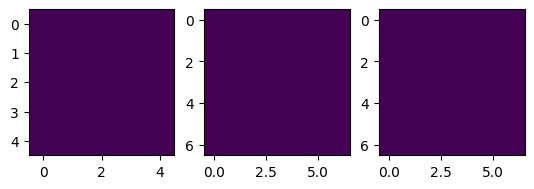

In [52]:
# @title Check certain model on patches
SEED = 1
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

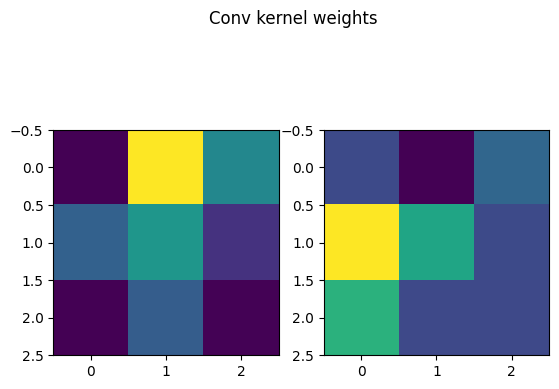

In [53]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

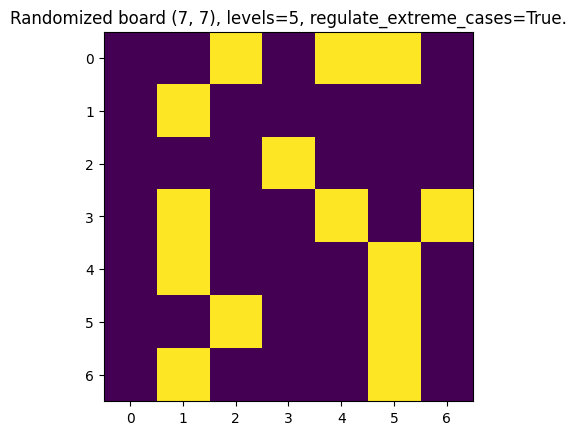

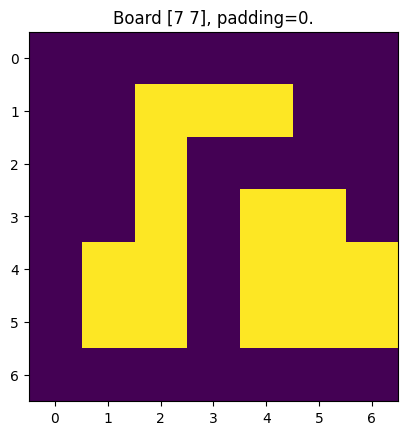

1/1 [==============================] - 0s 42ms/step


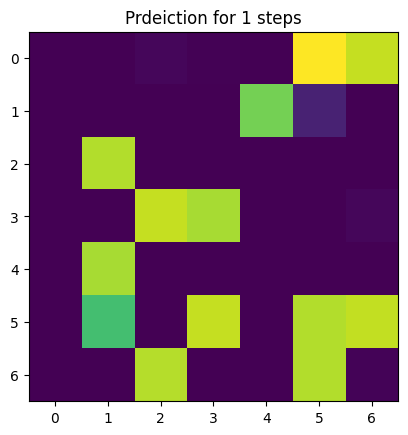

In [54]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

## 2-Step Board 13d X4: tanh-ReLU Conv Minimal

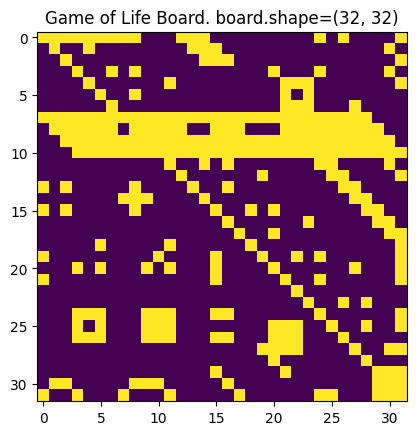

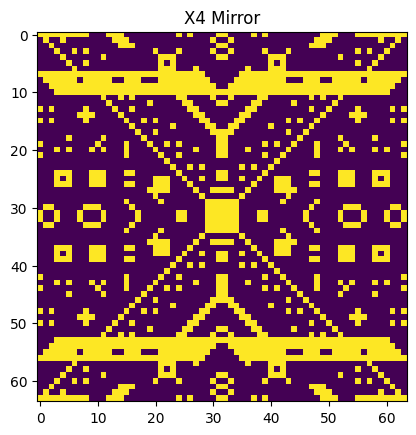

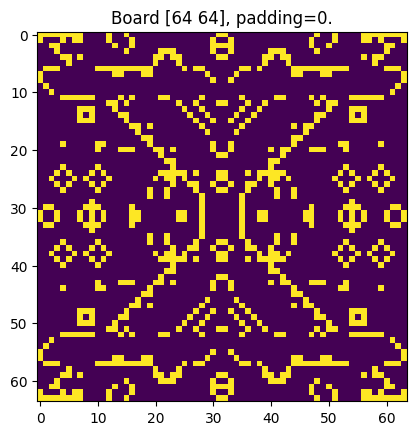

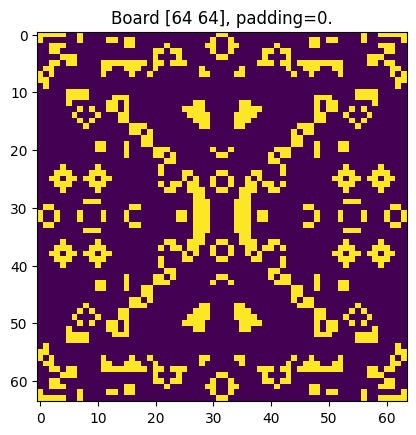

In [36]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_13d'
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

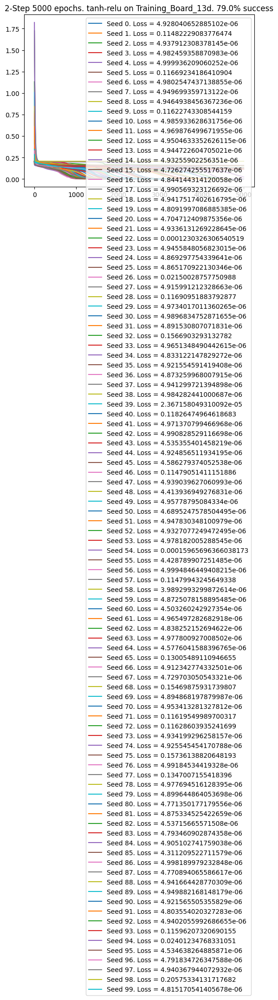

In [37]:
EPOCHS = 5000
case_summary = {}
early_stop = EarlyStoppingByLoss(value=5*10**-6, monitor='loss', verbose=False)
for seed in range(100):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  if loss[-1] <= 10**-5:
    case_summary[seed] = True
  else:
    case_summary[seed] = False
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

performance = 100 * sum(case_summary.values()) / len(case_summary)
plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}. {performance:.1f}% success')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

1/1 [==============================] - 0s 70ms/step


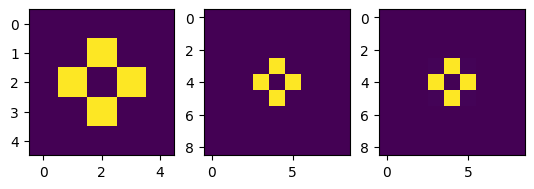

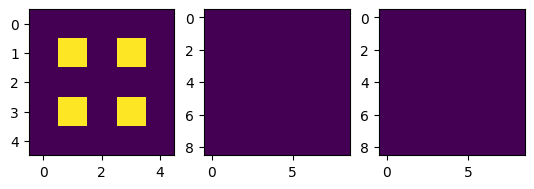

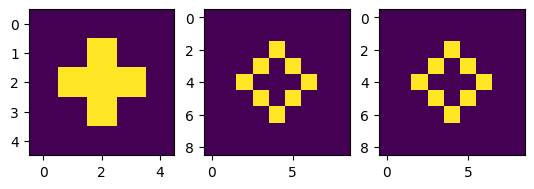

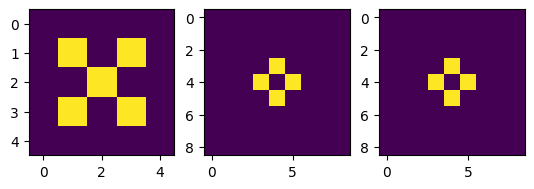

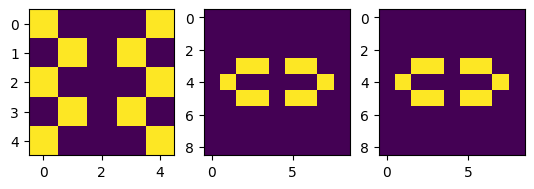

...

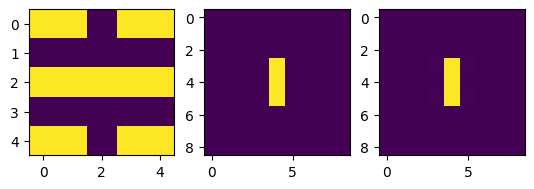

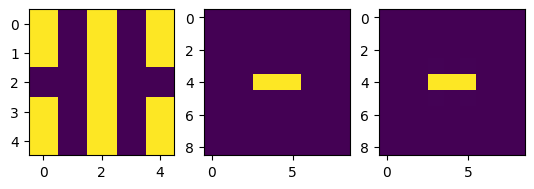

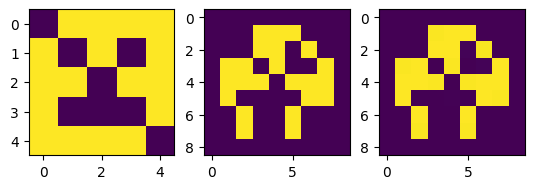

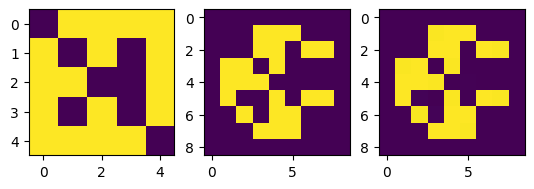

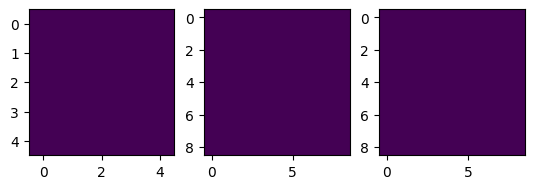

In [39]:
# @title Check certain model on patches
SEED = 2
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

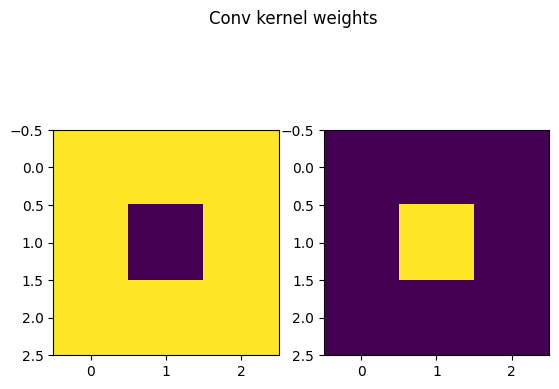

In [40]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

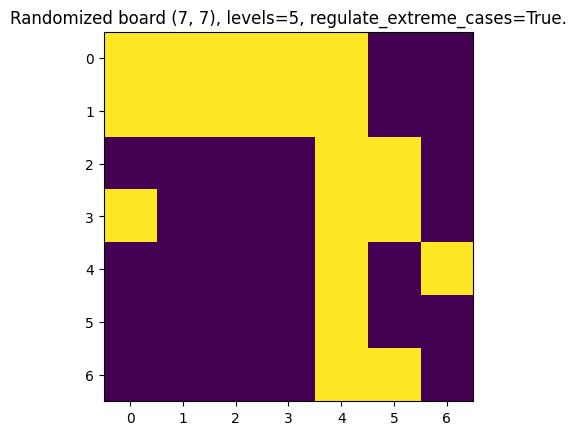

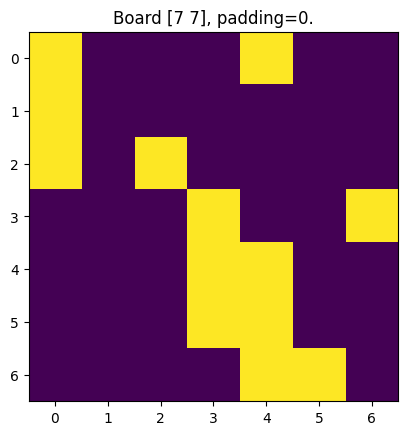

1/1 [==============================] - 0s 54ms/step


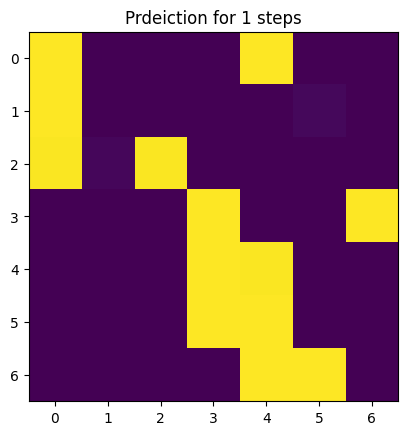

In [33]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

In [57]:
results_filename = f'boards_vs_seeds_{N_STEPS}_step.csv'
write_header = False if os.path.exists(results_filename) else True
pd.DataFrame(case_summary, index=[BOARD_NAME])\
    .astype(int)\
    .to_csv(results_filename, mode='a', header=write_header)

## 1-Step Board 13e X4: tanh-ReLU Conv Minimal

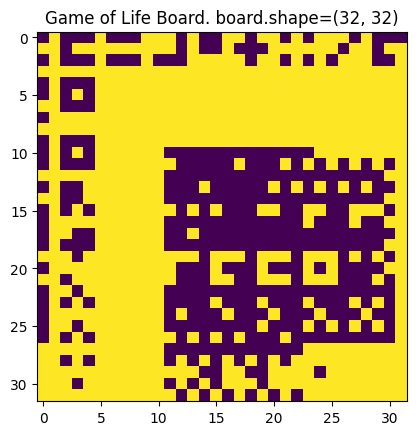

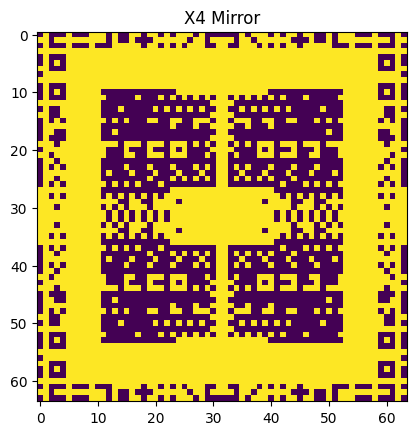

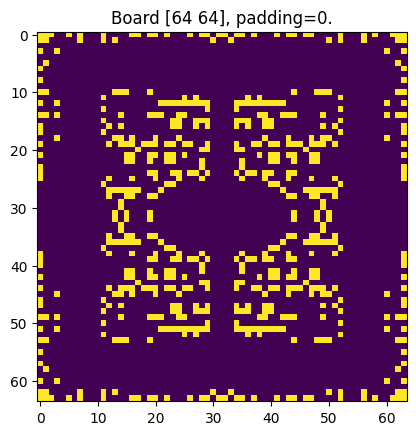

In [83]:
N_STEPS = 1
BOARD_NAME = 'Training_Board_13e'
TARGET_MSE = 5*10**-6
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

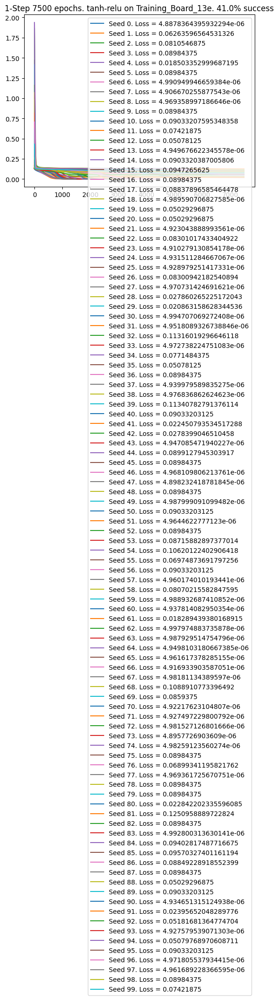

In [84]:
EPOCHS = 7500
case_summary = {}
early_stop = EarlyStoppingByLoss(value=TARGET_MSE, monitor='loss', verbose=False)
for seed in range(100):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  if loss[-1] <= 10**-5:
    case_summary[seed] = True
  else:
    case_summary[seed] = False
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

performance = 100 * sum(case_summary.values()) / len(case_summary)
plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}. {performance:.1f}% success')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

In [85]:
results_filename = f'boards_vs_seeds_{N_STEPS}_step.csv'
write_header = False if os.path.exists(results_filename) else True
pd.DataFrame(case_summary, index=[BOARD_NAME])\
    .astype(int)\
    .to_csv(results_filename, mode='a', header=write_header)

1/1 [==============================] - 0s 70ms/step


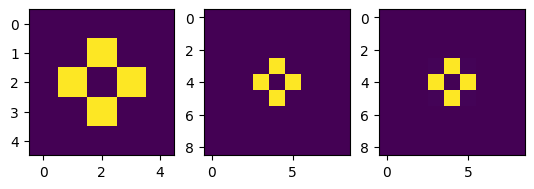

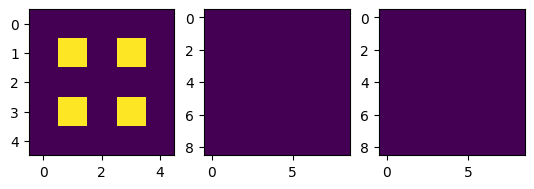

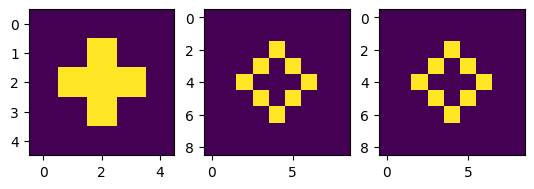

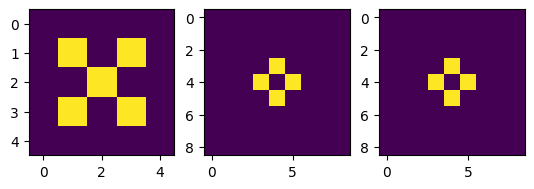

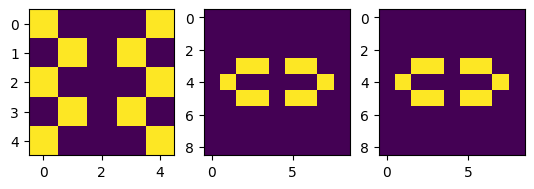

...

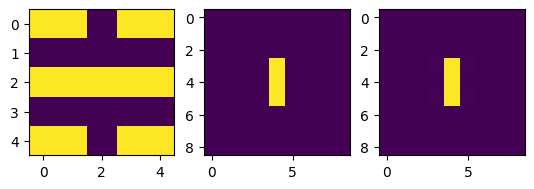

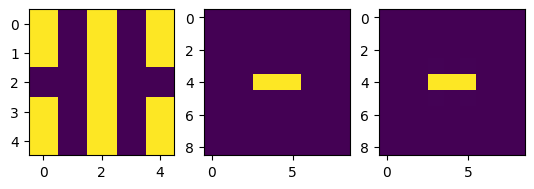

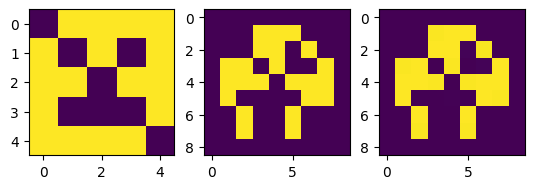

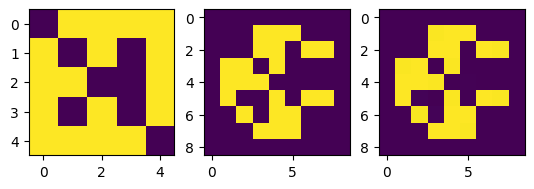

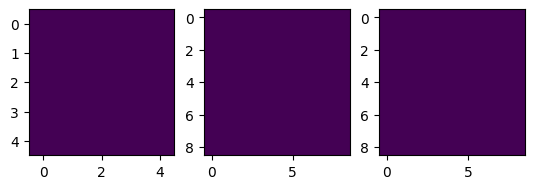

In [ ]:
# @title Check certain model on patches
SEED = 2
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

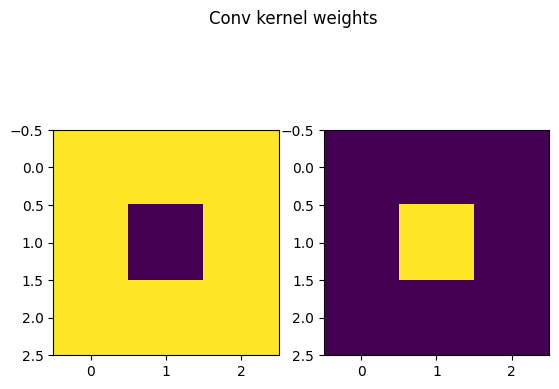

In [ ]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

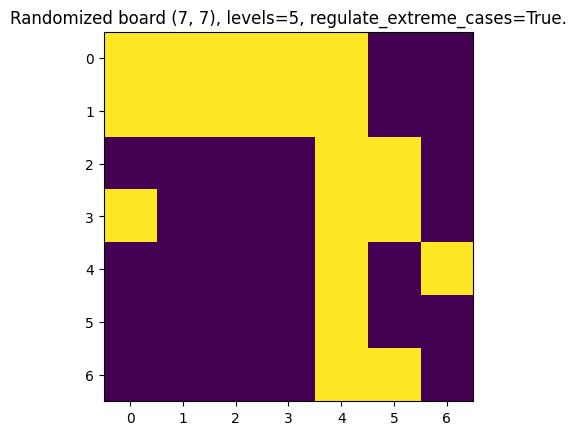

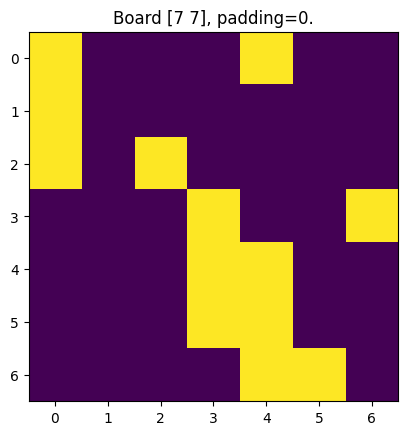

1/1 [==============================] - 0s 54ms/step


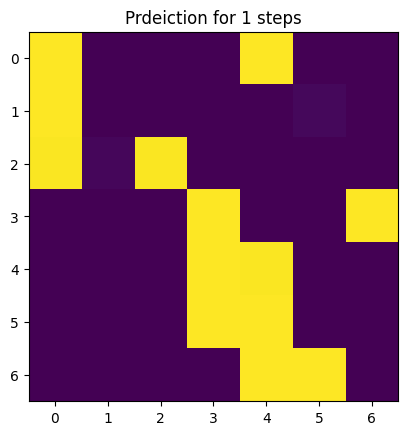

In [ ]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

## 2-Step Board 13e X4: tanh-ReLU Conv Minimal

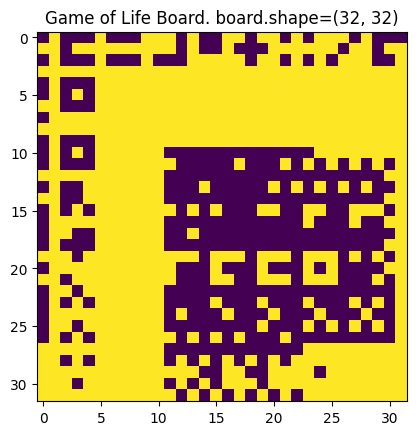

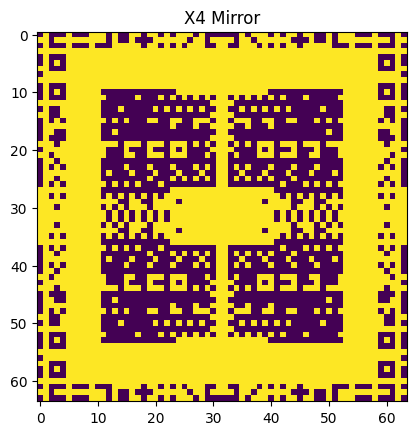

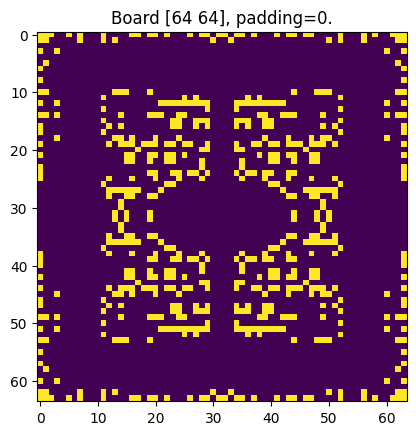

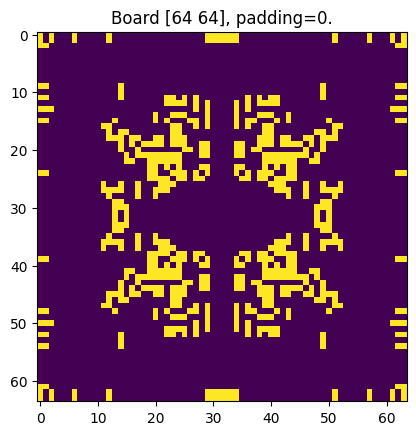

In [86]:
N_STEPS = 2
BOARD_NAME = 'Training_Board_13e'
TARGET_MSE = 5*10**-6
results[N_STEPS] = {}
results[N_STEPS][BOARD_NAME] = {}
X_train = load_board(sheet_name=BOARD_NAME, show=True)
X_train = x4_mirror(X_train, show=True)
y_train = play_n_steps(X_train, N_STEPS, show=True)
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

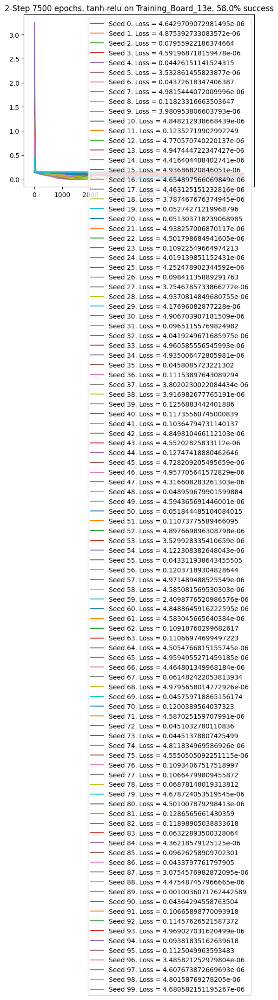

In [87]:
EPOCHS = 7500
case_summary = {}
early_stop = EarlyStoppingByLoss(value=TARGET_MSE, monitor='loss', verbose=False)
for seed in range(100):
  results[N_STEPS][BOARD_NAME][seed] = {}
  tf.random.set_seed(seed)
  model = get_minimal_model(seed)
  model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}' 
  results[N_STEPS][BOARD_NAME][seed]['model'] = model
  recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
  adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
  model.compile(optimizer=adam, loss='mse')
  recursive_model.compile(optimizer=adam, loss='mse')

  history = recursive_model.fit(
      X_train_ready,
      y_train_ready,
      epochs=EPOCHS,
      batch_size=1,
      verbose=False,
      callbacks=[
        cpt(model_name),
        TqdmCallback(verbose=True),
        early_stop
        ]
  )
  # model.save(f'models/{model_name}.hdf5')
  loss = history.history['loss']
  results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
  if loss[-1] <= 10**-5:
    case_summary[seed] = True
  else:
    case_summary[seed] = False
  label = f'Seed {seed}. Loss = {loss[-1]}'
  plt.plot(loss, label=label)

performance = 100 * sum(case_summary.values()) / len(case_summary)
plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}. {performance:.1f}% success')
plt.legend()
plt.show()

In [ ]:
# # @title continue training
# EPOCHS = 5000
# for seed in [9]:
#   tf.random.set_seed(seed)
#   model = results[N_STEPS][BOARD_NAME][seed]['model']
#   model_name = f'{N_STEPS}_steps_{BOARD_NAME}_seed_{seed}'
#   recursive_model = RecursiveModel(core_model=model, n_times=N_STEPS)
#   adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
#   model.compile(optimizer=adam, loss='mse')
#   recursive_model.compile(optimizer=adam, loss='mse')

#   history = recursive_model.fit(
#       X_train_ready,
#       y_train_ready,
#       epochs=EPOCHS,
#       batch_size=1,
#       verbose=False,
#       callbacks=[
#         cpt(model_name),
#         TqdmCallback(verbose=True)
#         ]
#   )
#   # model.save(f'models/{model_name}.hdf5')
#   loss = history.history['loss']
#   results[N_STEPS][BOARD_NAME][seed]['loss'] = loss
#   label = f'Seed {seed}. Loss = {loss[-1]}'
#   plt.plot(loss, label=label)

# plt.title(f'{N_STEPS}-Step {EPOCHS} epochs. tanh-relu on {BOARD_NAME}')
# plt.legend()
# plt.show()

In [ ]:
results_filename = f'boards_vs_seeds_{N_STEPS}_step.csv'
write_header = False if os.path.exists(results_filename) else True
pd.DataFrame(case_summary, index=[BOARD_NAME])\
    .astype(int)\
    .to_csv(results_filename, mode='a', header=write_header)

1/1 [==============================] - 0s 70ms/step


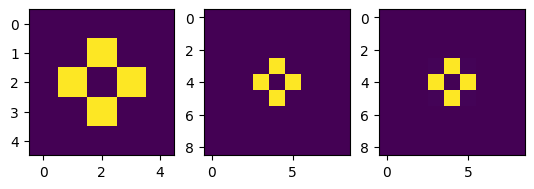

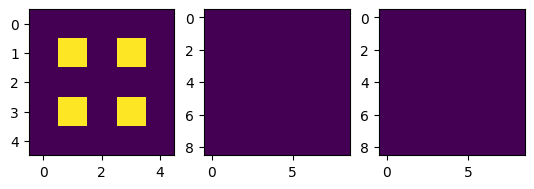

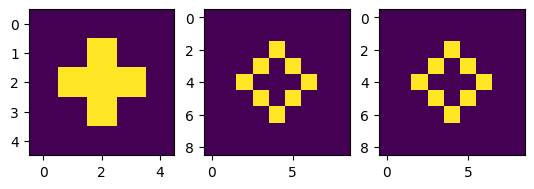

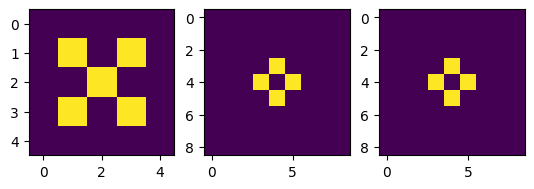

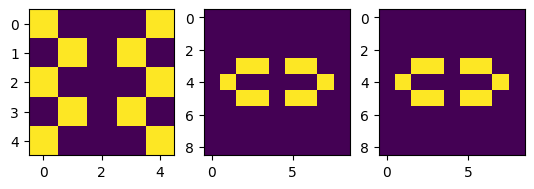

...

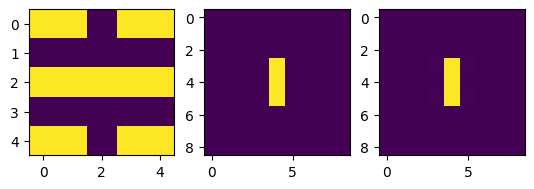

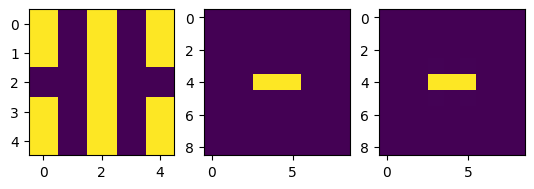

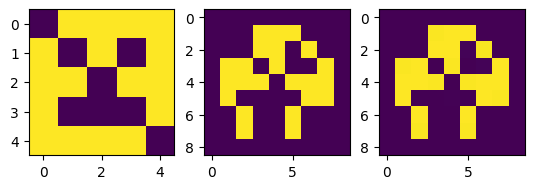

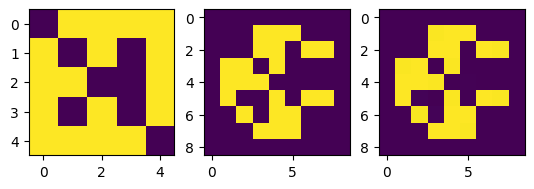

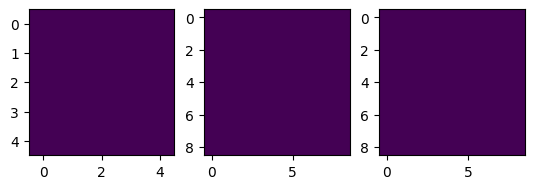

In [ ]:
# @title Check certain model on patches
SEED = 2
X_check, y_check, X_check_ready, y_check_ready = Xy_from_preset_5x5_patches(
    n_steps=N_STEPS,
    shuffle=False
    )
y_check_pred = RecursiveModel(results[N_STEPS][BOARD_NAME][SEED]['model'], N_STEPS)\
.predict(X_check_ready[..., None])
for xti, yti, ytpi in zip(X_check, y_check, y_check_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

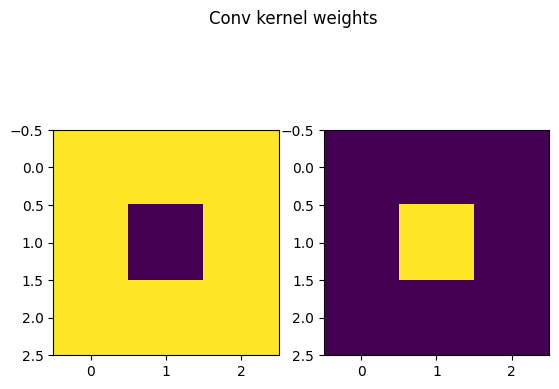

In [ ]:
# @title visualize kernel weights
fig, axes = plt.subplots(1, 2)
axes[0].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 0])
axes[1].imshow(results[N_STEPS][BOARD_NAME][SEED]['model'].weights[0][:, :, 0, 1])
plt.suptitle('Conv kernel weights')
plt.show()

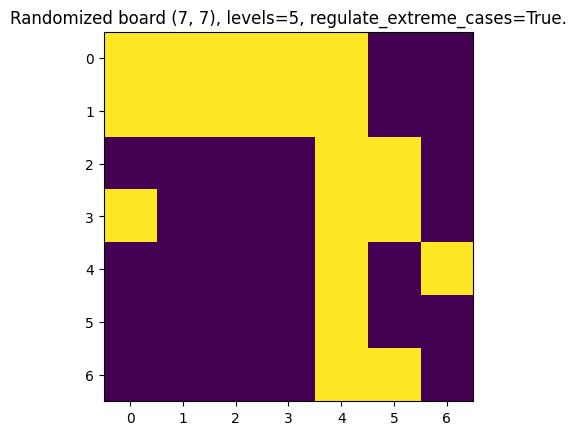

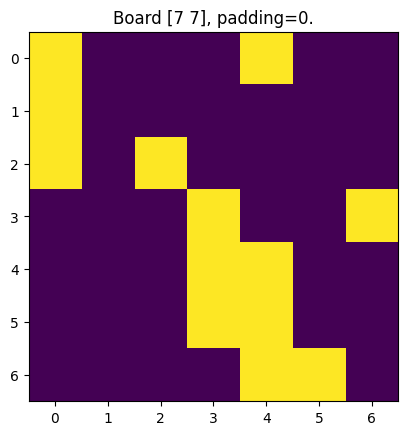

1/1 [==============================] - 0s 54ms/step


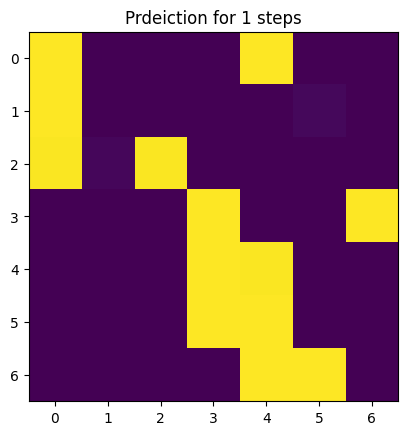

In [ ]:
# @title Test on a random board
core_model = results[N_STEPS][BOARD_NAME][SEED]['model']
X_test = generate_board((7, 7), show=True, regulate_extreme_cases=True)
y_test = play_n_steps(X_test, N_STEPS, show=True)
y_pred = RecursiveModel(core_model, N_STEPS)\
    .predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.title(f'Prdeiction for {N_STEPS} steps')
plt.imshow(y_pred)

# _____________________________

# Board test class defined

In [123]:
TARGET_MSE = 5*10**-6
EPOCHS = 7500
N_SEEDS = 100
LEARNING_RATE = 0.0025
OPTIMIZER_NAME = 'Adam'

class BoardTest:
    def __init__(
        self,
        n_steps,
        board_name,
        x4=False,
        seeds=None,
        epochs=EPOCHS,
        n_seeds=N_SEEDS,
        target_mse=TARGET_MSE,
        optimizer_name=OPTIMIZER_NAME,
        learning_rate=LEARNING_RATE
    ):
        self.n_steps = n_steps
        self.board_name = board_name
        self.x4 = x4
        self.epochs = epochs
        self.optimizer_name = optimizer_name
        self.learning_rate = learning_rate
        self.target_mse = target_mse

        self.models = {}
        self.losses = {}
        self.loss_histories = {}
        self.okays = {}

        self.seeds = seeds
        if self.seeds is None:
            self.n_seeds = n_seeds
            self.seeds = range(self.n_seeds)
        else:
            self.n_seeds = len(self.seeds)

        self.X_train = load_board(sheet_name=board_name, show=True)
        if self.x4:
            self.X_train = x4_mirror(self.X_train, show=True)
        self.y_train = play_n_steps(self.X_train, self.n_steps, show=True)
        self.X_train_ready = np.array(self.X_train)[None, ..., None]
        self.y_train_ready = np.array(self.y_train)[None, ...]

    def run_seed(self, seed, epochs, optimizer_name, learning_rate):
        tf.random.set_seed(seed)
        model = get_minimal_model(seed)
        model_name = f'{self.n_steps}_steps_{self.board_name}_seed_{seed}'
        recursive_model = RecursiveModel(core_model=model, n_times=self.n_steps)
        optimizers = {
            'Adafactor': tf.keras.optimizers.Adafactor(learning_rate=learning_rate),
            'Adam': tf.keras.optimizers.Adam(learning_rate=learning_rate),
            'Adamax': tf.keras.optimizers.Adamax(learning_rate=learning_rate),
            'AdamW': tf.keras.optimizers.AdamW(learning_rate=learning_rate),
            'Nadam': tf.keras.optimizers.Nadam(learning_rate=learning_rate),
        }               
        model.compile(optimizer=optimizers[optimizer_name], loss='mse')        
        recursive_model.compile(optimizer=optimizers[optimizer_name], loss='mse')
        history = recursive_model.fit(
            X_train_ready,
            y_train_ready,
            epochs=epochs,
            batch_size=1,
            verbose=False,
            callbacks=[
                cpt(model_name),
                TqdmCallback(verbose=True),
                early_stop
                ]
        )
        model_path = f'models/{model_name}.hdf5'
        if not os.path.exists(model_path):
            model.save(model_path)
        loss = history.history['loss']
        label = f'Seed {seed}. Loss = {loss[-1]}'
        plt.plot(loss, label=label)
        return model, loss

    def __call__(self):
        early_stop = EarlyStoppingByLoss(
            value=self.target_mse,
            monitor='loss',
            verbose=False
        )        
        for seed in self.seeds:
            model, loss = self.run_seed(
                seed,
                epochs=self.epochs,
                optimizer_name=self.optimizer_name,
                learning_rate=self.learning_rate
            )
            self.models[seed] = model
            self.loss_histories[seed] = loss
            self.losses[seed] = loss[-1]
            if loss[-1] <= self.target_mse:
                self.okays[seed] = True
            else:
                self.okays[seed] = False
        performance = 100 * sum(self.okays.values()) / len(self.okays)
        title = f'{self.n_steps}-Step on {self.board_name}.'
        title += f'{self.optimizer_name} {self.epochs} epochs.'
        title += f' {performance:.1f}% success'
        plt.title(title)
        plt.legend()
        plt.show()
        results_filename = f'boards_vs_seeds_{self.n_steps}_step_{self.epochs}_epochs.csv'
        write_header = False if os.path.exists(results_filename) else True
        losses_df = pd.DataFrame(self.losses, index=[self.board_name])
        losses_df.to_csv(results_filename, mode='a', header=write_header)        
        return losses_df

# Comparing Optimizers

## 2-Step Board Ones X4

In [129]:
GOOD_OPTIMIZERS = [
    # 'Adafactor',
    'Adam',
    'Adamax',
    'AdamW',
    'Nadam'
]    

In [ ]:
for optimizer_name in GOOD_OPTIMIZERS:
    BoardTest(n_steps=2, board_name='Training_Board_Ones', x4=True, seeds=None, n_seeds=100, optimizer_name=optimizer_name, learning_rate=0.005)()

### Ones, % success

In [151]:
optimizers_df = pd.read_csv('Ones 100 seeds for Adam Adamax AdamW Nadam.csv').drop(columns='Unnamed: 0')
optimizers_df.index = GOOD_OPTIMIZERS
optimizers_df = optimizers_df.T
(optimizers_df <= TARGET_MSE).mean() * 100

Adam      56.0
Adamax    53.0
AdamW     58.0
Nadam     56.0
dtype: float64

## 2-Step Board Zeros X4

In [ ]:
for optimizer_name in GOOD_OPTIMIZERS:
    BoardTest(n_steps=2, board_name='Training_Board_Zeros', x4=True, seeds=None, n_seeds=10, optimizer_name=optimizer_name, learning_rate=0.005)()

### Zeros, % success

In [150]:
optimizers_df = pd.read_csv('Zeros 10 seeds for Adam Adamax AdamW Nadam.csv').drop(columns='Unnamed: 0')
optimizers_df.index = GOOD_OPTIMIZERS
optimizers_df = optimizers_df.T
(optimizers_df <= TARGET_MSE).mean() * 100

Adam      60.0
Adamax    50.0
AdamW     70.0
Nadam     50.0
dtype: float64

# Tests (class)

## 1-Step Board 13f

In [ ]:
BoardTest(n_steps=2, board_name='Training_Board_13f', x4=True, seeds=None, n_seeds=10, epochs=2500, optimizer_name='AdamW', learning_rate=0.0025)()


# _____________________________